In [1]:
import numpy as np
import pandas as pd
import csv
import os
import matplotlib
import matplotlib.pyplot as plt
import math
import torch
import spinup
import multiprocessing as mp

from torch.autograd import Variable
from sklearn.linear_model import LinearRegression
from matplotlib import cm
from matplotlib.ticker import LinearLocator
from spinup.algos.pytorch.ddpg.core import MLPActorCritic

%matplotlib notebook

In [2]:
from src import *
from src.constants import DT, MAX_X, MAX_Y, BALL_ERROR_SCALING, BALL_D_ERROR_SCALING, BALL_INTEGRAL_ERROR_SCALING

In [9]:
train = False

In [10]:
with open('src/data/benchmark_trajectory.json') as json_file:
    benchmark_data = json.load(json_file)

In [11]:
t = np.array(benchmark_data['t'])
test_trajectory = np.array(benchmark_data['target'])
benchmark_trajectory = np.array(benchmark_data['trajectory'])
benchmark_angle = np.array(benchmark_data['angle'])
benchmark_u = np.array(benchmark_data['u'])

# Exploration

In [12]:
epoch = 250

In [13]:
root = 'src/data/black_box_controller/exploratory_penality'

In [15]:
def train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name, show_benchmark=False):
    if train:
        spinup.ddpg_pytorch(env_fn_gen(env, reward_fn, w),
                                actor_critic = ac,    
                                ac_kwargs = dict(hidden_sizes=hidden_size, activation=activation), 
                                seed = 0, 
                                steps_per_epoch = 1100, 
                                epochs = epoch, 
                                replay_size = 300000, 
                                gamma = 0.99, 
                                polyak = 0.995, 
                                pi_lr = 0.001,
                                q_lr = 0.001,
                                batch_size = 500, 
                                start_steps = 15000,
                                act_noise = 0.1,
                                max_ep_len = 400,
                                update_every= 100,
                                num_test_episodes=20,
                                logger_kwargs = dict(output_dir='{}/{}'.format(root, name), exp_name='test'),
                                )
    trained_ac = torch.load('{}/{}/pyt_save/model.pt'.format(root, name))
    evaluator_ddpg = env()
    history_ddpg, error_ddpg, u_ddpg, angle_ddpg, loss_ddpg = evaluator_ddpg.simulate(trained_ac, test_trajectory)

    w = trained_ac.pi.state_dict()

    saved_weights = {}
    for key, value in w.items():
        saved_weights[key] = value.detach().numpy().tolist()

    with open('{}/{}/pyt_save/model.json'.format(root, name), 'w') as json_file:
        json.dump(saved_weights, json_file, indent=1)
    
    print("MSE :", loss_ddpg)

    log = pd.read_csv('{}/{}/progress.txt'.format(root, name), sep='\t')
    fig, axs = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
    axs[0].plot(log['AverageEpRet'].rolling(window=20).mean(), linewidth=1)
    axs[0].set_ylabel('AvergeEpRet')
    axs[0].legend()
    axs[2].set_xlabel('Epoch')

    axs[1].plot(log['LossPi'])
    axs[1].set_ylabel('Actor loss')
    axs[2].set_xlabel('Epoch')

    axs[2].plot(log['LossQ'])
    axs[2].set_ylabel('Critic loss')
    axs[2].set_xlabel('Epoch')

    fig, axs = plt.subplots(5, 1, sharex=True, figsize=(10, 10))

    axs[0].plot(t, history_ddpg[0, :], label='x_ddpg')
    axs[0].plot(t, test_trajectory[0, :], label='target')
    if show_benchmark:
        axs[0].plot(t, benchmark_trajectory[0, :], label='x_benchmark')
    axs[0].set_ylabel('Ball position x [m]')
    axs[0].set_ylim([-MAX_X, MAX_X])
    axs[0].legend()

    axs[1].plot(t, history_ddpg[1,:], label='y_ddpg')
    axs[1].plot(t, test_trajectory[1, :], label='target')
    if show_benchmark:
        axs[1].plot(t, benchmark_trajectory[1, :], label='y_benchmark')
    axs[1].set_ylabel('Ball position y [m]')
    axs[1].set_ylim([-MAX_X, MAX_X])
    axs[1].legend()

    axs[2].plot(t, error_ddpg[0, :], label='x')
    axs[2].plot(t, error_ddpg[1, :], label='y')
    if show_benchmark:
        axs[2].plot(t, benchmark_trajectory[0, :] - test_trajectory[0, :], label='benchmark x')
        axs[2].plot(t, benchmark_trajectory[1, :] - test_trajectory[1, :], label='benchmark y')
    axs[2].set_ylabel('Ball error [m]')
    axs[2].set_ylim([-MAX_X, MAX_X])
    axs[2].legend()

    axs[3].plot(t, angle_ddpg[0, :], label='angle_ddpg')
    axs[3].plot(t, u_ddpg[0, :], label='u_ddpg')
    if show_benchmark:
        axs[3].plot(t, benchmark_u[0, :], label='u benchmark')
    axs[3].set_ylabel('Motor x angle [deg]')
    axs[3].legend()

    axs[4].plot(t, angle_ddpg[1, :], label='angle_ddpg')
    axs[4].plot(t, u_ddpg[1, :], label='u_ddpg')
    if show_benchmark:
        axs[4].plot(t, benchmark_u[1, :], label='u benchmark')
    axs[4].set_xlabel('Time [s]')
    axs[4].set_ylabel('Motor y angle [deg]')
    axs[4].legend()

    plt.show()
    
    w = trained_ac.pi.state_dict()

    saved_weights = {}
    for key, value in w.items():
        saved_weights[key] = value.detach().numpy().tolist()

    with open('{}/{}/pyt_save/model.json'.format(root, name), 'w') as json_file:
        json.dump(saved_weights, json_file, indent=1)
        
    if show_benchmark:
        print("MSE ddpg", loss_ddpg)
        print("MSE benchmark", 0.0001483028)
        traj = {
           ' trajectory': history_ddpg.tolist(),
            'error': error_ddpg.tolist()
        }
        with open('src/data/final_blackbox_trajectory.json', 'w') as json_file:
            json.dump(traj, json_file)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.44740208847906315


<IPython.core.display.Javascript object>


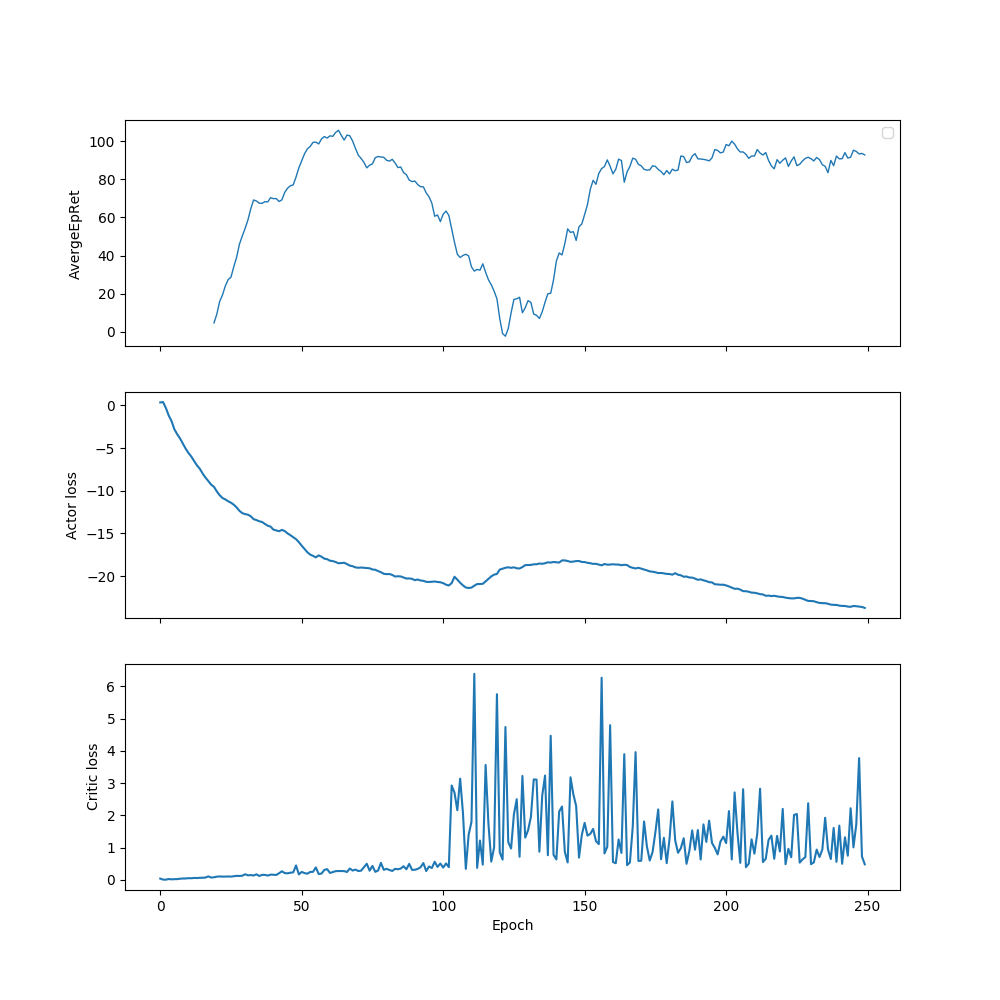

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


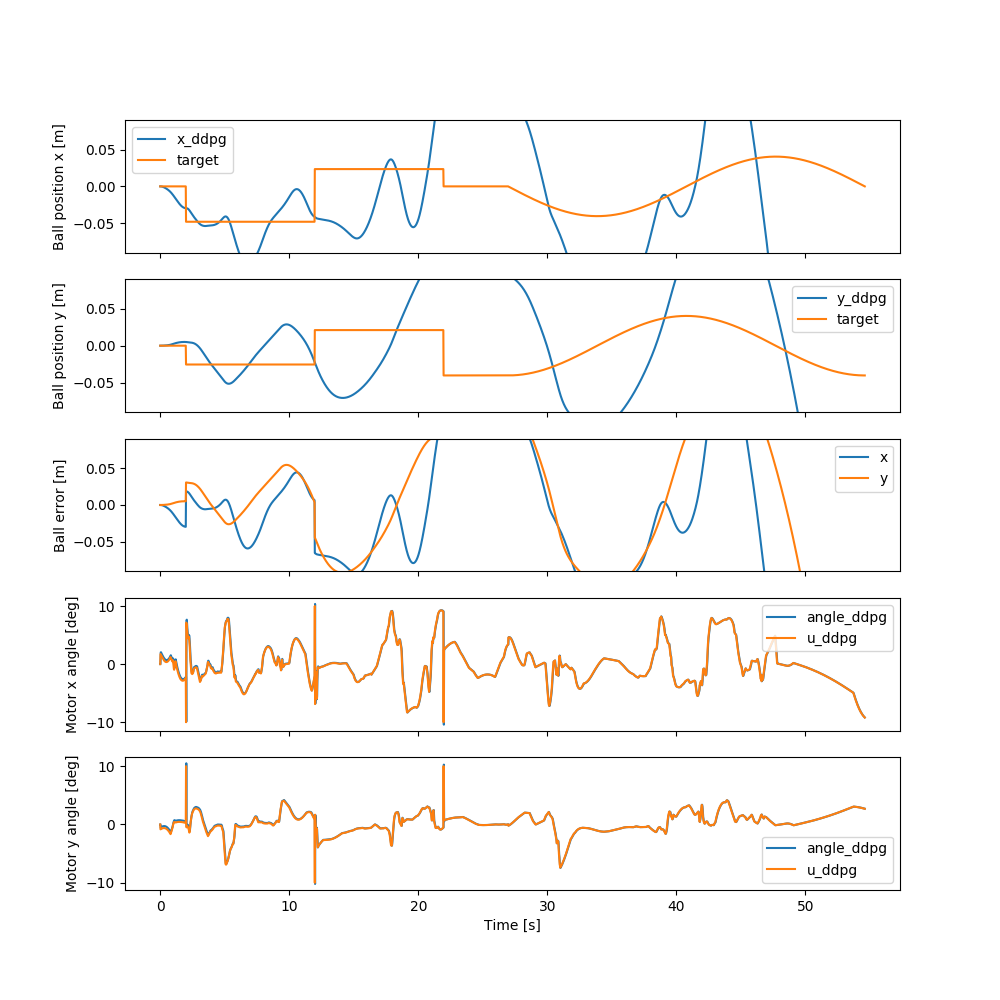

In [9]:
env = BBEnv #1
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [50]
activation = torch.nn.ReLU
name='lep_0.6_[50]_relu'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -6836.226599465952


<IPython.core.display.Javascript object>


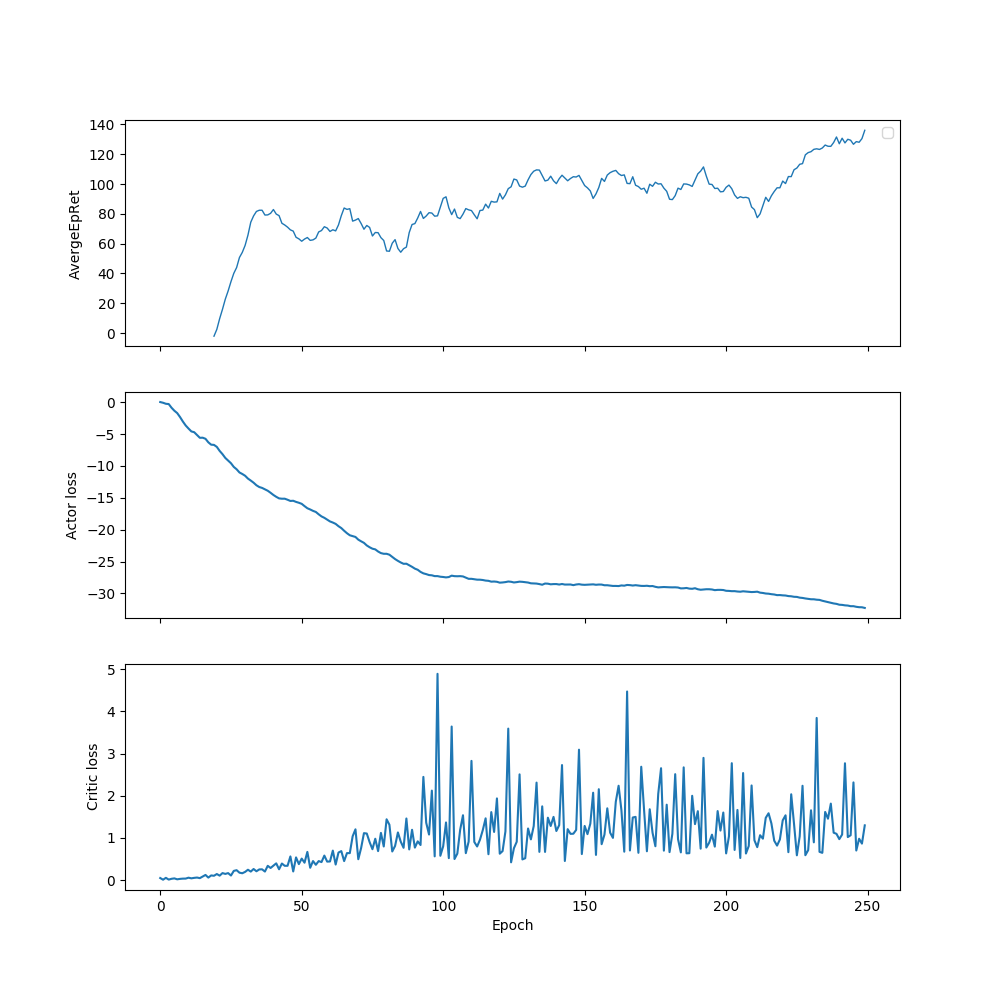

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


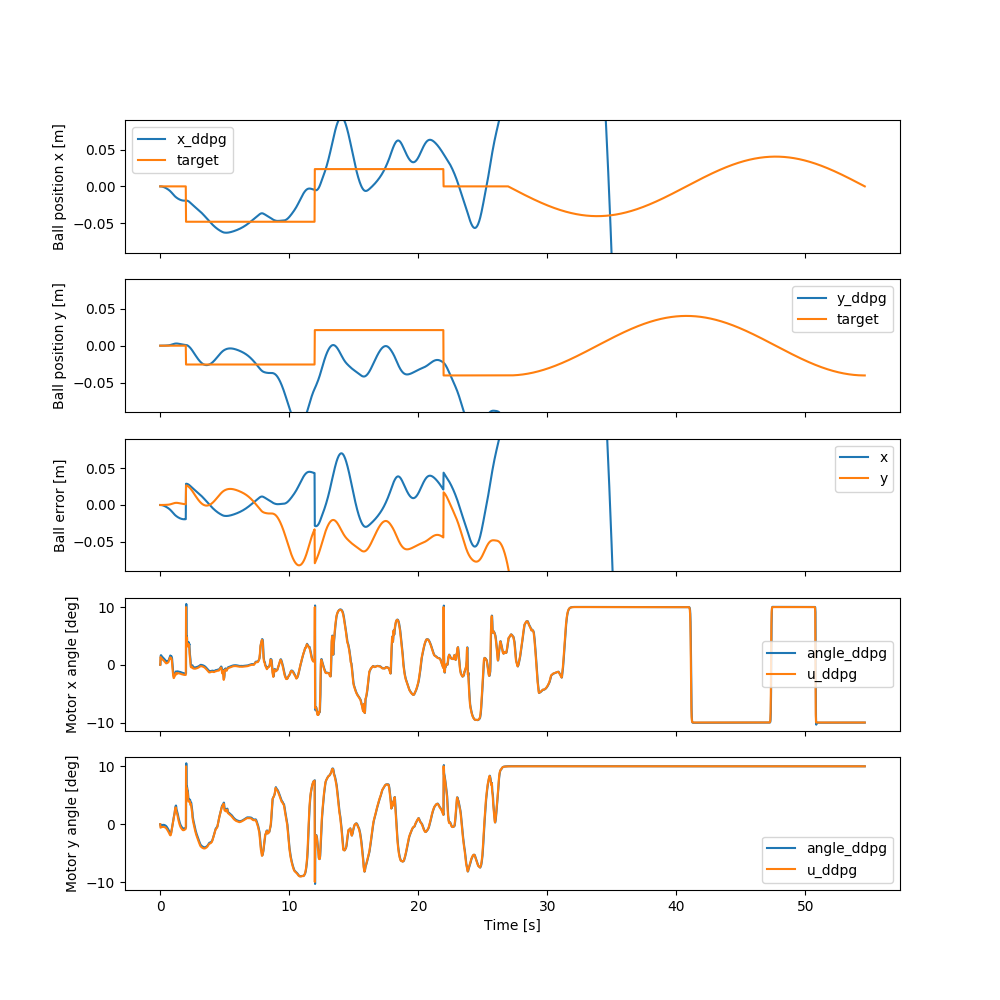

In [11]:
env = BBEnv #2
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200]
activation = torch.nn.ReLU
name='lep_0.6_[200]_relu'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.0010927469405367291


<IPython.core.display.Javascript object>


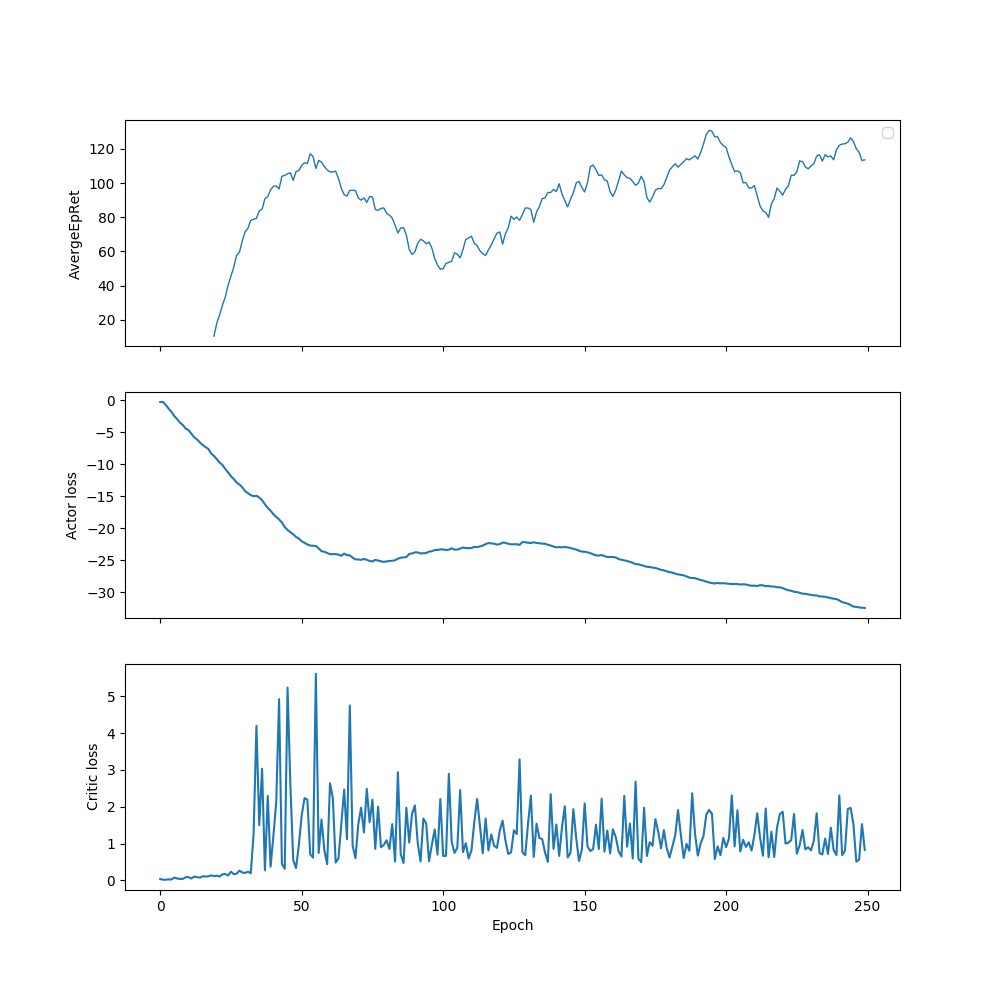

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


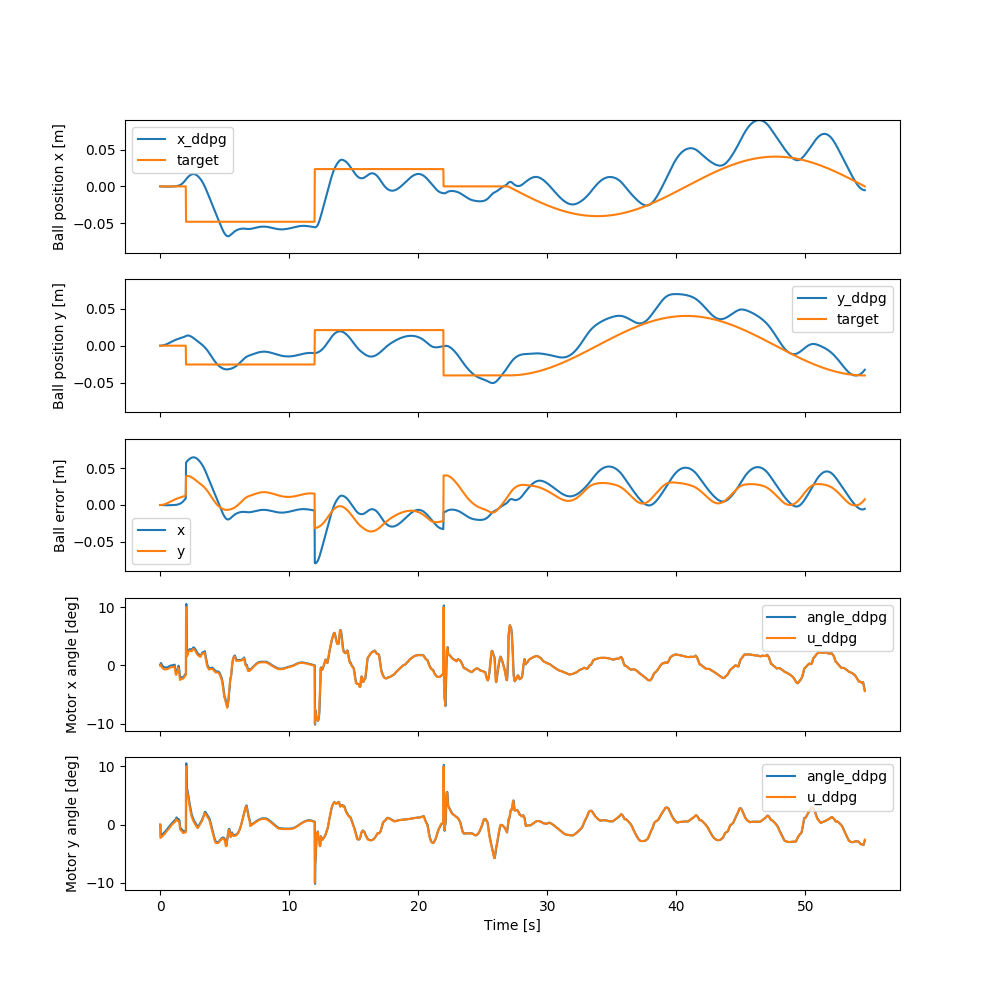

In [12]:
env = BBEnv #3
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400]
activation = torch.nn.ReLU
name='lep_0.6_[400]_relu'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller/exploratory_penality/lep_0.6_[400,200]_relu/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"ReLU",
        "hidden_sizes":	[
            400,
            200
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fb11c1a8198>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller/exploratory_penality/lep_0.6_[400,200]_relu",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller/exploratory_penality/lep_0.6_[400,200]_relu/progress.txt' mode='w' encoding='UTF-8'>":	{
                    "mode":	"w"
           

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -31.6 |
|          StdEpRet |            15.1 |
|          MaxEpRet |           -11.3 |
|          MinEpRet |           -47.3 |
|  AverageTestEpRet |            78.6 |
|      StdTestEpRet |              31 |
|      MaxTestEpRet |             142 |
|      MinTestEpRet |            40.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.11 |
|          StdQVals |            3.01 |
|          MaxQVals |            56.1 |
|          MinQVals |           -9.94 |
|            LossPi |           -3.36 |
|             LossQ |           0.122 |
|              Time |             178 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |            4.87 |
|          StdEpRet |            52.1 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            41.9 |
|          StdEpRet |             4.2 |
|          MaxEpRet |            46.1 |
|          MinEpRet |            37.7 |
|  AverageTestEpRet |            95.1 |
|      StdTestEpRet |              56 |
|      MaxTestEpRet |             189 |
|      MinTestEpRet |            5.78 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            9.77 |
|          StdQVals |            8.54 |
|          MaxQVals |            42.5 |
|          MinQVals |           -22.3 |
|            LossPi |             -10 |
|             LossQ |           0.647 |
|              Time |             495 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             103 |
|          StdEpRet |            57.3 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            70.6 |
|          StdEpRet |            28.2 |
|          MaxEpRet |              94 |
|          MinEpRet |            30.9 |
|  AverageTestEpRet |             112 |
|      StdTestEpRet |            42.7 |
|      MaxTestEpRet |             171 |
|      MinTestEpRet |            4.25 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |              22 |
|          StdQVals |            17.8 |
|          MaxQVals |             131 |
|          MinQVals |           -19.9 |
|            LossPi |           -22.4 |
|             LossQ |            3.41 |
|              Time |             825 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |            40.6 |
|          StdEpRet |            29.4 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |           -64.1 |
|          StdEpRet |            13.4 |
|          MaxEpRet |           -50.7 |
|          MinEpRet |           -77.5 |
|  AverageTestEpRet |            42.8 |
|      StdTestEpRet |            59.1 |
|      MaxTestEpRet |             132 |
|      MinTestEpRet |           -82.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            35.7 |
|          StdQVals |            28.1 |
|          MaxQVals |             133 |
|          MinQVals |            -227 |
|            LossPi |           -36.3 |
|             LossQ |            4.64 |
|              Time |        1.17e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |            36.6 |
|          StdEpRet |            26.4 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             123 |
|          StdEpRet |            44.4 |
|          MaxEpRet |             181 |
|          MinEpRet |            72.6 |
|  AverageTestEpRet |             114 |
|      StdTestEpRet |            30.8 |
|      MaxTestEpRet |             172 |
|      MinTestEpRet |            61.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            55.5 |
|          StdQVals |            33.4 |
|          MaxQVals |             219 |
|          MinQVals |            -214 |
|            LossPi |           -56.3 |
|             LossQ |             6.5 |
|              Time |        1.41e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |            95.5 |
|          StdEpRet |            33.3 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |            47.4 |
|          StdEpRet |            98.3 |
|          MaxEpRet |             146 |
|          MinEpRet |           -50.8 |
|  AverageTestEpRet |            77.5 |
|      StdTestEpRet |            76.6 |
|      MaxTestEpRet |             167 |
|      MinTestEpRet |            -106 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            69.4 |
|          StdQVals |            32.8 |
|          MaxQVals |             290 |
|          MinQVals |            -176 |
|            LossPi |           -70.1 |
|             LossQ |            6.61 |
|              Time |        1.67e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             141 |
|          StdEpRet |            32.8 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             136 |
|          StdEpRet |            28.8 |
|          MaxEpRet |             174 |
|          MinEpRet |             105 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |            30.4 |
|      MaxTestEpRet |             195 |
|      MinTestEpRet |            68.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            77.2 |
|          StdQVals |            34.8 |
|          MaxQVals |             175 |
|          MinQVals |            -271 |
|            LossPi |           -77.9 |
|             LossQ |            4.98 |
|              Time |        1.94e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             128 |
|          StdEpRet |            27.9 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |            61.4 |
|          StdEpRet |            27.3 |
|          MaxEpRet |            88.8 |
|          MinEpRet |            34.1 |
|  AverageTestEpRet |             158 |
|      StdTestEpRet |            32.5 |
|      MaxTestEpRet |             231 |
|      MinTestEpRet |            73.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |              81 |
|          StdQVals |            32.5 |
|          MaxQVals |             221 |
|          MinQVals |            -244 |
|            LossPi |           -81.7 |
|             LossQ |            4.78 |
|              Time |         2.2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             145 |
|          StdEpRet |            34.9 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             149 |
|          StdEpRet |            36.3 |
|          MaxEpRet |             180 |
|          MinEpRet |            97.7 |
|  AverageTestEpRet |             145 |
|      StdTestEpRet |            53.1 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |            10.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            80.5 |
|          StdQVals |            30.1 |
|          MaxQVals |             162 |
|          MinQVals |            -247 |
|            LossPi |             -81 |
|             LossQ |            4.13 |
|              Time |        2.64e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             173 |
|          StdEpRet |            52.1 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |            82.8 |
|          StdEpRet |            84.9 |
|          MaxEpRet |             168 |
|          MinEpRet |            -2.1 |
|  AverageTestEpRet |             169 |
|      StdTestEpRet |            36.4 |
|      MaxTestEpRet |             236 |
|      MinTestEpRet |             109 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            77.1 |
|          StdQVals |            27.5 |
|          MaxQVals |             342 |
|          MinQVals |            -245 |
|            LossPi |           -77.6 |
|             LossQ |            4.34 |
|              Time |         3.1e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             150 |
|          StdEpRet |            25.5 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             164 |
|          StdEpRet |            33.3 |
|          MaxEpRet |             211 |
|          MinEpRet |             137 |
|  AverageTestEpRet |             157 |
|      StdTestEpRet |            37.9 |
|      MaxTestEpRet |             222 |
|      MinTestEpRet |            77.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            71.5 |
|          StdQVals |            24.5 |
|          MaxQVals |             167 |
|          MinQVals |            -248 |
|            LossPi |           -71.8 |
|             LossQ |            2.42 |
|              Time |        3.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             121 |
|          StdEpRet |            34.5 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             187 |
|          StdEpRet |            10.4 |
|          MaxEpRet |             198 |
|          MinEpRet |             177 |
|  AverageTestEpRet |             145 |
|      StdTestEpRet |            74.7 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |           -44.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            66.5 |
|          StdQVals |            21.9 |
|          MaxQVals |             165 |
|          MinQVals |            -235 |
|            LossPi |           -66.8 |
|             LossQ |            2.08 |
|              Time |         4.1e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             190 |
|          StdEpRet |            20.2 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             198 |
|          StdEpRet |            5.39 |
|          MaxEpRet |             205 |
|          MinEpRet |             193 |
|  AverageTestEpRet |             184 |
|      StdTestEpRet |            31.1 |
|      MaxTestEpRet |             227 |
|      MinTestEpRet |             119 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            62.4 |
|          StdQVals |            19.6 |
|          MaxQVals |             166 |
|          MinQVals |            -219 |
|            LossPi |           -62.7 |
|             LossQ |            1.59 |
|              Time |        4.54e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             211 |
|          StdEpRet |            23.9 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             241 |
|          StdEpRet |            1.92 |
|          MaxEpRet |             243 |
|          MinEpRet |             239 |
|  AverageTestEpRet |             194 |
|      StdTestEpRet |            27.4 |
|      MaxTestEpRet |             236 |
|      MinTestEpRet |             133 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            59.4 |
|          StdQVals |            18.3 |
|          MaxQVals |             108 |
|          MinQVals |            -217 |
|            LossPi |           -59.6 |
|             LossQ |            1.46 |
|              Time |        5.04e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             152 |
|          StdEpRet |            37.8 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             189 |
|          StdEpRet |            37.3 |
|          MaxEpRet |             218 |
|          MinEpRet |             136 |
|  AverageTestEpRet |             176 |
|      StdTestEpRet |            27.6 |
|      MaxTestEpRet |             220 |
|      MinTestEpRet |             131 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            56.8 |
|          StdQVals |            17.6 |
|          MaxQVals |            83.8 |
|          MinQVals |            -205 |
|            LossPi |             -57 |
|             LossQ |            1.36 |
|              Time |        5.52e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             153 |
|          StdEpRet |            39.9 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             205 |
|          StdEpRet |            14.8 |
|          MaxEpRet |             220 |
|          MinEpRet |             190 |
|  AverageTestEpRet |             187 |
|      StdTestEpRet |            24.5 |
|      MaxTestEpRet |             227 |
|      MinTestEpRet |             138 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |              55 |
|          StdQVals |            17.1 |
|          MaxQVals |             145 |
|          MinQVals |            -181 |
|            LossPi |           -55.2 |
|             LossQ |             1.3 |
|              Time |        5.99e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             156 |
|          StdEpRet |            30.1 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             118 |
|          StdEpRet |            87.9 |
|          MaxEpRet |             187 |
|          MinEpRet |           -6.24 |
|  AverageTestEpRet |             194 |
|      StdTestEpRet |            34.3 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |             135 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            54.1 |
|          StdQVals |            17.1 |
|          MaxQVals |             178 |
|          MinQVals |            -178 |
|            LossPi |           -54.3 |
|             LossQ |            1.45 |
|              Time |        6.43e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             176 |
|          StdEpRet |            11.2 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             196 |
|          StdEpRet |            31.1 |
|          MaxEpRet |             227 |
|          MinEpRet |             165 |
|  AverageTestEpRet |             205 |
|      StdTestEpRet |            46.3 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |            33.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            54.6 |
|          StdQVals |            17.1 |
|          MaxQVals |             225 |
|          MinQVals |            -178 |
|            LossPi |           -54.8 |
|             LossQ |            1.41 |
|              Time |        6.85e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             187 |
|          StdEpRet |            20.1 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             191 |
|          StdEpRet |            31.2 |
|          MaxEpRet |             235 |
|          MinEpRet |             167 |
|  AverageTestEpRet |             190 |
|      StdTestEpRet |            46.4 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |            71.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            54.4 |
|          StdQVals |              17 |
|          MaxQVals |             250 |
|          MinQVals |            -175 |
|            LossPi |           -54.6 |
|             LossQ |            1.49 |
|              Time |        7.31e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             214 |
|          StdEpRet |               9 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             155 |
|          StdEpRet |            46.2 |
|          MaxEpRet |             201 |
|          MinEpRet |             108 |
|  AverageTestEpRet |             204 |
|      StdTestEpRet |            32.1 |
|      MaxTestEpRet |             262 |
|      MinTestEpRet |             122 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            54.7 |
|          StdQVals |            16.5 |
|          MaxQVals |             278 |
|          MinQVals |            -203 |
|            LossPi |           -54.9 |
|             LossQ |            1.49 |
|              Time |        7.74e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             183 |
|          StdEpRet |            10.1 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             194 |
|          StdEpRet |            52.2 |
|          MaxEpRet |             236 |
|          MinEpRet |             120 |
|  AverageTestEpRet |             201 |
|      StdTestEpRet |            34.7 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |             126 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            54.9 |
|          StdQVals |            16.5 |
|          MaxQVals |             273 |
|          MinQVals |            -168 |
|            LossPi |           -55.1 |
|             LossQ |            1.49 |
|              Time |        8.21e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             171 |
|          StdEpRet |              25 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             206 |
|          StdEpRet |            13.3 |
|          MaxEpRet |             219 |
|          MinEpRet |             193 |
|  AverageTestEpRet |             200 |
|      StdTestEpRet |            27.5 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |             134 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            55.5 |
|          StdQVals |            15.7 |
|          MaxQVals |             230 |
|          MinQVals |            -164 |
|            LossPi |           -55.7 |
|             LossQ |            1.43 |
|              Time |        8.57e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             180 |
|          StdEpRet |            34.7 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             189 |
|          StdEpRet |            8.67 |
|          MaxEpRet |             200 |
|          MinEpRet |             178 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            45.2 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |            94.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |              56 |
|          StdQVals |            15.5 |
|          MaxQVals |             174 |
|          MinQVals |            -187 |
|            LossPi |           -56.2 |
|             LossQ |            1.83 |
|              Time |        8.96e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             226 |
|          StdEpRet |           0.664 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             170 |
|          StdEpRet |            7.99 |
|          MaxEpRet |             178 |
|          MinEpRet |             162 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            27.3 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |             147 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |            56.5 |
|          StdQVals |            15.1 |
|          MaxQVals |             119 |
|          MinQVals |            -142 |
|            LossPi |           -56.7 |
|             LossQ |            1.36 |
|              Time |        9.45e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             165 |
|          StdEpRet |            36.8 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             197 |
|          StdEpRet |            3.05 |
|          MaxEpRet |             201 |
|          MinEpRet |             193 |
|  AverageTestEpRet |             198 |
|      StdTestEpRet |            25.2 |
|      MaxTestEpRet |             260 |
|      MinTestEpRet |             153 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            56.2 |
|          StdQVals |            14.4 |
|          MaxQVals |             121 |
|          MinQVals |            -135 |
|            LossPi |           -56.4 |
|             LossQ |             1.2 |
|              Time |        9.97e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             179 |
|          StdEpRet |            42.6 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.0003352924097617125


<IPython.core.display.Javascript object>


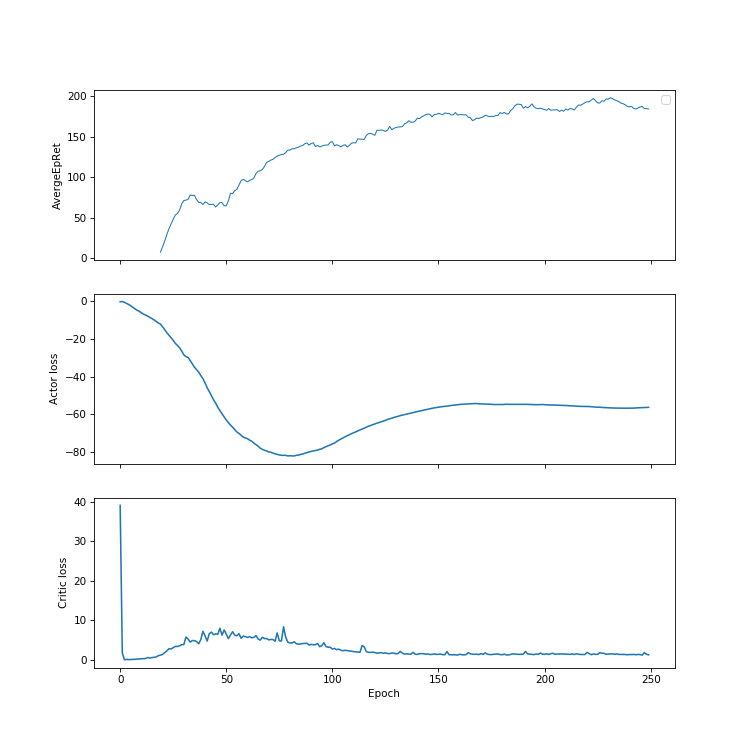

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


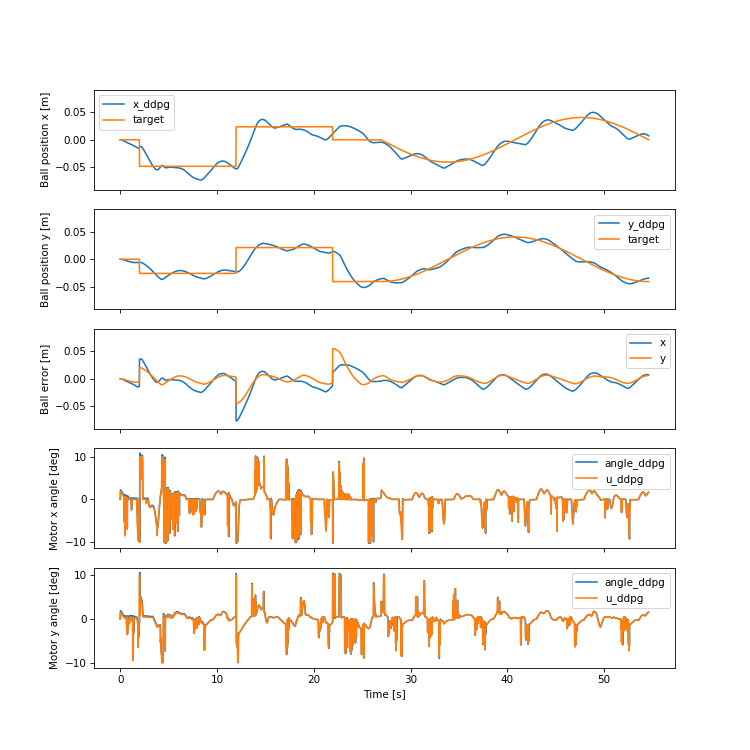

In [12]:
env = BBEnv #4
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400,200]
activation = torch.nn.ReLU
name='lep_0.6_[400,200]_relu'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.0006312949333699386


<IPython.core.display.Javascript object>


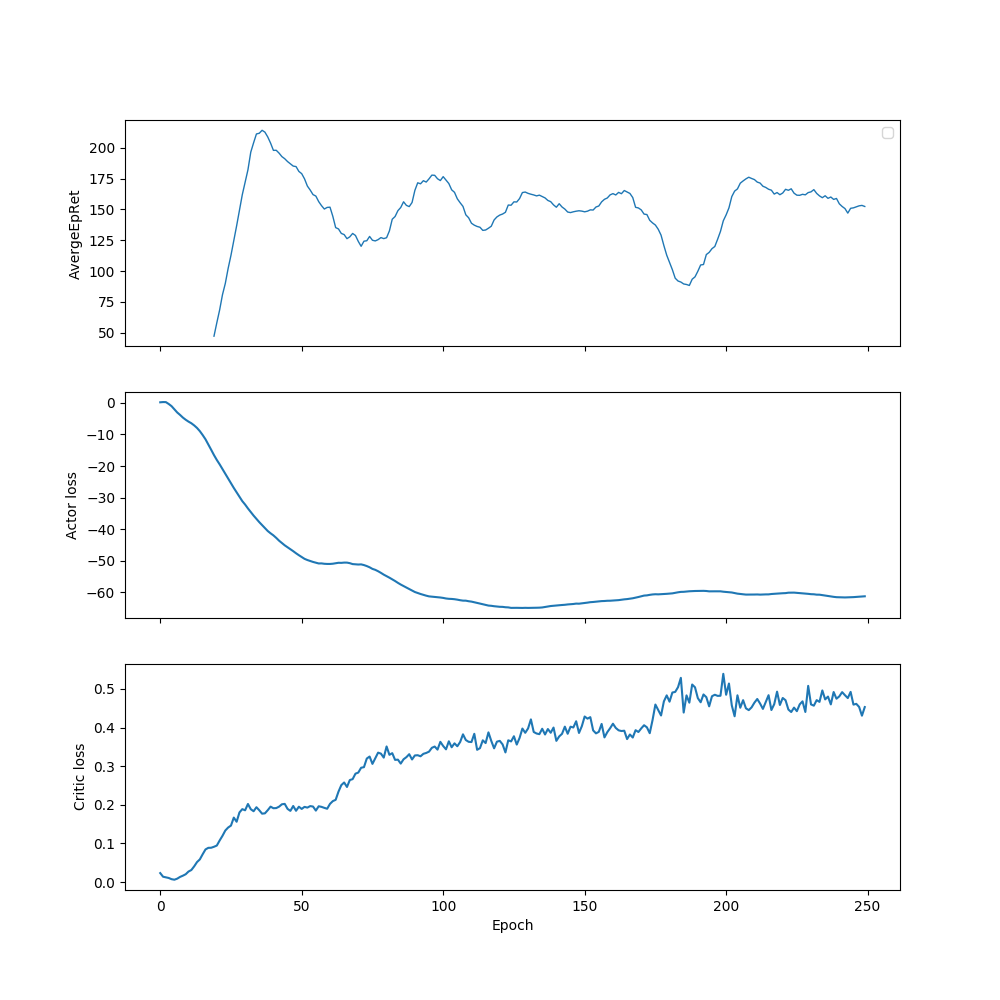

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


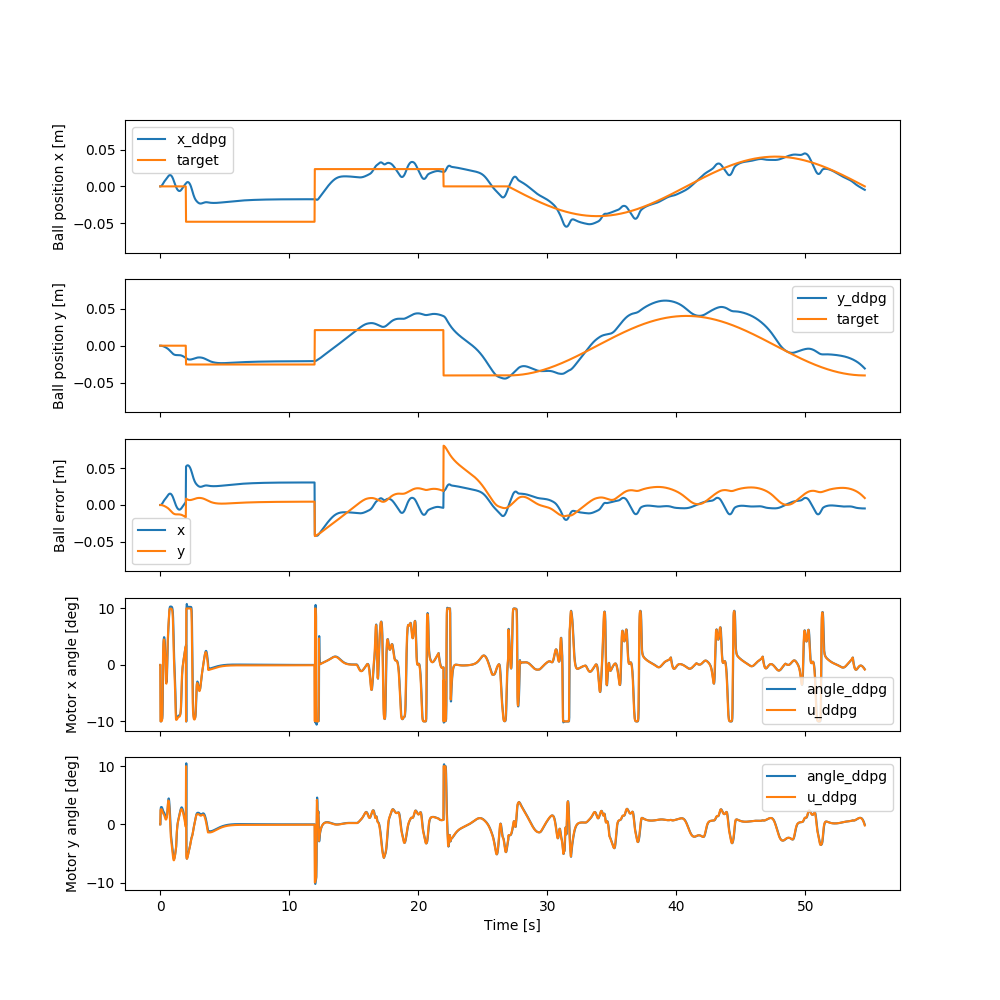

In [13]:
env = BBEnv #5
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [50]
activation = torch.nn.Sigmoid
name='lep_0.6_[50]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.0003721668137826279


<IPython.core.display.Javascript object>


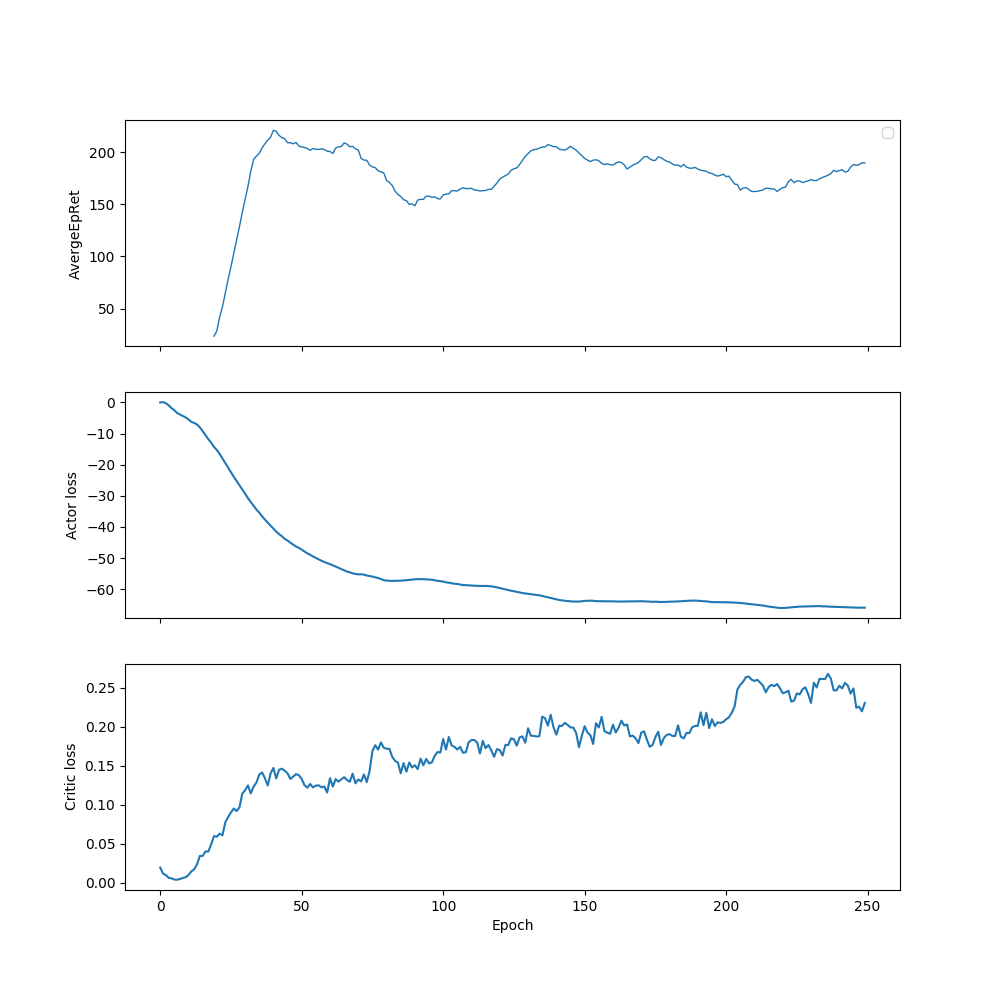

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


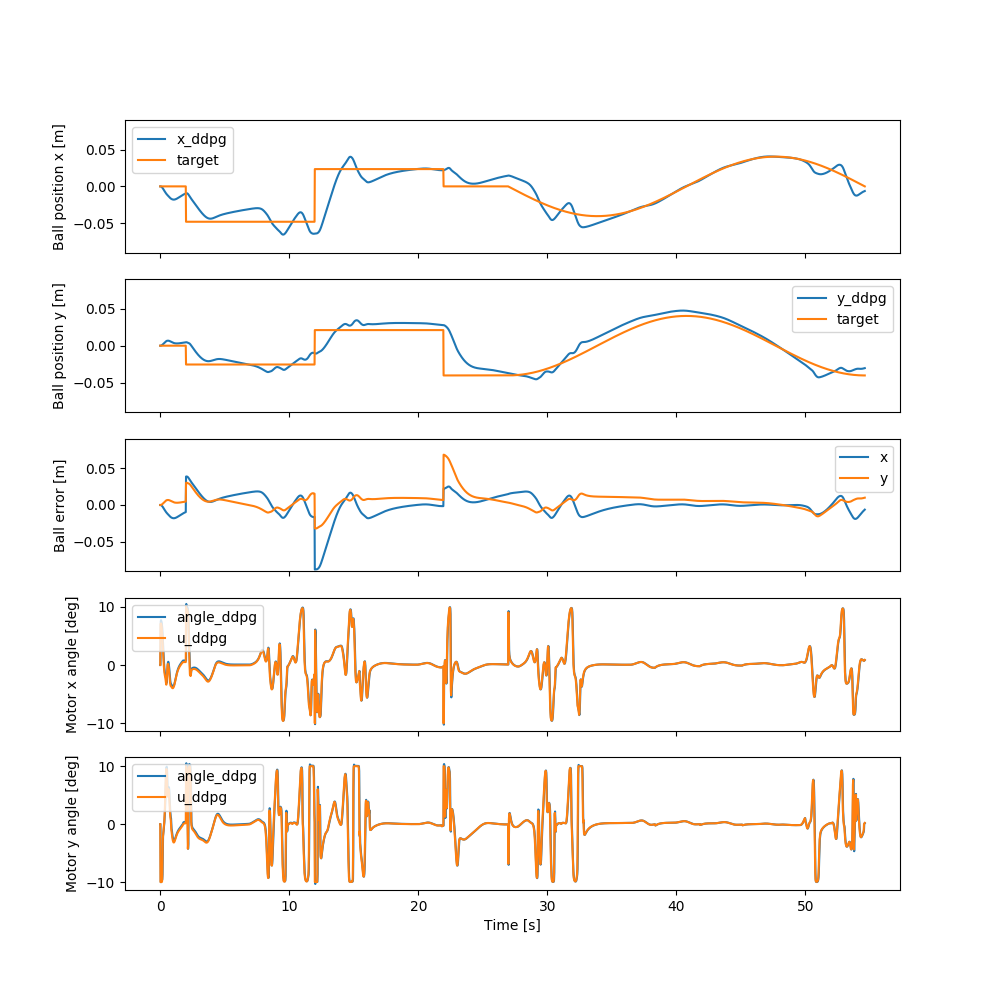

In [14]:
env = BBEnv #6
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100]
activation = torch.nn.Sigmoid
name='lep_0.6_[100]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00026738859336786956


<IPython.core.display.Javascript object>


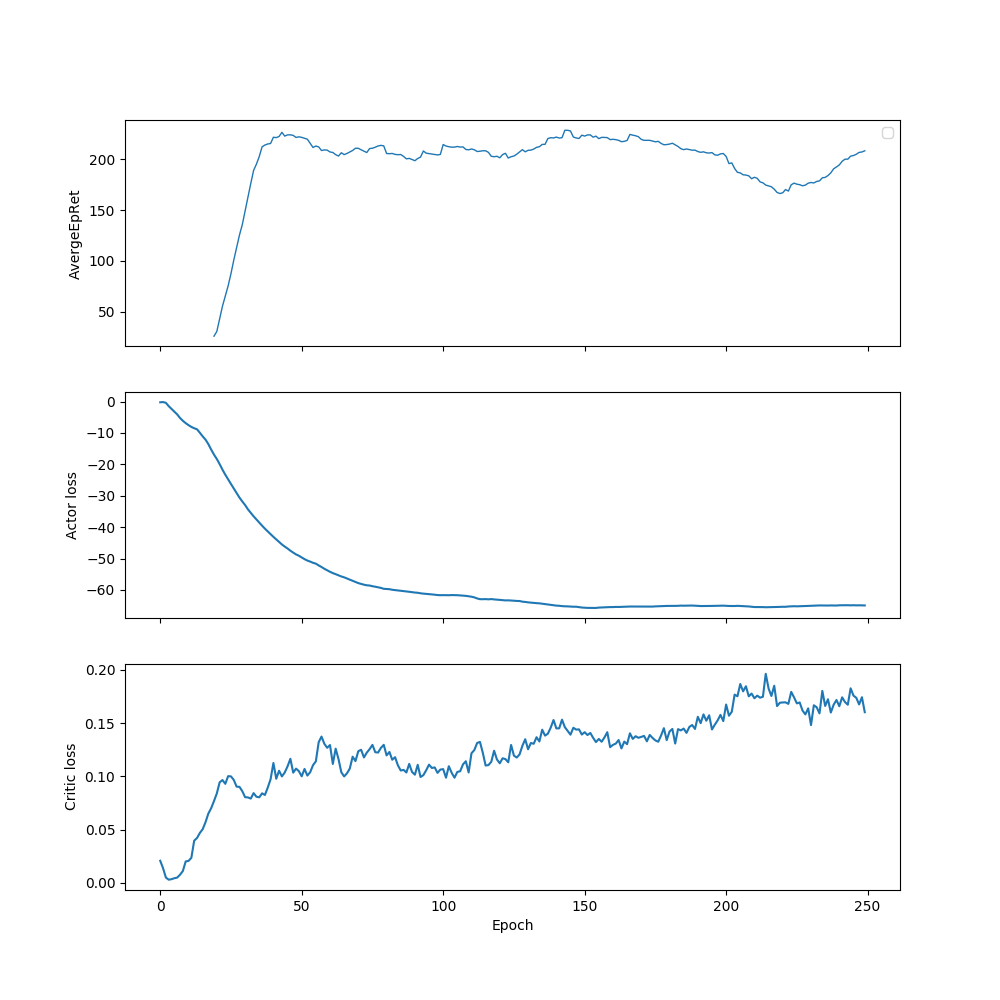

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


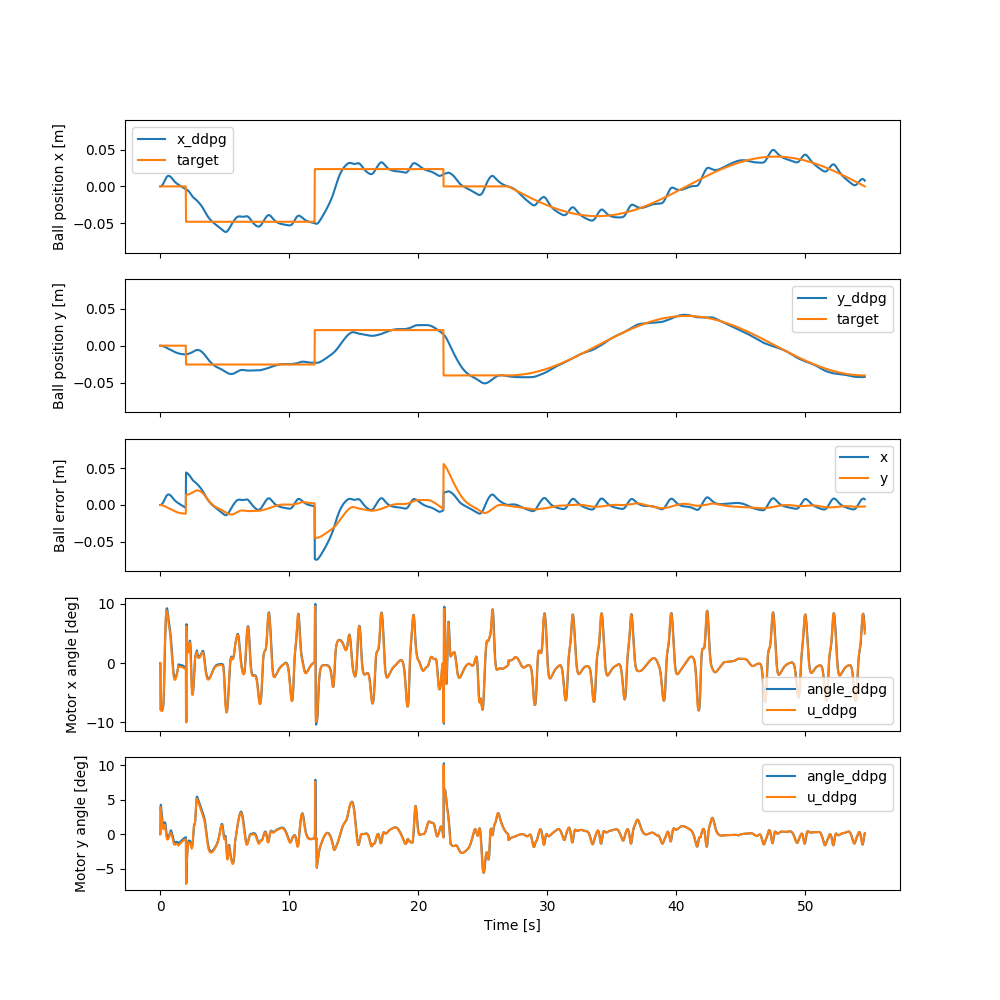

In [15]:
env = BBEnv #7
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200]
activation = torch.nn.Sigmoid
name='lep_0.6_[200]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.0002182867628662331


<IPython.core.display.Javascript object>


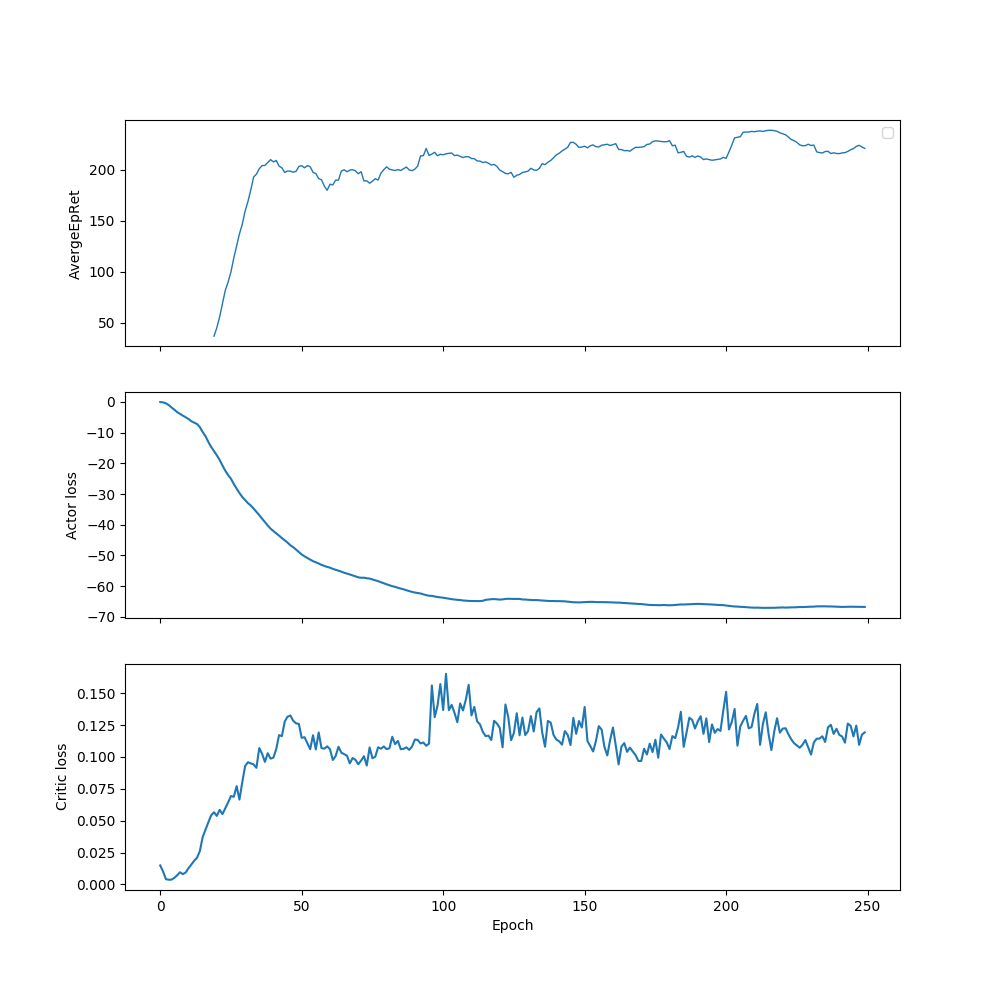

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


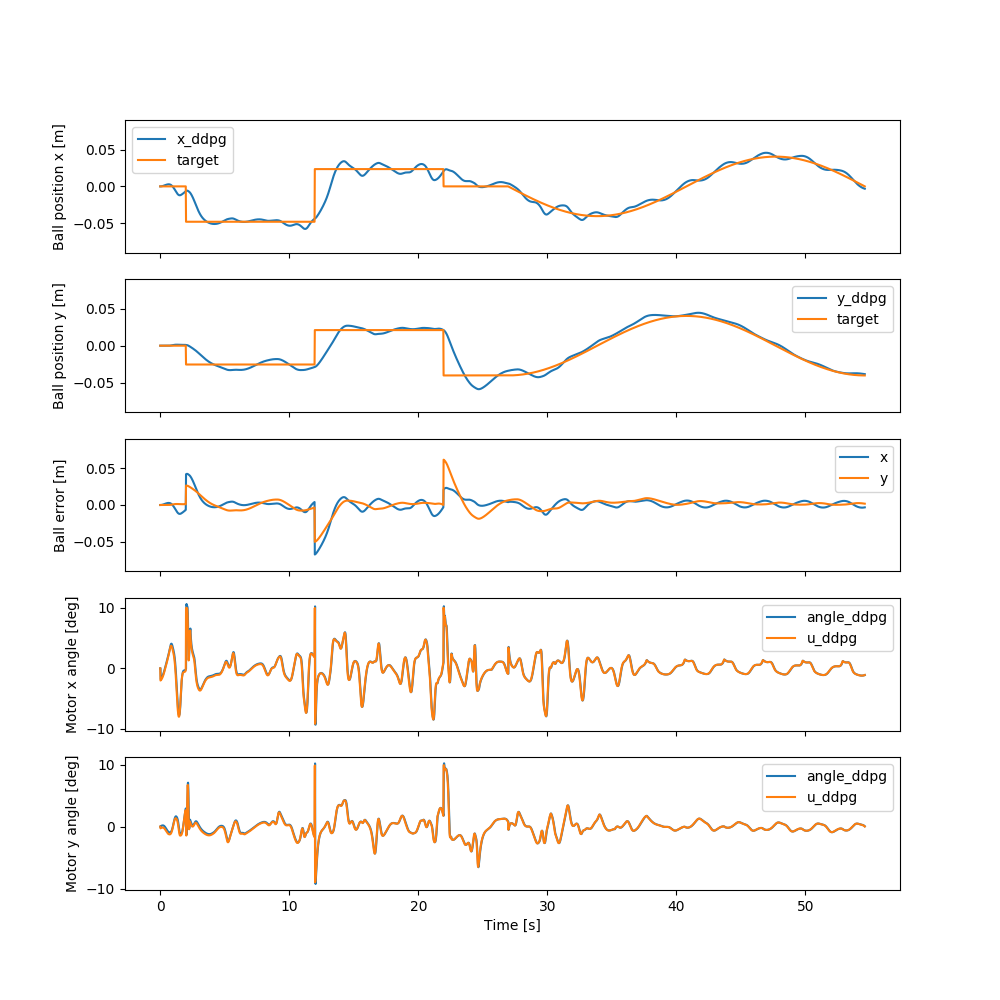

In [16]:
env = BBEnv #8
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400]
activation = torch.nn.Sigmoid
name='lep_0.6_[400]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00022018843304463245


<IPython.core.display.Javascript object>


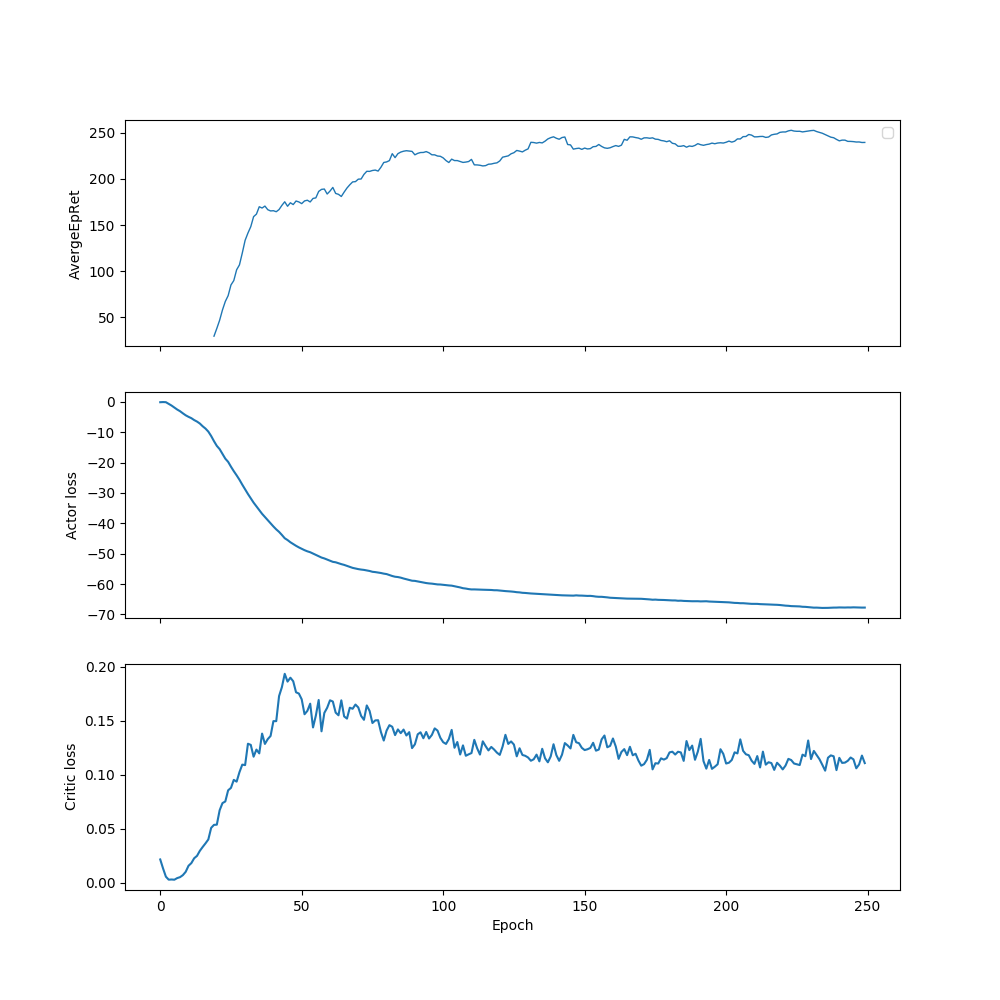

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


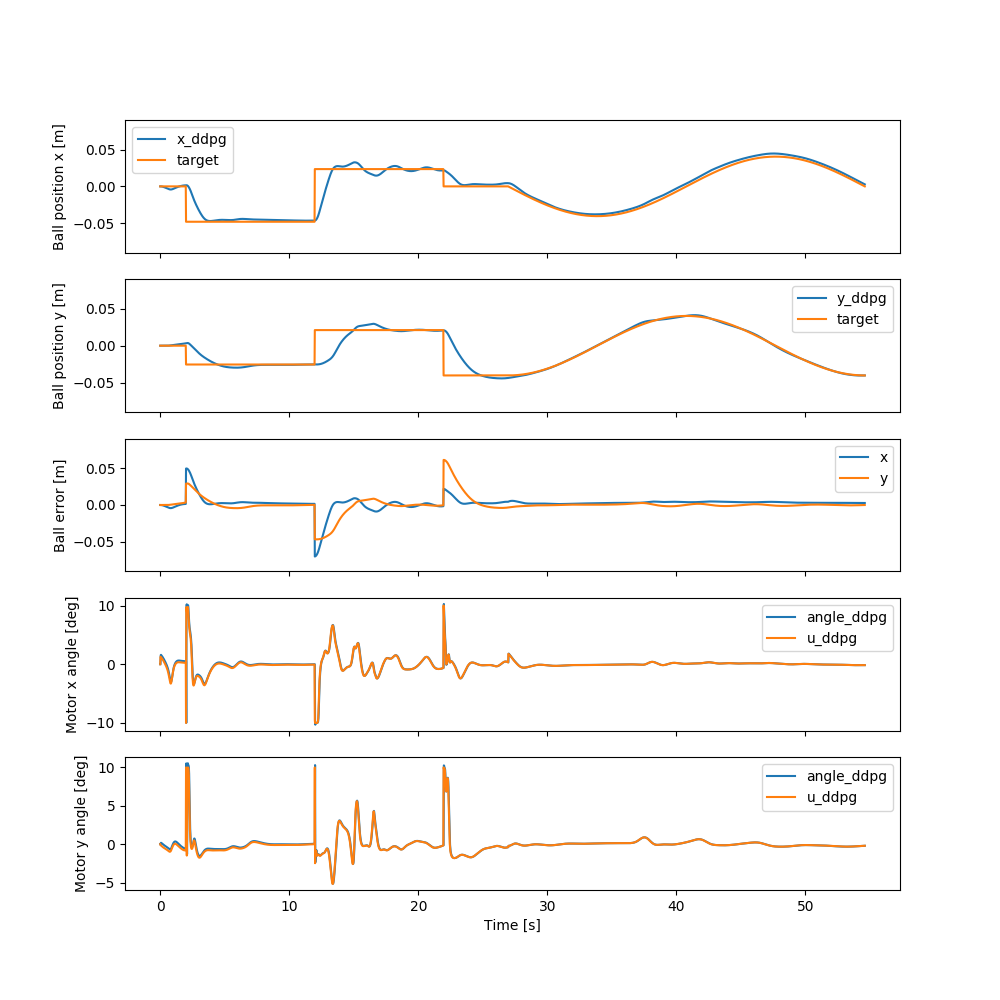

In [17]:
env = BBEnv #9
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100,50]
activation = torch.nn.Sigmoid
name='lep_0.6_[100,50]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00023677267664441064


<IPython.core.display.Javascript object>


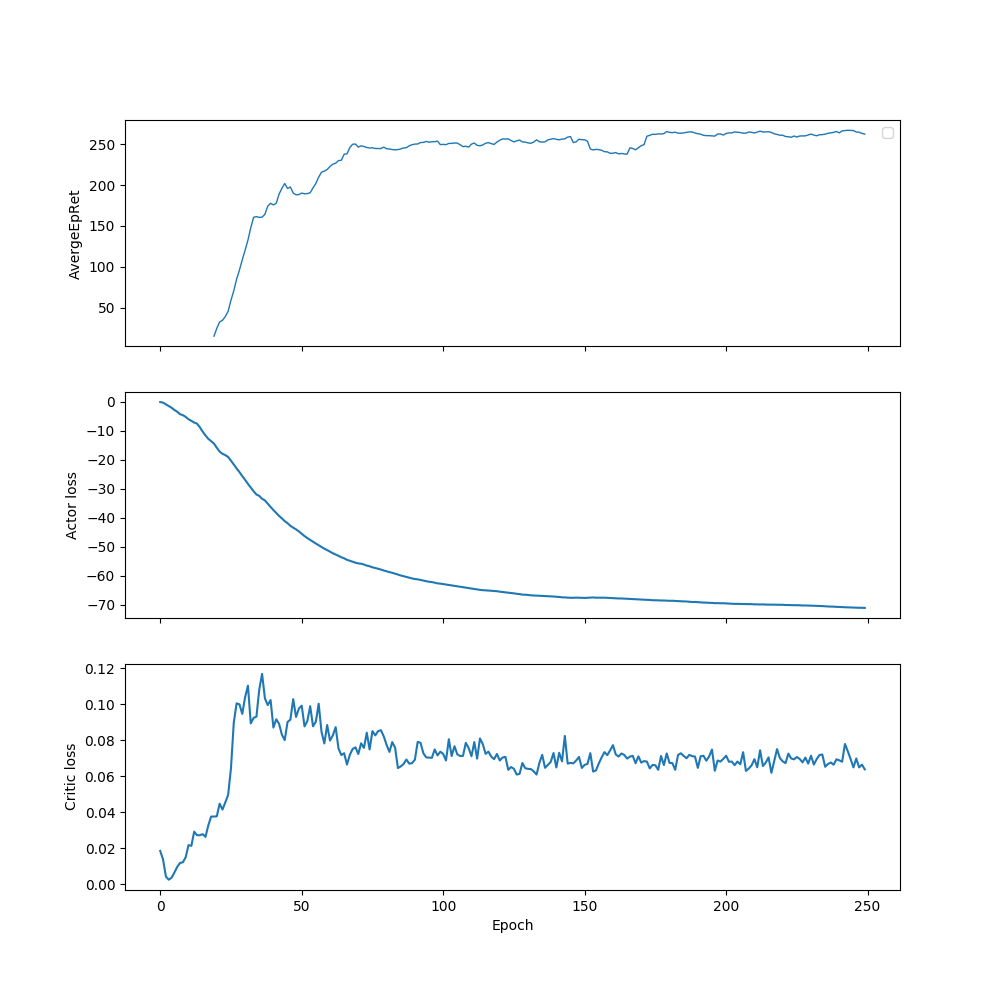

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


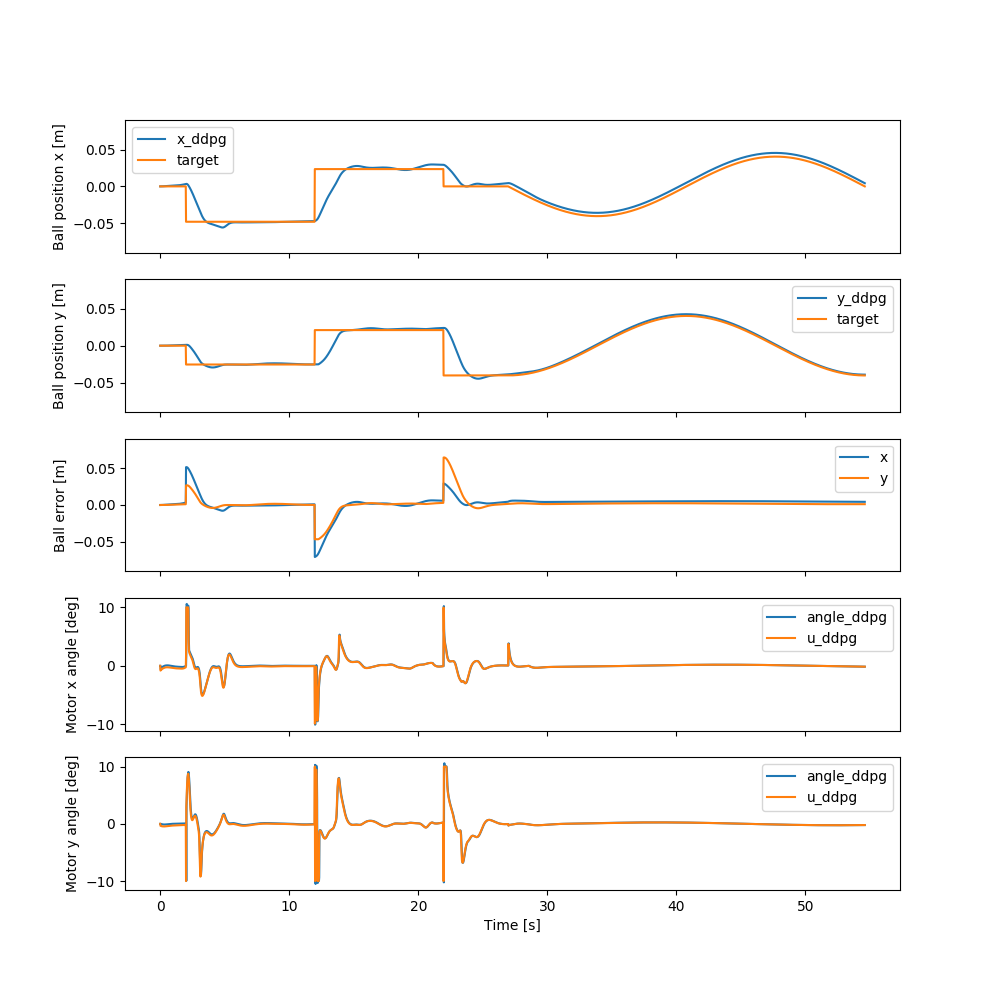

In [18]:
env = BBEnv #10
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00016657556771287145


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


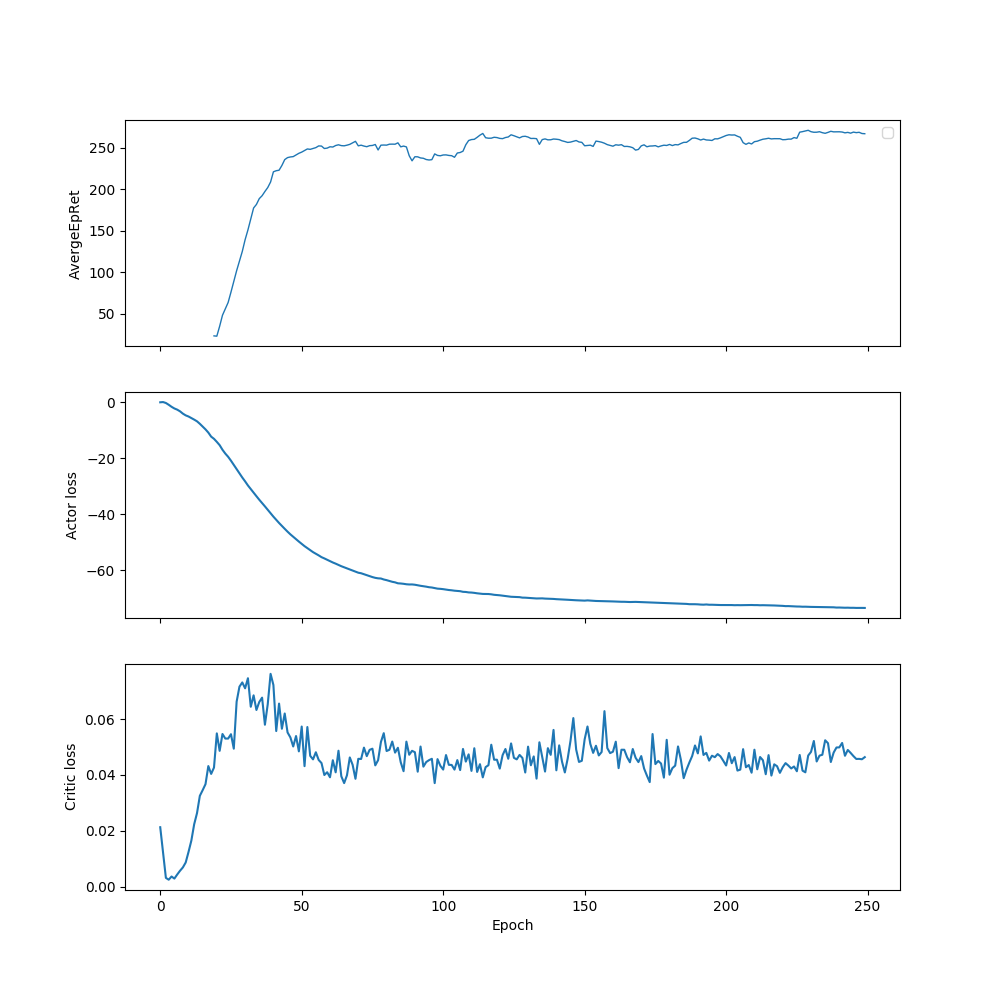

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


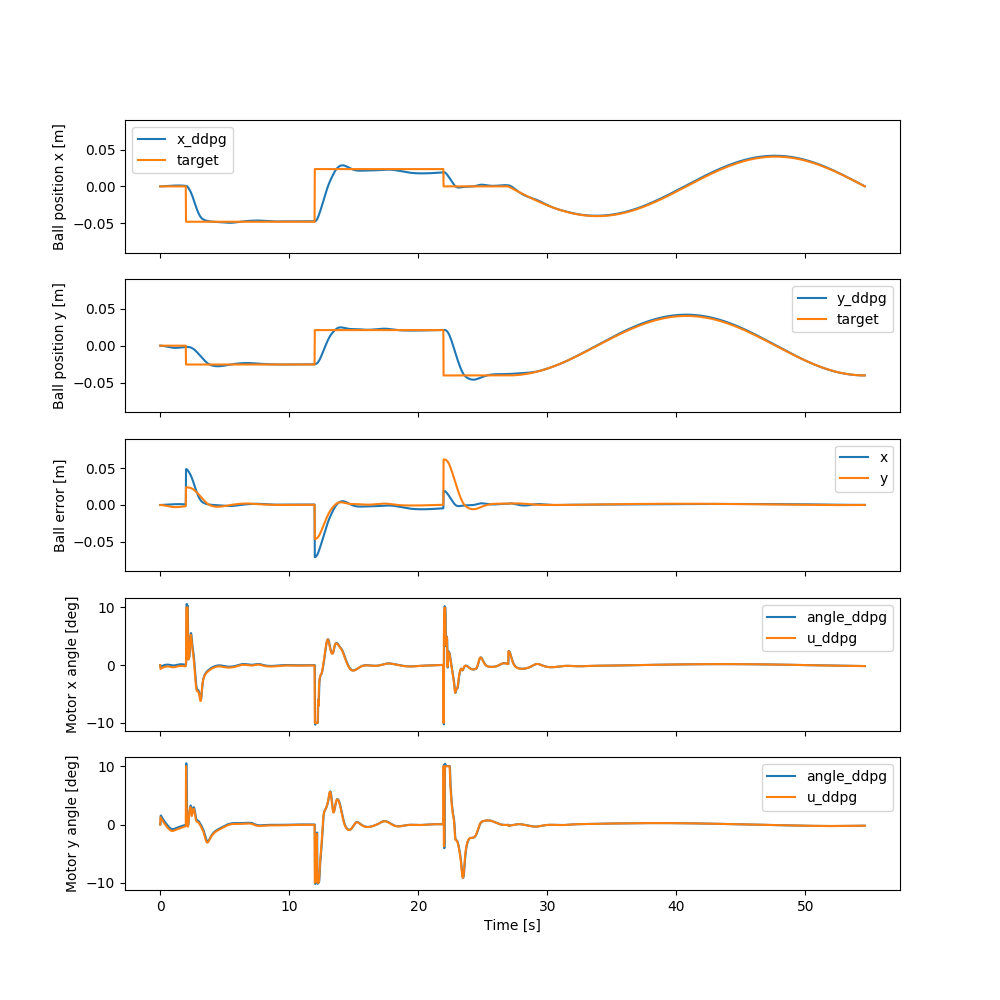

In [19]:
env = BBEnv #11
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400,200]
activation = torch.nn.Sigmoid
name='lep_0.6_[400,200]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00022694721550985838


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


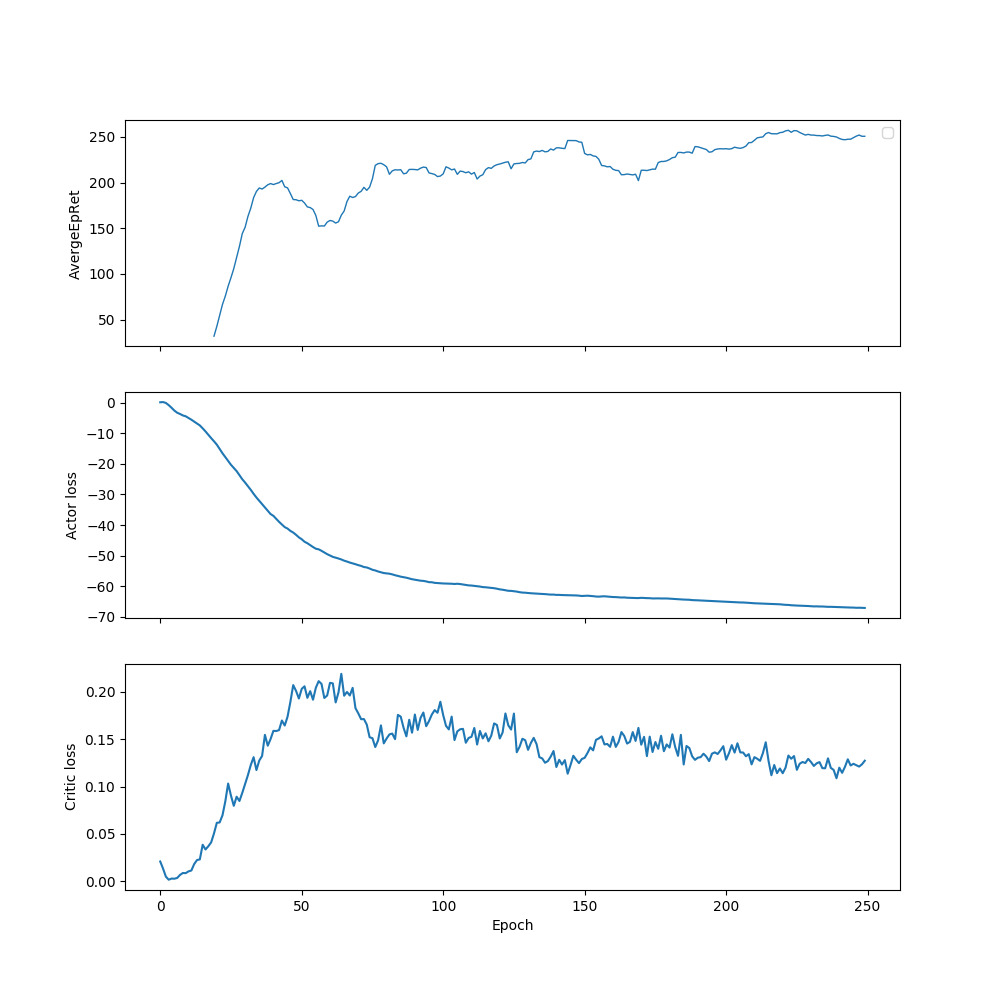

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


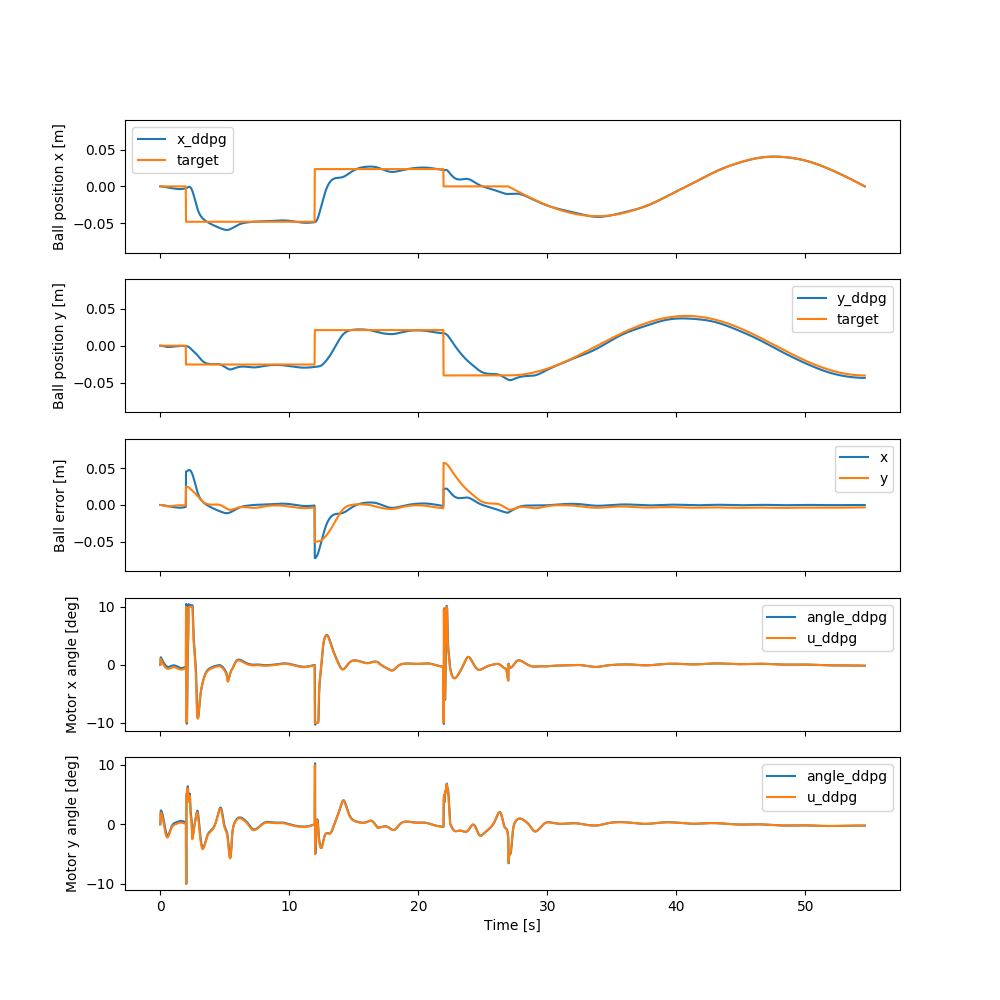

In [20]:
env = BBEnv #12
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100,50,25]
activation = torch.nn.Sigmoid
name='lep_0.6_[100,50,25]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00019492495654978444


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


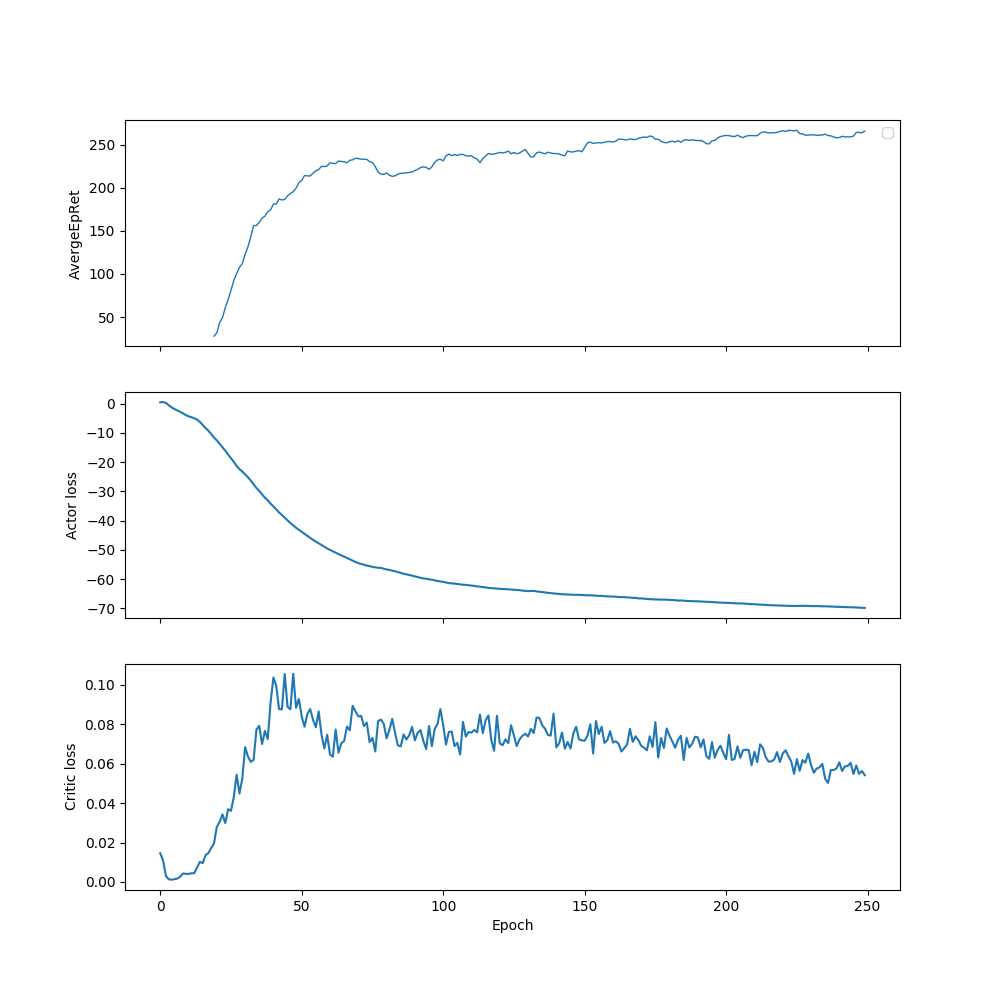

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


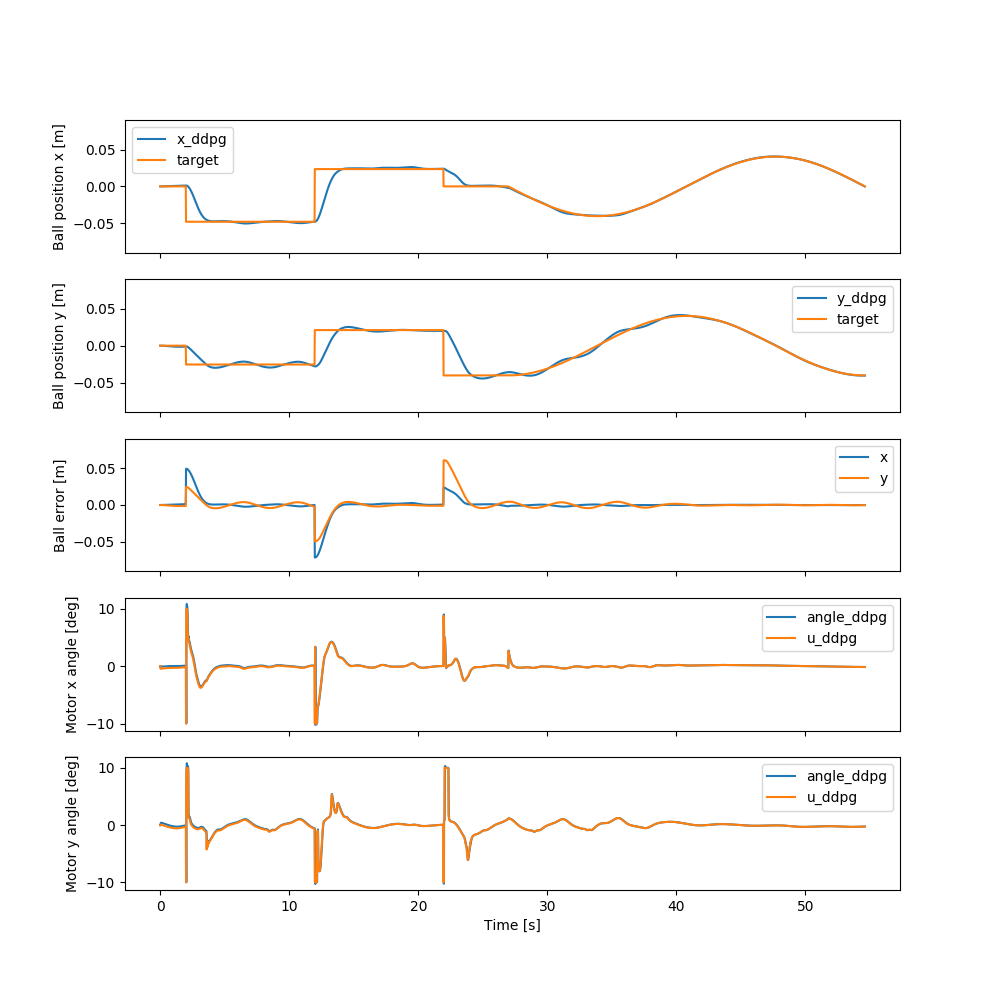

In [21]:
env = BBEnv #13
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100,50]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100,50]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00041462215153634756


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


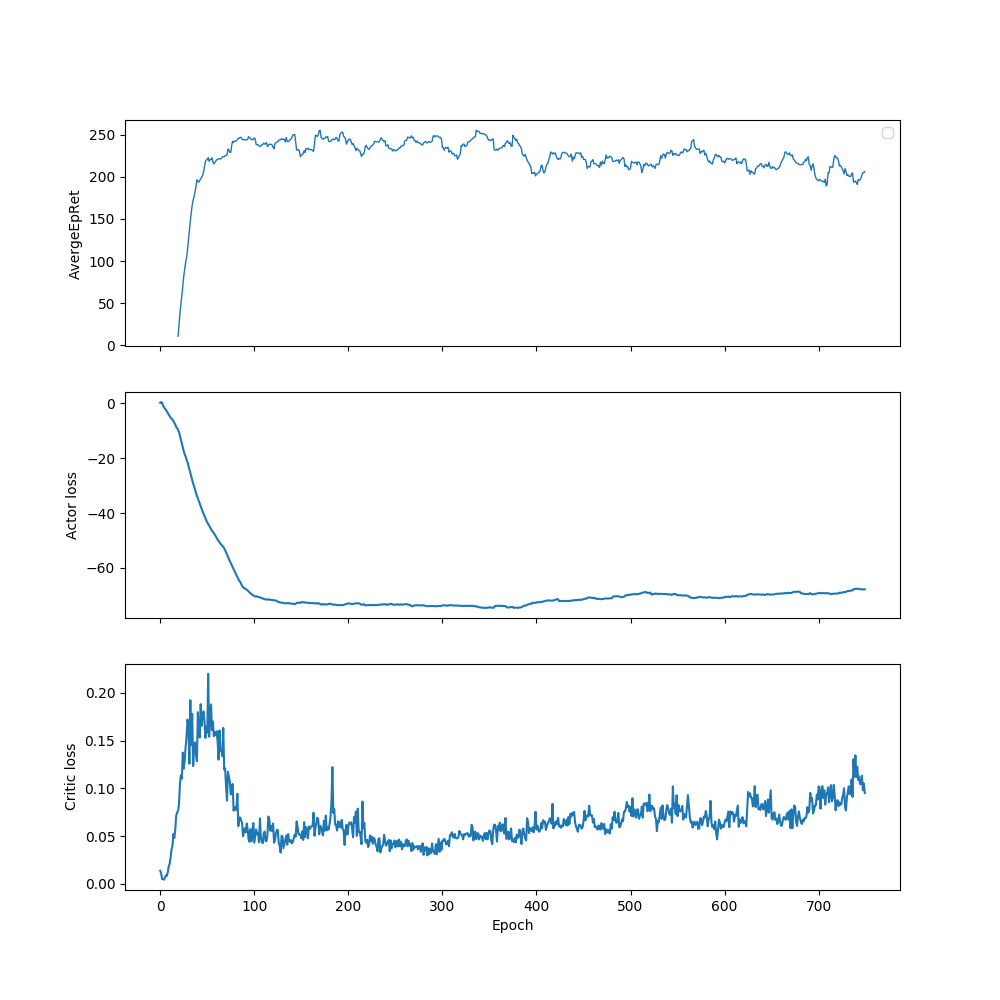

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


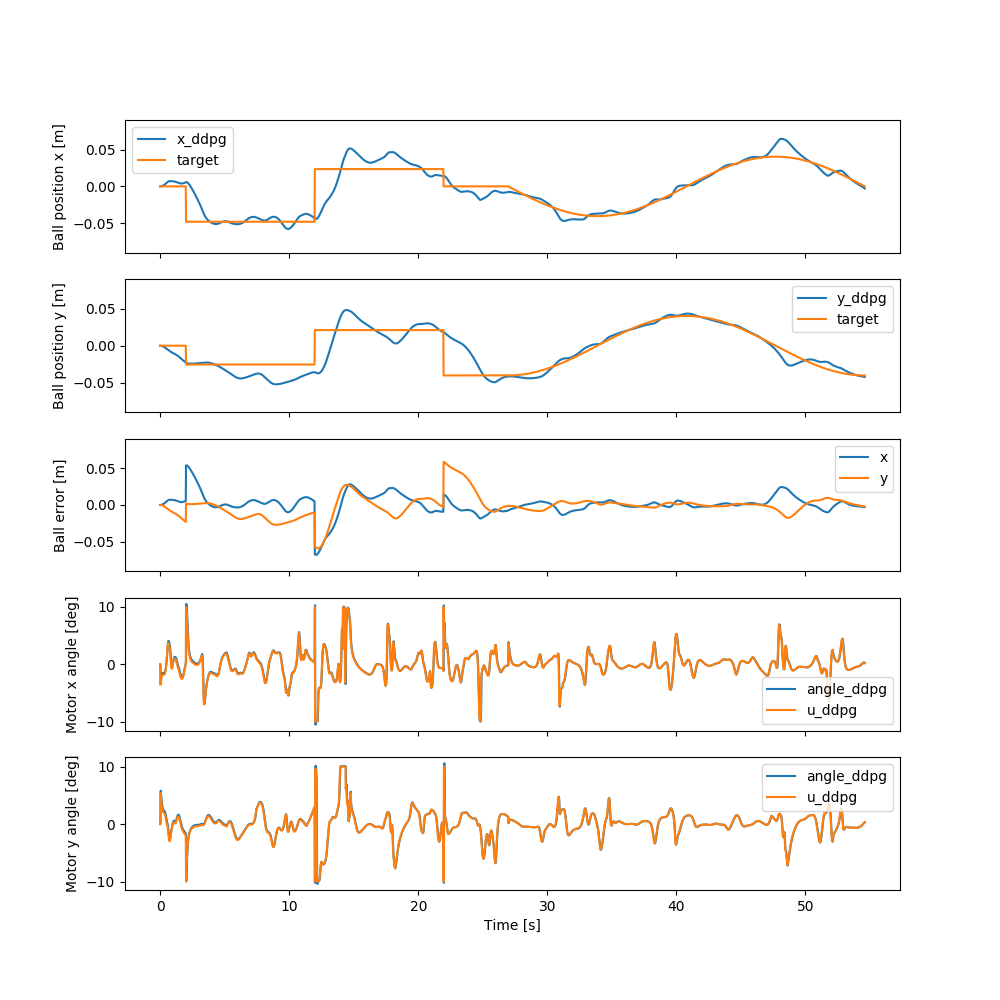

In [22]:
env = BBEnv #14
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100]_sigmoid_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.0002727100616084898


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


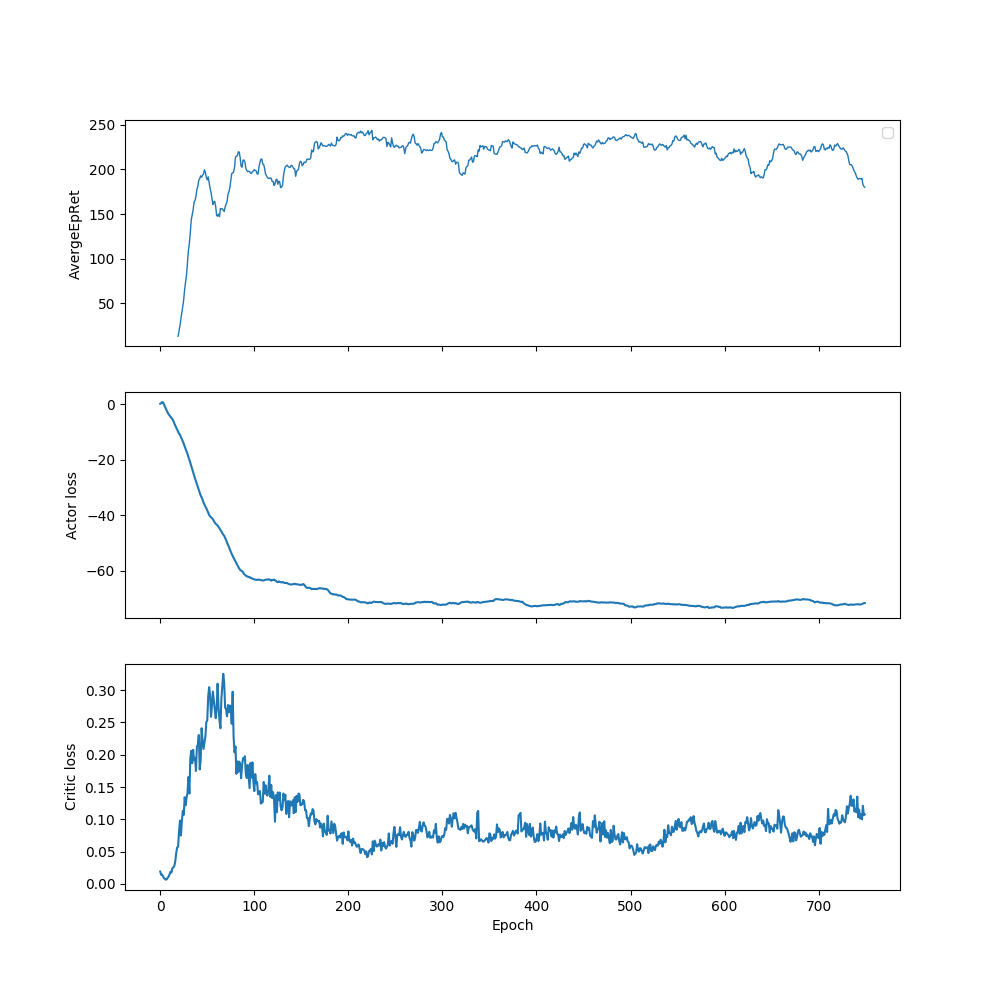

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


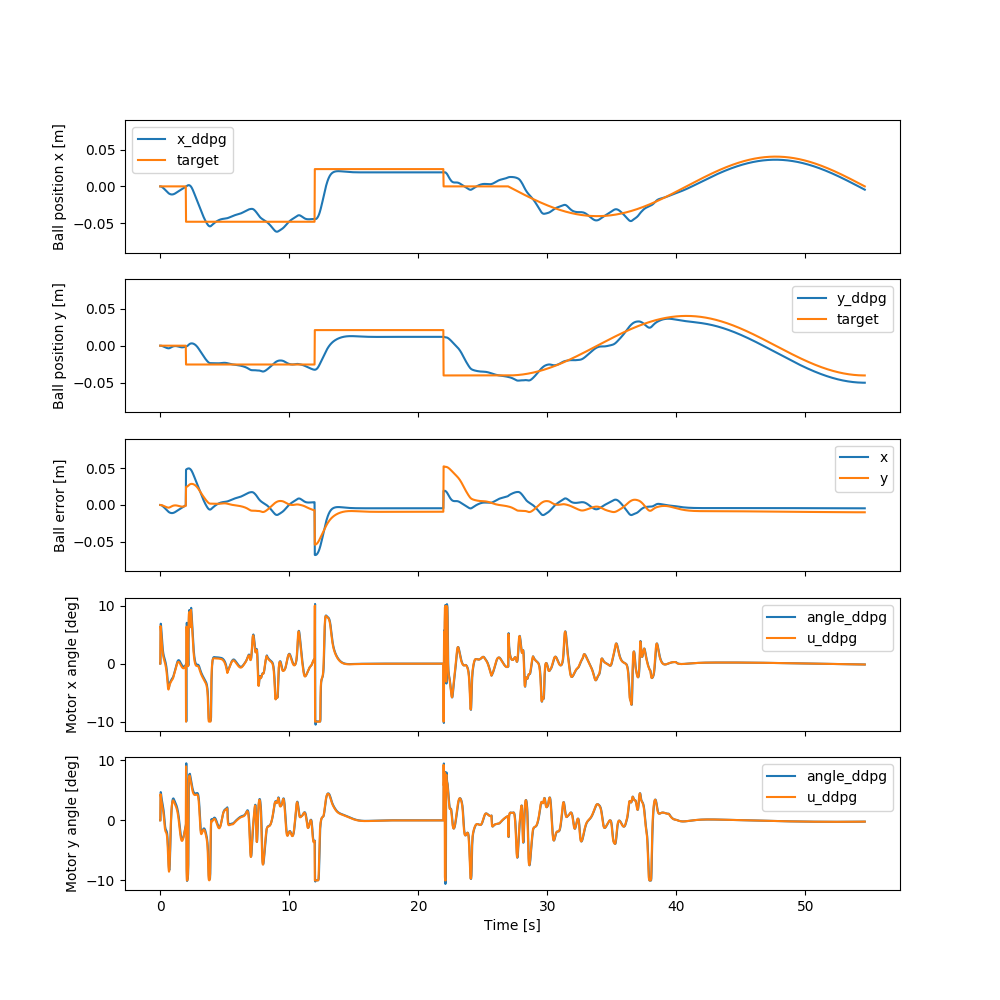

In [23]:
env = BBEnv #15
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100,50,25]
activation = torch.nn.Sigmoid
name='lep_0.6_[100,50,25]_sigmoid_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00048603328906283907


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


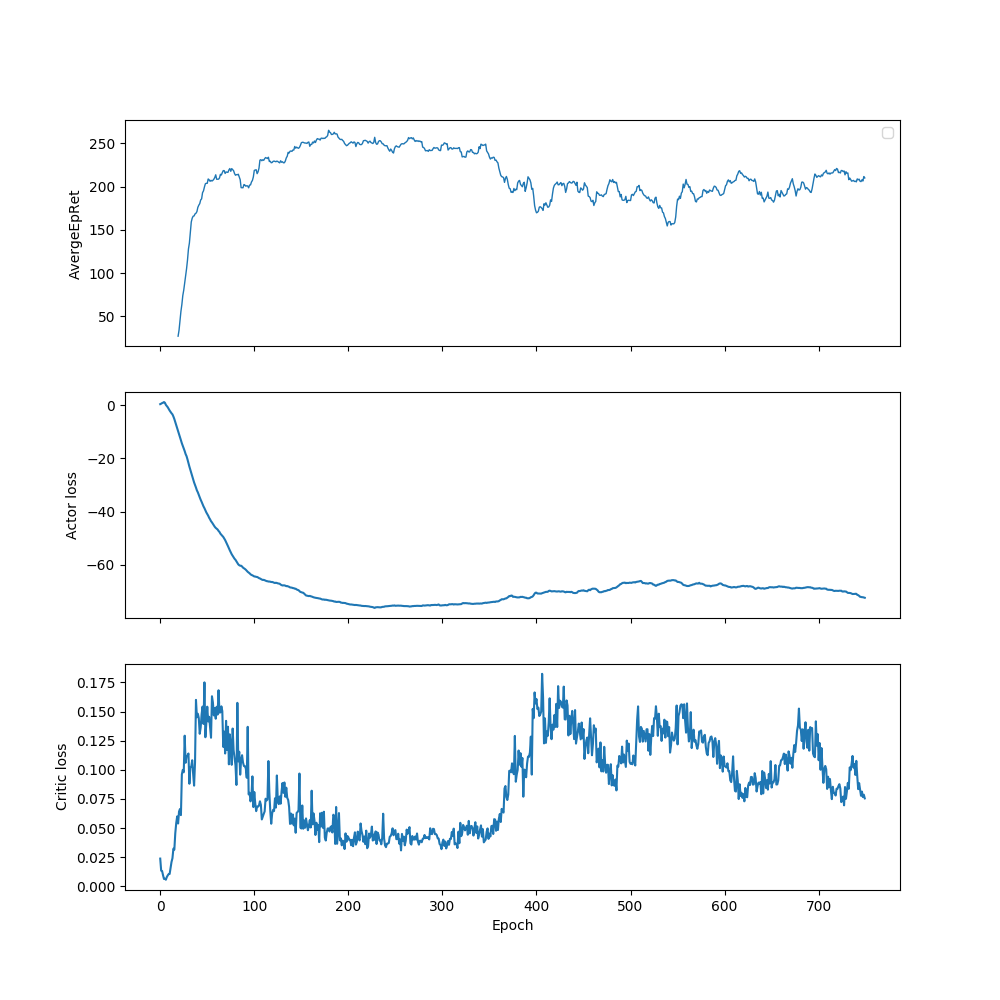

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


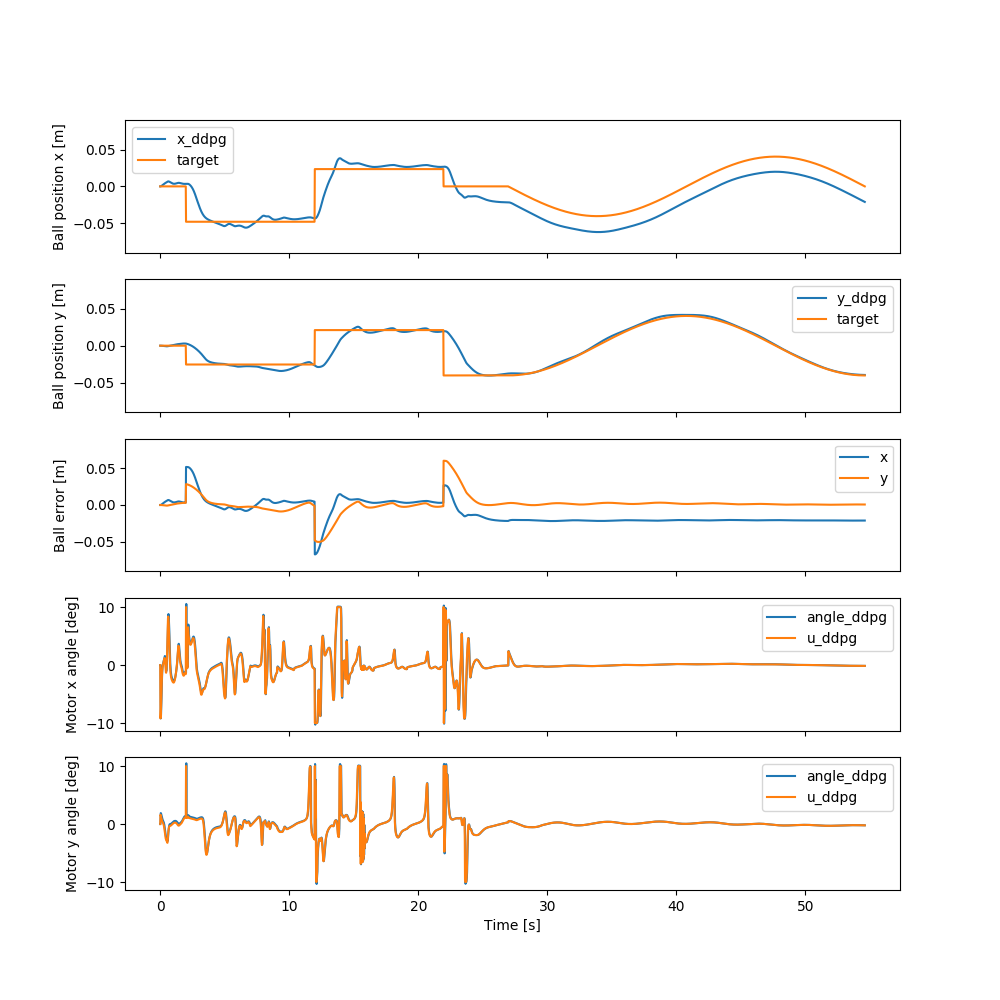

In [24]:
env = BBEnv #16
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100,50]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100,50]_sigmoid_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00022008285148698134


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


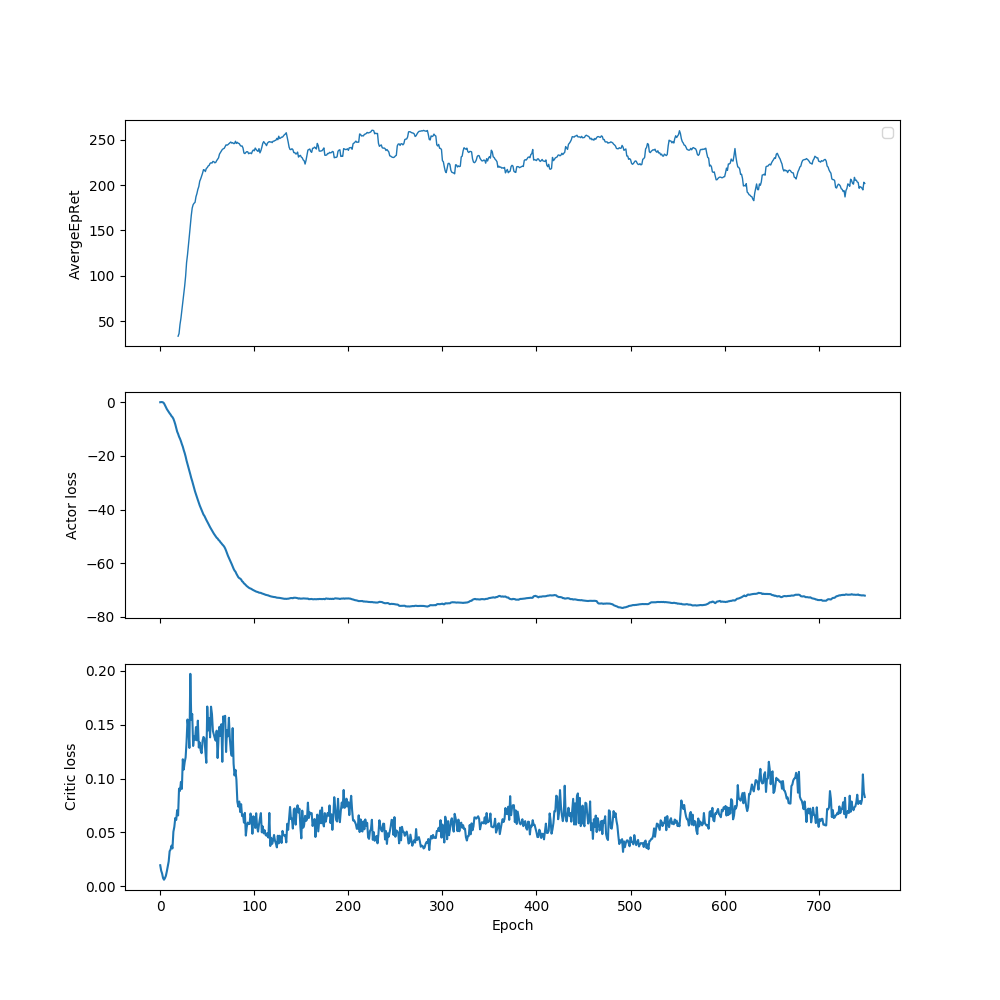

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


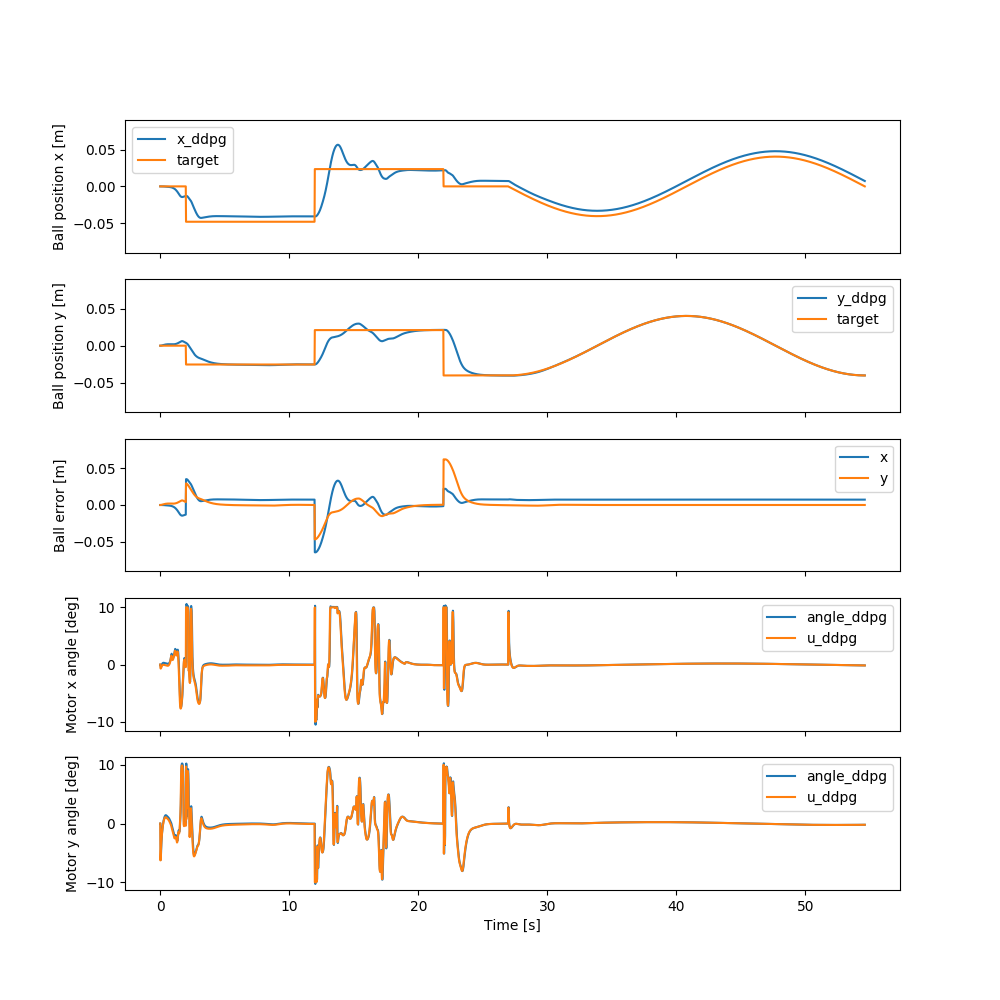

In [25]:
env = BBEnv #17
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,200,100]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,200,100]_sigmoid_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.0003703732055775561


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


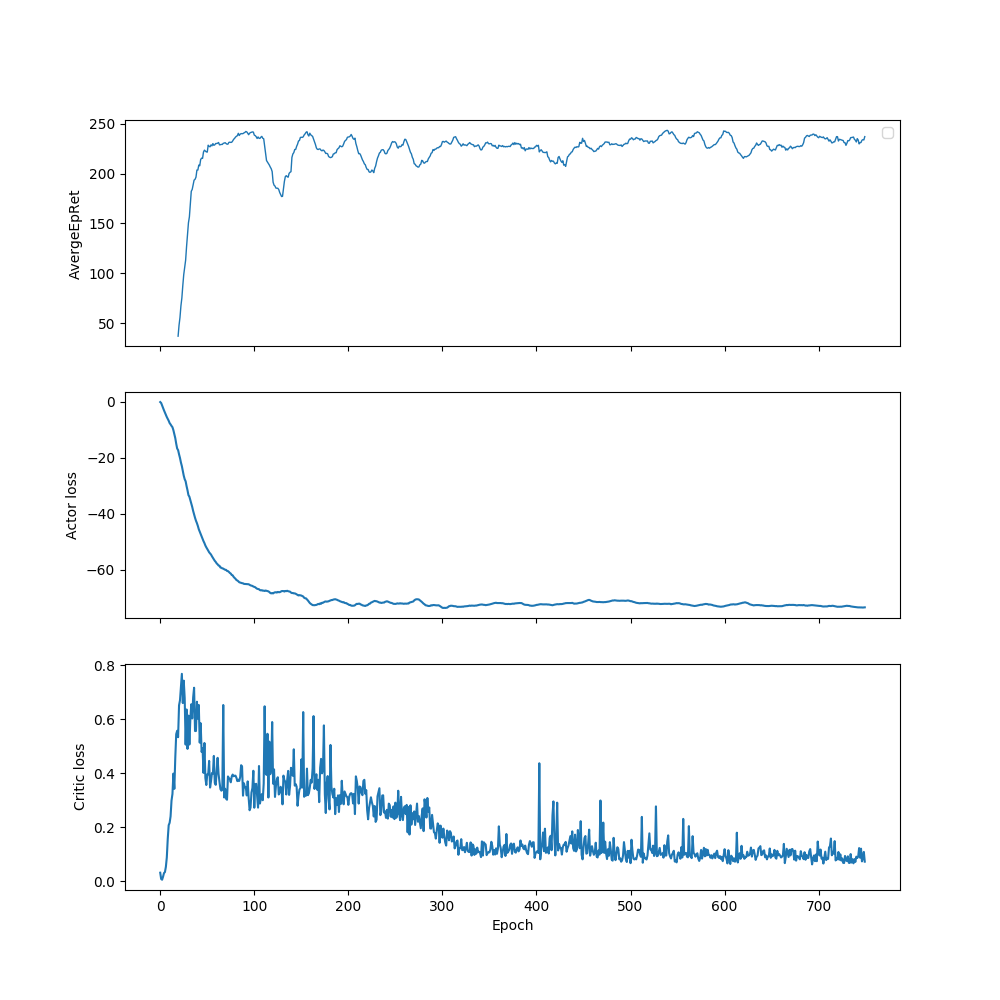

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


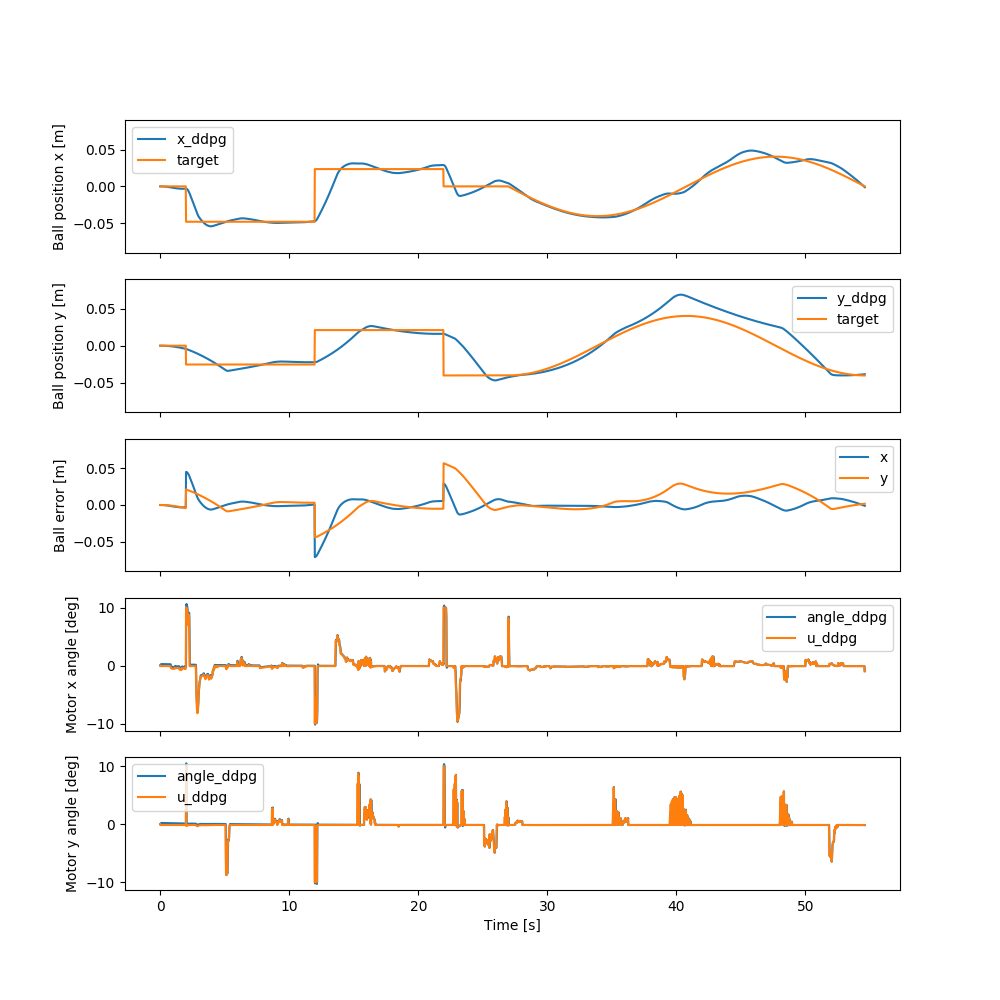

In [26]:
env = BBEnv #18
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,200,100]
activation = torch.nn.ReLU
name='lep_0.6_[200,200,100]_relu_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller/exploratory_penality/lep_0.6_[100,50]_sigmoid_hard/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            100,
            50
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fb126ad0cc0>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller/exploratory_penality/lep_0.6_[100,50]_sigmoid_hard",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller/exploratory_penality/lep_0.6_[100,50]_sigmoid_hard/progress.txt' mode='w' encoding='UTF-8'>":	{
                    

/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


---------------------------------------
|             Epoch |               1 |
|      AverageEpRet |           -36.2 |
|          StdEpRet |            17.7 |
|          MaxEpRet |           -18.5 |
|          MinEpRet |           -53.9 |
|  AverageTestEpRet |            -165 |
|      StdTestEpRet |            5.27 |
|      MaxTestEpRet |            -156 |
|      MinTestEpRet |            -174 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.1e+03 |
|      AverageQVals |         0.00928 |
|          StdQVals |          0.0709 |
|          MaxQVals |           0.179 |
|          MinQVals |          -0.119 |
|            LossPi |         -0.0176 |
|             LossQ |          0.0146 |
|              Time |             3.3 |
---------------------------------------
---------------------------------------
|             Epoch |               2 |
|      AverageEpRet |           -30.1 |
|          StdEpRet |            24.7 |


---------------------------------------
|             Epoch |              11 |
|      AverageEpRet |           -25.3 |
|          StdEpRet |              21 |
|          MaxEpRet |              -2 |
|          MinEpRet |           -52.9 |
|  AverageTestEpRet |            97.6 |
|      StdTestEpRet |            32.8 |
|      MaxTestEpRet |             168 |
|      MinTestEpRet |            56.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.21e+04 |
|      AverageQVals |            5.28 |
|          StdQVals |            4.15 |
|          MaxQVals |            16.2 |
|          MinQVals |           -1.18 |
|            LossPi |            -5.5 |
|             LossQ |          0.0452 |
|              Time |             138 |
---------------------------------------
---------------------------------------
|             Epoch |              12 |
|      AverageEpRet |           -20.5 |
|          StdEpRet |            18.4 |


---------------------------------------
|             Epoch |              21 |
|      AverageEpRet |             127 |
|          StdEpRet |            36.1 |
|          MaxEpRet |             163 |
|          MinEpRet |            91.2 |
|  AverageTestEpRet |             121 |
|      StdTestEpRet |            71.1 |
|      MaxTestEpRet |             227 |
|      MinTestEpRet |              19 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.31e+04 |
|      AverageQVals |              11 |
|          StdQVals |             8.5 |
|          MaxQVals |            30.7 |
|          MinQVals |          -0.402 |
|            LossPi |           -11.2 |
|             LossQ |           0.211 |
|              Time |             297 |
---------------------------------------
---------------------------------------
|             Epoch |              22 |
|      AverageEpRet |            88.4 |
|          StdEpRet |            54.3 |


---------------------------------------
|             Epoch |              31 |
|      AverageEpRet |             159 |
|          StdEpRet |            22.5 |
|          MaxEpRet |             190 |
|          MinEpRet |             139 |
|  AverageTestEpRet |             175 |
|      StdTestEpRet |            44.6 |
|      MaxTestEpRet |             257 |
|      MinTestEpRet |            73.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        3.41e+04 |
|      AverageQVals |            19.5 |
|          StdQVals |            12.7 |
|          MaxQVals |            40.9 |
|          MinQVals |           -1.32 |
|            LossPi |           -19.7 |
|             LossQ |           0.478 |
|              Time |             450 |
---------------------------------------
---------------------------------------
|             Epoch |              32 |
|      AverageEpRet |             171 |
|          StdEpRet |            16.2 |


---------------------------------------
|             Epoch |              41 |
|      AverageEpRet |             167 |
|          StdEpRet |            1.93 |
|          MaxEpRet |             169 |
|          MinEpRet |             166 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |            78.4 |
|      MaxTestEpRet |             222 |
|      MinTestEpRet |           -31.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.51e+04 |
|      AverageQVals |            27.4 |
|          StdQVals |            14.2 |
|          MaxQVals |              48 |
|          MinQVals |           -5.08 |
|            LossPi |           -27.6 |
|             LossQ |           0.527 |
|              Time |             597 |
---------------------------------------
---------------------------------------
|             Epoch |              42 |
|      AverageEpRet |             174 |
|          StdEpRet |            19.6 |


---------------------------------------
|             Epoch |              51 |
|      AverageEpRet |            41.9 |
|          StdEpRet |              95 |
|          MaxEpRet |             173 |
|          MinEpRet |           -49.3 |
|  AverageTestEpRet |             113 |
|      StdTestEpRet |            70.6 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |           -19.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.61e+04 |
|      AverageQVals |            33.7 |
|          StdQVals |            14.9 |
|          MaxQVals |            53.3 |
|          MinQVals |           -6.77 |
|            LossPi |           -33.9 |
|             LossQ |           0.634 |
|              Time |             760 |
---------------------------------------
---------------------------------------
|             Epoch |              52 |
|      AverageEpRet |             161 |
|          StdEpRet |            59.1 |


---------------------------------------
|             Epoch |              61 |
|      AverageEpRet |             165 |
|          StdEpRet |            61.4 |
|          MaxEpRet |             227 |
|          MinEpRet |             104 |
|  AverageTestEpRet |             152 |
|      StdTestEpRet |            48.5 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |            68.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.71e+04 |
|      AverageQVals |            37.5 |
|          StdQVals |            14.7 |
|          MaxQVals |            56.4 |
|          MinQVals |           -4.58 |
|            LossPi |           -37.7 |
|             LossQ |           0.674 |
|              Time |             910 |
---------------------------------------
---------------------------------------
|             Epoch |              62 |
|      AverageEpRet |             160 |
|          StdEpRet |            33.7 |


---------------------------------------
|             Epoch |              71 |
|      AverageEpRet |             168 |
|          StdEpRet |            21.6 |
|          MaxEpRet |             196 |
|          MinEpRet |             144 |
|  AverageTestEpRet |             172 |
|      StdTestEpRet |            65.1 |
|      MaxTestEpRet |             261 |
|      MinTestEpRet |            2.46 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.81e+04 |
|      AverageQVals |              41 |
|          StdQVals |            14.3 |
|          MaxQVals |            57.7 |
|          MinQVals |            3.68 |
|            LossPi |           -41.2 |
|             LossQ |           0.728 |
|              Time |        1.07e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              72 |
|      AverageEpRet |             158 |
|          StdEpRet |            10.3 |


---------------------------------------
|             Epoch |              81 |
|      AverageEpRet |            96.3 |
|          StdEpRet |            27.1 |
|          MaxEpRet |             123 |
|          MinEpRet |            69.2 |
|  AverageTestEpRet |             172 |
|      StdTestEpRet |            32.1 |
|      MaxTestEpRet |             227 |
|      MinTestEpRet |             108 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.91e+04 |
|      AverageQVals |            43.2 |
|          StdQVals |            14.2 |
|          MaxQVals |            59.2 |
|          MinQVals |            2.71 |
|            LossPi |           -43.4 |
|             LossQ |           0.704 |
|              Time |        1.23e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              82 |
|      AverageEpRet |             178 |
|          StdEpRet |            18.7 |


---------------------------------------
|             Epoch |              91 |
|      AverageEpRet |             105 |
|          StdEpRet |            69.7 |
|          MaxEpRet |             178 |
|          MinEpRet |            11.1 |
|  AverageTestEpRet |             180 |
|      StdTestEpRet |              42 |
|      MaxTestEpRet |             235 |
|      MinTestEpRet |            74.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |           1e+05 |
|      AverageQVals |            44.3 |
|          StdQVals |            14.1 |
|          MaxQVals |            59.8 |
|          MinQVals |           0.509 |
|            LossPi |           -44.4 |
|             LossQ |           0.697 |
|              Time |        1.38e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              92 |
|      AverageEpRet |             188 |
|          StdEpRet |            34.1 |


---------------------------------------
|             Epoch |             101 |
|      AverageEpRet |             196 |
|          StdEpRet |            22.3 |
|          MaxEpRet |             218 |
|          MinEpRet |             174 |
|  AverageTestEpRet |             166 |
|      StdTestEpRet |            29.8 |
|      MaxTestEpRet |             229 |
|      MinTestEpRet |             113 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.11e+05 |
|      AverageQVals |            45.5 |
|          StdQVals |            14.3 |
|          MaxQVals |            61.7 |
|          MinQVals |           0.127 |
|            LossPi |           -45.7 |
|             LossQ |           0.737 |
|              Time |        1.53e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             102 |
|      AverageEpRet |             184 |
|          StdEpRet |            17.7 |


---------------------------------------
|             Epoch |             111 |
|      AverageEpRet |             189 |
|          StdEpRet |            14.7 |
|          MaxEpRet |             205 |
|          MinEpRet |             170 |
|  AverageTestEpRet |             189 |
|      StdTestEpRet |            32.6 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |             109 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.22e+05 |
|      AverageQVals |            46.9 |
|          StdQVals |            14.2 |
|          MaxQVals |              62 |
|          MinQVals |           -2.56 |
|            LossPi |             -47 |
|             LossQ |           0.857 |
|              Time |         1.7e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             112 |
|      AverageEpRet |             183 |
|          StdEpRet |              29 |


---------------------------------------
|             Epoch |             121 |
|      AverageEpRet |             179 |
|          StdEpRet |            3.87 |
|          MaxEpRet |             183 |
|          MinEpRet |             175 |
|  AverageTestEpRet |             176 |
|      StdTestEpRet |            37.8 |
|      MaxTestEpRet |             227 |
|      MinTestEpRet |            86.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.33e+05 |
|      AverageQVals |            47.9 |
|          StdQVals |            14.3 |
|          MaxQVals |            62.9 |
|          MinQVals |            -5.6 |
|            LossPi |             -48 |
|             LossQ |           0.841 |
|              Time |        1.85e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             122 |
|      AverageEpRet |             187 |
|          StdEpRet |            7.69 |


---------------------------------------
|             Epoch |             131 |
|      AverageEpRet |             189 |
|          StdEpRet |            5.75 |
|          MaxEpRet |             195 |
|          MinEpRet |             181 |
|  AverageTestEpRet |             170 |
|      StdTestEpRet |            39.5 |
|      MaxTestEpRet |             230 |
|      MinTestEpRet |            94.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.44e+05 |
|      AverageQVals |            48.1 |
|          StdQVals |            14.1 |
|          MaxQVals |              63 |
|          MinQVals |            -4.1 |
|            LossPi |           -48.3 |
|             LossQ |           0.824 |
|              Time |           2e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             132 |
|      AverageEpRet |             198 |
|          StdEpRet |            11.9 |


---------------------------------------
|             Epoch |             141 |
|      AverageEpRet |             182 |
|          StdEpRet |            7.79 |
|          MaxEpRet |             190 |
|          MinEpRet |             174 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            34.5 |
|      MaxTestEpRet |             241 |
|      MinTestEpRet |            98.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.55e+05 |
|      AverageQVals |            48.6 |
|          StdQVals |              14 |
|          MaxQVals |            62.8 |
|          MinQVals |           -5.13 |
|            LossPi |           -48.7 |
|             LossQ |           0.907 |
|              Time |        2.15e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             142 |
|      AverageEpRet |             202 |
|          StdEpRet |            31.1 |


---------------------------------------
|             Epoch |             151 |
|      AverageEpRet |             171 |
|          StdEpRet |            3.57 |
|          MaxEpRet |             176 |
|          MinEpRet |             168 |
|  AverageTestEpRet |             192 |
|      StdTestEpRet |            38.5 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |             124 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.66e+05 |
|      AverageQVals |            48.9 |
|          StdQVals |            14.1 |
|          MaxQVals |            62.8 |
|          MinQVals |           -7.47 |
|            LossPi |             -49 |
|             LossQ |           0.882 |
|              Time |         2.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             152 |
|      AverageEpRet |             162 |
|          StdEpRet |            31.8 |


---------------------------------------
|             Epoch |             161 |
|      AverageEpRet |             116 |
|          StdEpRet |            11.1 |
|          MaxEpRet |             127 |
|          MinEpRet |             105 |
|  AverageTestEpRet |             179 |
|      StdTestEpRet |            30.9 |
|      MaxTestEpRet |             235 |
|      MinTestEpRet |             126 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.77e+05 |
|      AverageQVals |              49 |
|          StdQVals |            14.4 |
|          MaxQVals |            63.8 |
|          MinQVals |           -9.74 |
|            LossPi |           -49.2 |
|             LossQ |           0.906 |
|              Time |        2.46e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             162 |
|      AverageEpRet |             205 |
|          StdEpRet |            8.31 |


---------------------------------------
|             Epoch |             171 |
|      AverageEpRet |             196 |
|          StdEpRet |              12 |
|          MaxEpRet |             212 |
|          MinEpRet |             185 |
|  AverageTestEpRet |             197 |
|      StdTestEpRet |            25.6 |
|      MaxTestEpRet |             251 |
|      MinTestEpRet |             160 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.88e+05 |
|      AverageQVals |            49.4 |
|          StdQVals |            14.5 |
|          MaxQVals |            63.8 |
|          MinQVals |           -11.3 |
|            LossPi |           -49.6 |
|             LossQ |           0.978 |
|              Time |        2.62e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             172 |
|      AverageEpRet |             182 |
|          StdEpRet |            14.5 |


---------------------------------------
|             Epoch |             181 |
|      AverageEpRet |             141 |
|          StdEpRet |            27.4 |
|          MaxEpRet |             169 |
|          MinEpRet |             114 |
|  AverageTestEpRet |             189 |
|      StdTestEpRet |            28.8 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |             126 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.99e+05 |
|      AverageQVals |            49.8 |
|          StdQVals |            14.6 |
|          MaxQVals |            63.5 |
|          MinQVals |           -16.3 |
|            LossPi |           -49.9 |
|             LossQ |           0.945 |
|              Time |        2.78e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             182 |
|      AverageEpRet |             190 |
|          StdEpRet |            7.35 |


---------------------------------------
|             Epoch |             191 |
|      AverageEpRet |             193 |
|          StdEpRet |            25.1 |
|          MaxEpRet |             222 |
|          MinEpRet |             161 |
|  AverageTestEpRet |             174 |
|      StdTestEpRet |            48.3 |
|      MaxTestEpRet |             233 |
|      MinTestEpRet |            19.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.1e+05 |
|      AverageQVals |            50.6 |
|          StdQVals |            14.5 |
|          MaxQVals |            63.7 |
|          MinQVals |           -15.1 |
|            LossPi |           -50.7 |
|             LossQ |           0.965 |
|              Time |        2.93e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             192 |
|      AverageEpRet |             202 |
|          StdEpRet |            29.7 |


---------------------------------------
|             Epoch |             201 |
|      AverageEpRet |             212 |
|          StdEpRet |            12.2 |
|          MaxEpRet |             224 |
|          MinEpRet |             200 |
|  AverageTestEpRet |             186 |
|      StdTestEpRet |            49.3 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |            82.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.21e+05 |
|      AverageQVals |            51.1 |
|          StdQVals |              14 |
|          MaxQVals |            62.9 |
|          MinQVals |           -15.8 |
|            LossPi |           -51.2 |
|             LossQ |           0.919 |
|              Time |        3.06e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             202 |
|      AverageEpRet |             217 |
|          StdEpRet |            14.8 |


---------------------------------------
|             Epoch |             211 |
|      AverageEpRet |             111 |
|          StdEpRet |             171 |
|          MaxEpRet |             262 |
|          MinEpRet |            -128 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            31.9 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |             140 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.32e+05 |
|      AverageQVals |            51.2 |
|          StdQVals |            13.4 |
|          MaxQVals |            62.7 |
|          MinQVals |           -16.3 |
|            LossPi |           -51.3 |
|             LossQ |           0.907 |
|              Time |        3.22e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             212 |
|      AverageEpRet |             182 |
|          StdEpRet |            18.9 |


---------------------------------------
|             Epoch |             221 |
|      AverageEpRet |             176 |
|          StdEpRet |              14 |
|          MaxEpRet |             190 |
|          MinEpRet |             162 |
|  AverageTestEpRet |             178 |
|      StdTestEpRet |            27.7 |
|      MaxTestEpRet |             236 |
|      MinTestEpRet |             110 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.43e+05 |
|      AverageQVals |            51.2 |
|          StdQVals |            13.5 |
|          MaxQVals |            62.7 |
|          MinQVals |           -19.6 |
|            LossPi |           -51.3 |
|             LossQ |           0.941 |
|              Time |        3.36e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             222 |
|      AverageEpRet |             192 |
|          StdEpRet |            9.37 |


---------------------------------------
|             Epoch |             231 |
|      AverageEpRet |             162 |
|          StdEpRet |             7.4 |
|          MaxEpRet |             172 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             199 |
|      StdTestEpRet |              32 |
|      MaxTestEpRet |             242 |
|      MinTestEpRet |             131 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.54e+05 |
|      AverageQVals |            51.4 |
|          StdQVals |            13.6 |
|          MaxQVals |            62.6 |
|          MinQVals |             -27 |
|            LossPi |           -51.5 |
|             LossQ |           0.953 |
|              Time |        3.53e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             232 |
|      AverageEpRet |             173 |
|          StdEpRet |            36.5 |


---------------------------------------
|             Epoch |             241 |
|      AverageEpRet |             161 |
|          StdEpRet |            24.8 |
|          MaxEpRet |             186 |
|          MinEpRet |             136 |
|  AverageTestEpRet |             194 |
|      StdTestEpRet |            29.8 |
|      MaxTestEpRet |             246 |
|      MinTestEpRet |             142 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.65e+05 |
|      AverageQVals |            51.6 |
|          StdQVals |            13.4 |
|          MaxQVals |            63.1 |
|          MinQVals |           -28.9 |
|            LossPi |           -51.8 |
|             LossQ |           0.957 |
|              Time |        3.68e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             242 |
|      AverageEpRet |             206 |
|          StdEpRet |            23.4 |


{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([-0.02820601, -0.05329489], dtype=float32), array([0.04011612, 0.05385605], dtype=float32), array([-0.00208166, -0.00181108], dtype=float32))


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.000257821715983472


<IPython.core.display.Javascript object>


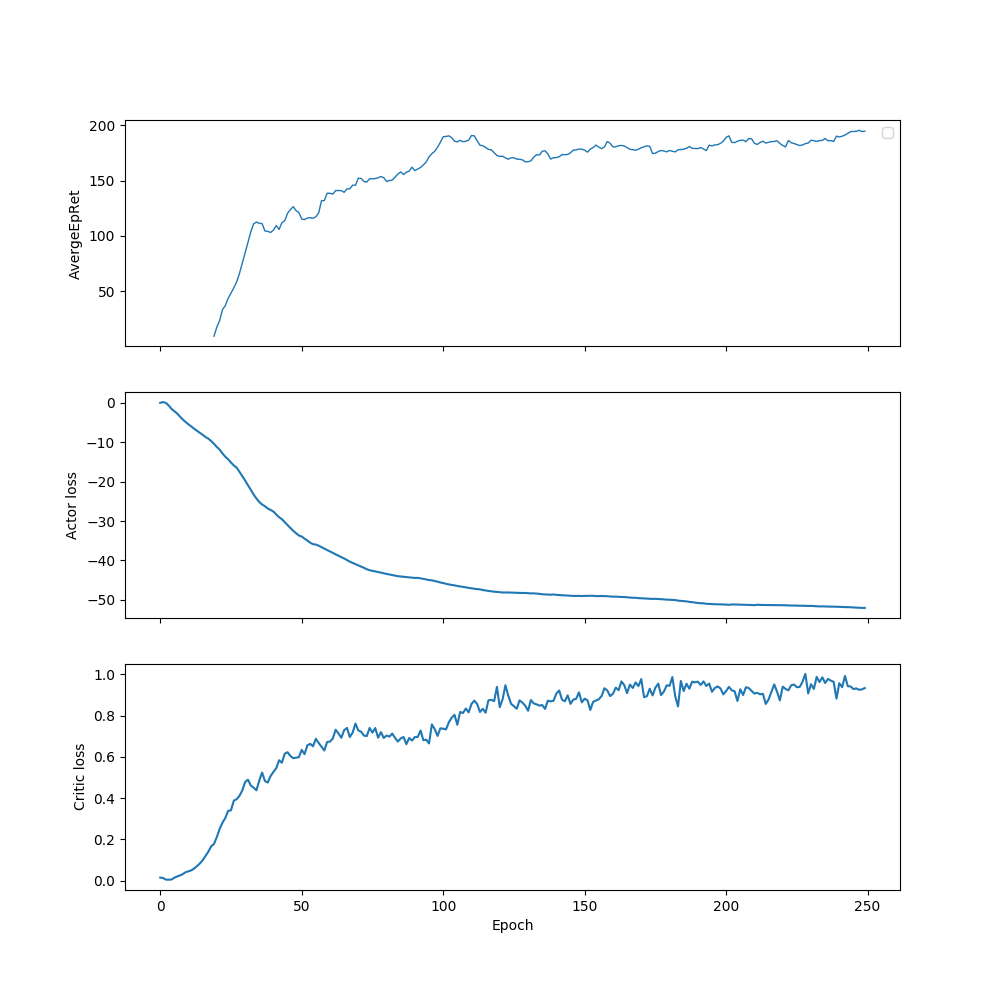

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


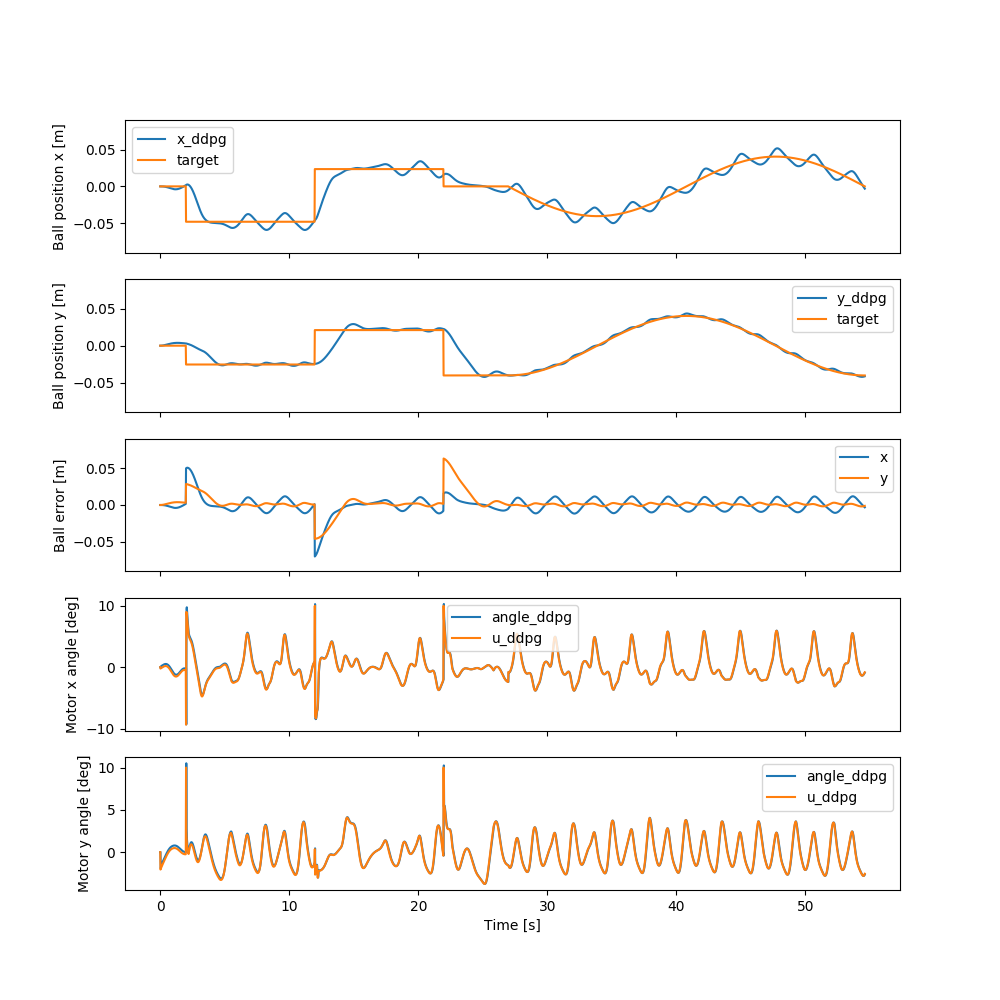

In [9]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100,50]
activation = torch.nn.Sigmoid
name='lep_0.6_[100,50]_sigmoid_hard'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller/exploratory_penality/lep_0.6_[100,50]_sigmoid_hard/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            100,
            50
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fb1260d6240>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller/exploratory_penality/lep_0.6_[100,50]_sigmoid_hard",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller/exploratory_penality/lep_0.6_[100,50]_sigmoid_hard/progress.txt' mode='w' encoding='UTF-8'>":	{
                    

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |           -29.2 |
|          StdEpRet |            6.42 |
|          MaxEpRet |           -20.9 |
|          MinEpRet |           -36.5 |
|  AverageTestEpRet |             109 |
|      StdTestEpRet |              25 |
|      MaxTestEpRet |             180 |
|      MinTestEpRet |            69.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            3.34 |
|          StdQVals |             2.9 |
|          MaxQVals |            12.5 |
|          MinQVals |           -1.38 |
|            LossPi |           -3.57 |
|             LossQ |          0.0221 |
|              Time |            79.6 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -20.6 |
|          StdEpRet |            18.7 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |             161 |
|          StdEpRet |            18.4 |
|          MaxEpRet |             179 |
|          MinEpRet |             142 |
|  AverageTestEpRet |             147 |
|      StdTestEpRet |            52.2 |
|      MaxTestEpRet |             247 |
|      MinTestEpRet |            70.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            12.6 |
|          StdQVals |            6.97 |
|          MaxQVals |            29.6 |
|          MinQVals |            1.32 |
|            LossPi |           -12.8 |
|             LossQ |           0.137 |
|              Time |             192 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |            83.1 |
|          StdEpRet |            22.6 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |            10.2 |
|          StdEpRet |            35.5 |
|          MaxEpRet |            43.9 |
|          MinEpRet |           -38.9 |
|  AverageTestEpRet |             126 |
|      StdTestEpRet |            66.7 |
|      MaxTestEpRet |             240 |
|      MinTestEpRet |             -15 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |            21.4 |
|          StdQVals |            10.5 |
|          MaxQVals |            42.9 |
|          MinQVals |            1.65 |
|            LossPi |           -21.6 |
|             LossQ |           0.326 |
|              Time |             301 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |            93.7 |
|          StdEpRet |            47.5 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |             202 |
|          StdEpRet |            19.8 |
|          MaxEpRet |             222 |
|          MinEpRet |             182 |
|  AverageTestEpRet |             148 |
|      StdTestEpRet |              59 |
|      MaxTestEpRet |             223 |
|      MinTestEpRet |            1.21 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            30.1 |
|          StdQVals |            13.9 |
|          MaxQVals |            52.4 |
|          MinQVals |            1.55 |
|            LossPi |           -30.3 |
|             LossQ |            0.52 |
|              Time |             400 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |            80.6 |
|          StdEpRet |            45.1 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |             180 |
|          StdEpRet |            58.9 |
|          MaxEpRet |             224 |
|          MinEpRet |              97 |
|  AverageTestEpRet |             193 |
|      StdTestEpRet |            37.4 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |             121 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            37.2 |
|          StdQVals |            14.9 |
|          MaxQVals |            59.5 |
|          MinQVals |            1.52 |
|            LossPi |           -37.4 |
|             LossQ |           0.626 |
|              Time |             504 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             183 |
|          StdEpRet |            54.9 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             104 |
|          StdEpRet |            20.9 |
|          MaxEpRet |             125 |
|          MinEpRet |            83.1 |
|  AverageTestEpRet |             164 |
|      StdTestEpRet |            83.9 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |           -84.6 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            42.8 |
|          StdQVals |            14.8 |
|          MaxQVals |            63.3 |
|          MinQVals |            5.15 |
|            LossPi |             -43 |
|             LossQ |           0.703 |
|              Time |             600 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             172 |
|          StdEpRet |            14.3 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             174 |
|          StdEpRet |            33.7 |
|          MaxEpRet |             202 |
|          MinEpRet |             127 |
|  AverageTestEpRet |             191 |
|      StdTestEpRet |            37.7 |
|      MaxTestEpRet |             256 |
|      MinTestEpRet |            98.9 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            46.2 |
|          StdQVals |              15 |
|          MaxQVals |            64.2 |
|          MinQVals |            3.88 |
|            LossPi |           -46.4 |
|             LossQ |           0.751 |
|              Time |             702 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             125 |
|          StdEpRet |            73.9 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             185 |
|          StdEpRet |            12.7 |
|          MaxEpRet |             198 |
|          MinEpRet |             173 |
|  AverageTestEpRet |             191 |
|      StdTestEpRet |            36.6 |
|      MaxTestEpRet |             257 |
|      MinTestEpRet |             111 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            48.1 |
|          StdQVals |            14.9 |
|          MaxQVals |              65 |
|          MinQVals |             2.1 |
|            LossPi |           -48.3 |
|             LossQ |           0.748 |
|              Time |             798 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             135 |
|          StdEpRet |            72.9 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             198 |
|          StdEpRet |            11.7 |
|          MaxEpRet |             212 |
|          MinEpRet |             183 |
|  AverageTestEpRet |             189 |
|      StdTestEpRet |            50.3 |
|      MaxTestEpRet |             239 |
|      MinTestEpRet |            28.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            49.7 |
|          StdQVals |              15 |
|          MaxQVals |            65.1 |
|          MinQVals |           -4.15 |
|            LossPi |           -49.8 |
|             LossQ |           0.782 |
|              Time |             894 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             227 |
|          StdEpRet |            15.3 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             206 |
|          StdEpRet |              26 |
|          MaxEpRet |             232 |
|          MinEpRet |             180 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            37.6 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |             128 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            51.2 |
|          StdQVals |            14.8 |
|          MaxQVals |            65.9 |
|          MinQVals |           -5.73 |
|            LossPi |           -51.3 |
|             LossQ |           0.777 |
|              Time |             993 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             200 |
|          StdEpRet |           0.815 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             188 |
|          StdEpRet |            13.6 |
|          MaxEpRet |             204 |
|          MinEpRet |             171 |
|  AverageTestEpRet |             207 |
|      StdTestEpRet |            33.7 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |             149 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            51.9 |
|          StdQVals |            14.5 |
|          MaxQVals |            66.2 |
|          MinQVals |           -3.59 |
|            LossPi |           -52.1 |
|             LossQ |           0.716 |
|              Time |        1.09e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             217 |
|          StdEpRet |            14.4 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             207 |
|          StdEpRet |            22.4 |
|          MaxEpRet |             230 |
|          MinEpRet |             185 |
|  AverageTestEpRet |             199 |
|      StdTestEpRet |            41.6 |
|      MaxTestEpRet |             273 |
|      MinTestEpRet |            87.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            52.8 |
|          StdQVals |            14.1 |
|          MaxQVals |            67.1 |
|          MinQVals |           -5.46 |
|            LossPi |           -52.9 |
|             LossQ |           0.758 |
|              Time |        1.19e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             183 |
|          StdEpRet |            26.4 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             178 |
|          StdEpRet |            10.1 |
|          MaxEpRet |             186 |
|          MinEpRet |             164 |
|  AverageTestEpRet |             183 |
|      StdTestEpRet |            32.7 |
|      MaxTestEpRet |             234 |
|      MinTestEpRet |             119 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            53.2 |
|          StdQVals |            13.5 |
|          MaxQVals |            67.4 |
|          MinQVals |           -11.9 |
|            LossPi |           -53.3 |
|             LossQ |           0.689 |
|              Time |        1.29e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             188 |
|          StdEpRet |            15.3 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             217 |
|          StdEpRet |            24.6 |
|          MaxEpRet |             242 |
|          MinEpRet |             193 |
|  AverageTestEpRet |             205 |
|      StdTestEpRet |            32.5 |
|      MaxTestEpRet |             248 |
|      MinTestEpRet |             120 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |            53.6 |
|          StdQVals |            13.3 |
|          MaxQVals |            68.1 |
|          MinQVals |           -4.35 |
|            LossPi |           -53.7 |
|             LossQ |           0.746 |
|              Time |         1.4e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             175 |
|          StdEpRet |            33.6 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             116 |
|          StdEpRet |             126 |
|          MaxEpRet |             225 |
|          MinEpRet |           -60.6 |
|  AverageTestEpRet |             183 |
|      StdTestEpRet |            66.8 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |           -65.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            53.6 |
|          StdQVals |            13.2 |
|          MaxQVals |            67.7 |
|          MinQVals |           0.586 |
|            LossPi |           -53.7 |
|             LossQ |           0.804 |
|              Time |         1.5e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             218 |
|          StdEpRet |            20.5 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             211 |
|          StdEpRet |            10.9 |
|          MaxEpRet |             222 |
|          MinEpRet |             201 |
|  AverageTestEpRet |             182 |
|      StdTestEpRet |            68.3 |
|      MaxTestEpRet |             253 |
|      MinTestEpRet |           -74.8 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            53.7 |
|          StdQVals |            12.9 |
|          MaxQVals |            67.2 |
|          MinQVals |            5.06 |
|            LossPi |           -53.8 |
|             LossQ |           0.796 |
|              Time |        1.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             170 |
|          StdEpRet |            22.6 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             192 |
|          StdEpRet |            5.99 |
|          MaxEpRet |             200 |
|          MinEpRet |             185 |
|  AverageTestEpRet |             201 |
|      StdTestEpRet |            38.6 |
|      MaxTestEpRet |             259 |
|      MinTestEpRet |             108 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |              54 |
|          StdQVals |            12.4 |
|          MaxQVals |            67.5 |
|          MinQVals |            1.75 |
|            LossPi |           -54.1 |
|             LossQ |            0.81 |
|              Time |        1.72e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             244 |
|          StdEpRet |            26.2 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             157 |
|          StdEpRet |            12.1 |
|          MaxEpRet |             169 |
|          MinEpRet |             145 |
|  AverageTestEpRet |             199 |
|      StdTestEpRet |            33.2 |
|      MaxTestEpRet |             245 |
|      MinTestEpRet |             143 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            54.3 |
|          StdQVals |            12.2 |
|          MaxQVals |            67.4 |
|          MinQVals |           0.964 |
|            LossPi |           -54.4 |
|             LossQ |           0.809 |
|              Time |        1.82e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             230 |
|          StdEpRet |            22.5 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             181 |
|          StdEpRet |            16.9 |
|          MaxEpRet |             204 |
|          MinEpRet |             167 |
|  AverageTestEpRet |             206 |
|      StdTestEpRet |            24.7 |
|      MaxTestEpRet |             242 |
|      MinTestEpRet |             137 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            54.5 |
|          StdQVals |            12.3 |
|          MaxQVals |            67.6 |
|          MinQVals |         0.00663 |
|            LossPi |           -54.6 |
|             LossQ |            0.81 |
|              Time |        1.92e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |             199 |
|          StdEpRet |            30.5 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             183 |
|          StdEpRet |            27.7 |
|          MaxEpRet |             210 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             195 |
|      StdTestEpRet |            75.7 |
|      MaxTestEpRet |             283 |
|      MinTestEpRet |           -95.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            54.7 |
|          StdQVals |              12 |
|          MaxQVals |            67.2 |
|          MinQVals |           -1.56 |
|            LossPi |           -54.8 |
|             LossQ |           0.851 |
|              Time |        2.02e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             216 |
|          StdEpRet |            32.2 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             182 |
|          StdEpRet |            18.3 |
|          MaxEpRet |             208 |
|          MinEpRet |             167 |
|  AverageTestEpRet |             203 |
|      StdTestEpRet |            31.4 |
|      MaxTestEpRet |             265 |
|      MinTestEpRet |             152 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            54.7 |
|          StdQVals |            11.6 |
|          MaxQVals |            66.8 |
|          MinQVals |            1.58 |
|            LossPi |           -54.8 |
|             LossQ |           0.821 |
|              Time |        2.12e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             207 |
|          StdEpRet |            12.2 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             194 |
|          StdEpRet |            31.6 |
|          MaxEpRet |             226 |
|          MinEpRet |             162 |
|  AverageTestEpRet |             213 |
|      StdTestEpRet |            25.3 |
|      MaxTestEpRet |             254 |
|      MinTestEpRet |             158 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            54.9 |
|          StdQVals |            11.3 |
|          MaxQVals |            66.9 |
|          MinQVals |            3.28 |
|            LossPi |             -55 |
|             LossQ |            0.78 |
|              Time |        2.22e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             194 |
|          StdEpRet |            12.8 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             169 |
|          StdEpRet |            31.4 |
|          MaxEpRet |             210 |
|          MinEpRet |             134 |
|  AverageTestEpRet |             204 |
|      StdTestEpRet |            48.5 |
|      MaxTestEpRet |             274 |
|      MinTestEpRet |            76.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            54.9 |
|          StdQVals |              11 |
|          MaxQVals |            66.5 |
|          MinQVals |            3.51 |
|            LossPi |             -55 |
|             LossQ |            0.83 |
|              Time |        2.32e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             128 |
|          StdEpRet |             102 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             177 |
|          StdEpRet |            10.7 |
|          MaxEpRet |             188 |
|          MinEpRet |             167 |
|  AverageTestEpRet |             198 |
|      StdTestEpRet |            72.3 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |           -83.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |              55 |
|          StdQVals |            11.2 |
|          MaxQVals |            66.9 |
|          MinQVals |            1.63 |
|            LossPi |           -55.1 |
|             LossQ |           0.863 |
|              Time |        2.41e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             174 |
|          StdEpRet |            33.7 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             217 |
|          StdEpRet |            32.8 |
|          MaxEpRet |             263 |
|          MinEpRet |             193 |
|  AverageTestEpRet |             218 |
|      StdTestEpRet |            30.9 |
|      MaxTestEpRet |             269 |
|      MinTestEpRet |             166 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |              55 |
|          StdQVals |            11.2 |
|          MaxQVals |            67.1 |
|          MinQVals |           -1.73 |
|            LossPi |           -55.1 |
|             LossQ |           0.835 |
|              Time |        2.51e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             195 |
|          StdEpRet |              26 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.00031636506601706913


<IPython.core.display.Javascript object>


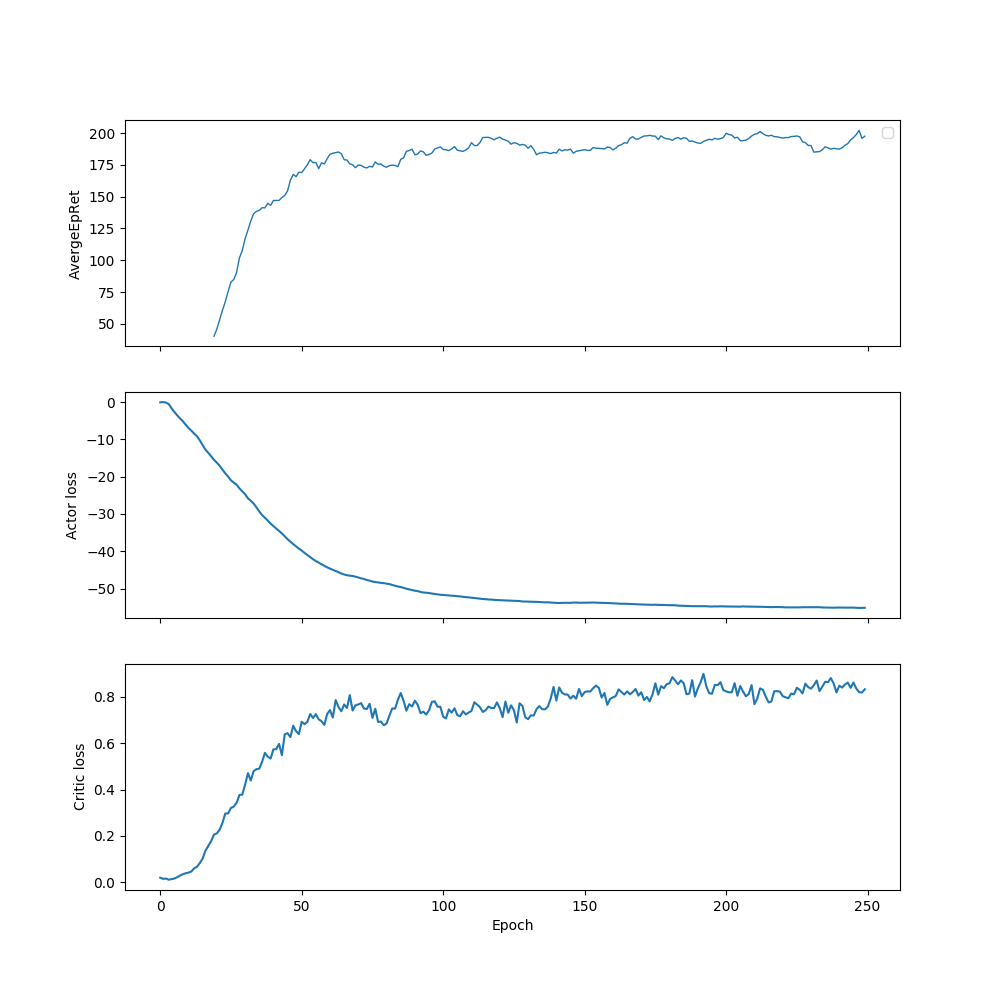

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


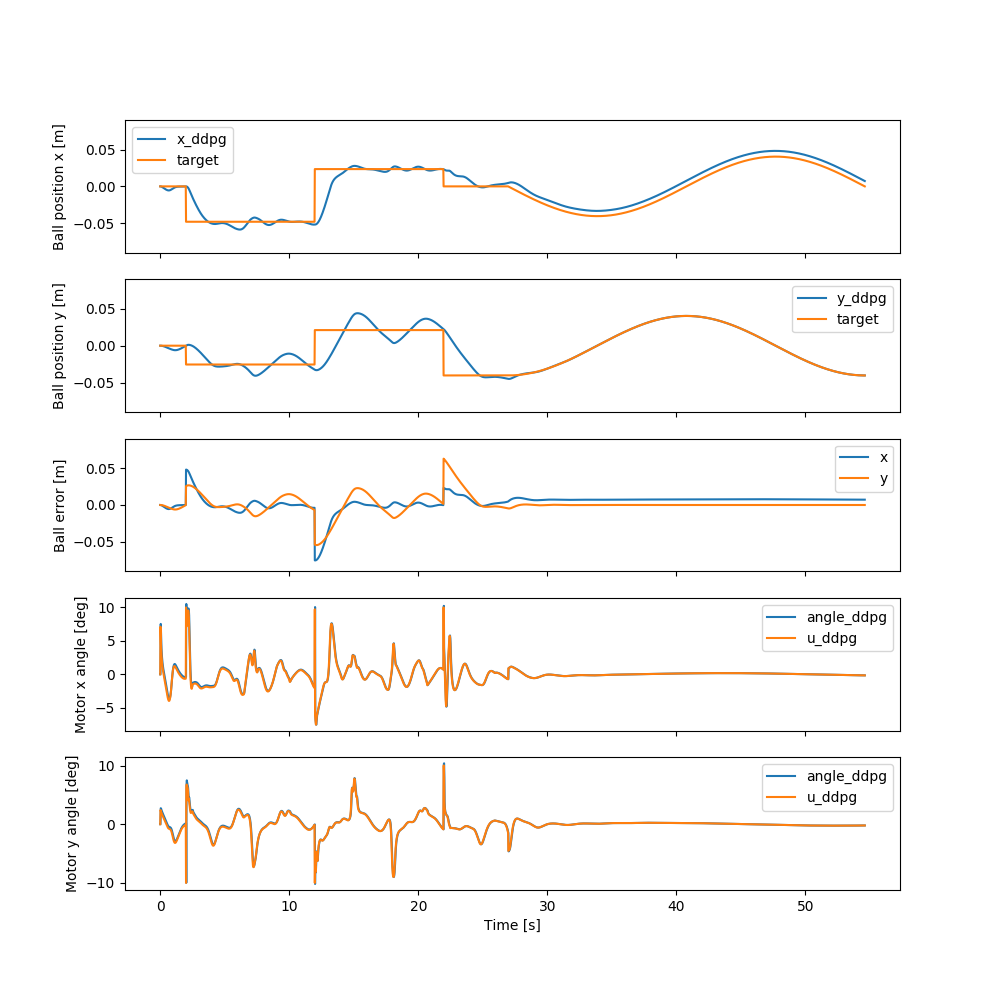

In [10]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.7
hidden_size = [100,50]
activation = torch.nn.Sigmoid
name='lep_0.7_[100,50]_sigmoid_hard'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

Logging data to src/data/black_box_controller/exploratory_penality/lep_0.6_[100,50]_sigmoid_hard/progress.txt
Saving config:

{
    "ac_kwargs":	{
        "activation":	"Sigmoid",
        "hidden_sizes":	[
            100,
            50
        ]
    },
    "act_noise":	0.1,
    "actor_critic":	"MLPActorCritic",
    "batch_size":	500,
    "env_fn":	"create_env",
    "epochs":	250,
    "exp_name":	"test",
    "gamma":	0.99,
    "logger":	{
        "<spinup.utils.logx.EpochLogger object at 0x7fb125e10ac8>":	{
            "epoch_dict":	{},
            "exp_name":	"test",
            "first_row":	true,
            "log_current_row":	{},
            "log_headers":	[],
            "output_dir":	"src/data/black_box_controller/exploratory_penality/lep_0.6_[100,50]_sigmoid_hard",
            "output_file":	{
                "<_io.TextIOWrapper name='src/data/black_box_controller/exploratory_penality/lep_0.6_[100,50]_sigmoid_hard/progress.txt' mode='w' encoding='UTF-8'>":	{
                    

---------------------------------------
|             Epoch |               7 |
|      AverageEpRet |            15.2 |
|          StdEpRet |            7.53 |
|          MaxEpRet |            21.7 |
|          MinEpRet |            4.68 |
|  AverageTestEpRet |             133 |
|      StdTestEpRet |            25.4 |
|      MaxTestEpRet |             197 |
|      MinTestEpRet |            90.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         7.7e+03 |
|      AverageQVals |            5.06 |
|          StdQVals |             2.2 |
|          MaxQVals |            12.1 |
|          MinQVals |            1.26 |
|            LossPi |            -5.3 |
|             LossQ |          0.0144 |
|              Time |            68.6 |
---------------------------------------
---------------------------------------
|             Epoch |               8 |
|      AverageEpRet |           -13.9 |
|          StdEpRet |            7.69 |


---------------------------------------
|             Epoch |              17 |
|      AverageEpRet |            79.1 |
|          StdEpRet |            20.1 |
|          MaxEpRet |            99.2 |
|          MinEpRet |            59.1 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |              44 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |              79 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.87e+04 |
|      AverageQVals |            13.7 |
|          StdQVals |            5.69 |
|          MaxQVals |            29.8 |
|          MinQVals |            3.81 |
|            LossPi |           -13.9 |
|             LossQ |           0.075 |
|              Time |             197 |
---------------------------------------
---------------------------------------
|             Epoch |              18 |
|      AverageEpRet |             140 |
|          StdEpRet |            23.9 |


---------------------------------------
|             Epoch |              27 |
|      AverageEpRet |             169 |
|          StdEpRet |            17.9 |
|          MaxEpRet |             194 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             144 |
|      StdTestEpRet |            91.9 |
|      MaxTestEpRet |             244 |
|      MinTestEpRet |           -15.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.97e+04 |
|      AverageQVals |              24 |
|          StdQVals |              11 |
|          MaxQVals |            45.1 |
|          MinQVals |            5.01 |
|            LossPi |           -24.2 |
|             LossQ |           0.308 |
|              Time |             412 |
---------------------------------------
---------------------------------------
|             Epoch |              28 |
|      AverageEpRet |             182 |
|          StdEpRet |            27.8 |


---------------------------------------
|             Epoch |              37 |
|      AverageEpRet |            82.5 |
|          StdEpRet |            68.8 |
|          MaxEpRet |             151 |
|          MinEpRet |            13.7 |
|  AverageTestEpRet |             167 |
|      StdTestEpRet |            45.3 |
|      MaxTestEpRet |             225 |
|      MinTestEpRet |            4.79 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        4.07e+04 |
|      AverageQVals |            34.2 |
|          StdQVals |            13.6 |
|          MaxQVals |            53.4 |
|          MinQVals |            6.74 |
|            LossPi |           -34.5 |
|             LossQ |           0.471 |
|              Time |             539 |
---------------------------------------
---------------------------------------
|             Epoch |              38 |
|      AverageEpRet |             184 |
|          StdEpRet |            7.51 |


---------------------------------------
|             Epoch |              47 |
|      AverageEpRet |            56.6 |
|          StdEpRet |              70 |
|          MaxEpRet |             141 |
|          MinEpRet |           -30.1 |
|  AverageTestEpRet |             173 |
|      StdTestEpRet |            32.7 |
|      MaxTestEpRet |             232 |
|      MinTestEpRet |            86.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        5.17e+04 |
|      AverageQVals |            40.3 |
|          StdQVals |            14.3 |
|          MaxQVals |            58.9 |
|          MinQVals |            5.33 |
|            LossPi |           -40.5 |
|             LossQ |           0.541 |
|              Time |             677 |
---------------------------------------
---------------------------------------
|             Epoch |              48 |
|      AverageEpRet |             205 |
|          StdEpRet |            36.3 |


---------------------------------------
|             Epoch |              57 |
|      AverageEpRet |             104 |
|          StdEpRet |             117 |
|          MaxEpRet |             222 |
|          MinEpRet |           -13.1 |
|  AverageTestEpRet |             193 |
|      StdTestEpRet |            37.9 |
|      MaxTestEpRet |             259 |
|      MinTestEpRet |             120 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        6.27e+04 |
|      AverageQVals |            44.1 |
|          StdQVals |            14.4 |
|          MaxQVals |            62.5 |
|          MinQVals |             3.3 |
|            LossPi |           -44.2 |
|             LossQ |           0.476 |
|              Time |             812 |
---------------------------------------
---------------------------------------
|             Epoch |              58 |
|      AverageEpRet |             218 |
|          StdEpRet |            37.2 |


---------------------------------------
|             Epoch |              67 |
|      AverageEpRet |             226 |
|          StdEpRet |            24.1 |
|          MaxEpRet |             256 |
|          MinEpRet |             198 |
|  AverageTestEpRet |             191 |
|      StdTestEpRet |            82.4 |
|      MaxTestEpRet |             285 |
|      MinTestEpRet |           -60.5 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        7.37e+04 |
|      AverageQVals |            46.6 |
|          StdQVals |            14.4 |
|          MaxQVals |            64.5 |
|          MinQVals |            3.19 |
|            LossPi |           -46.8 |
|             LossQ |           0.528 |
|              Time |             971 |
---------------------------------------
---------------------------------------
|             Epoch |              68 |
|      AverageEpRet |             196 |
|          StdEpRet |            54.4 |


---------------------------------------
|             Epoch |              77 |
|      AverageEpRet |             240 |
|          StdEpRet |            3.23 |
|          MaxEpRet |             243 |
|          MinEpRet |             237 |
|  AverageTestEpRet |             212 |
|      StdTestEpRet |            25.4 |
|      MaxTestEpRet |             263 |
|      MinTestEpRet |             160 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        8.47e+04 |
|      AverageQVals |            49.3 |
|          StdQVals |            14.1 |
|          MaxQVals |            65.9 |
|          MinQVals |            0.75 |
|            LossPi |           -49.5 |
|             LossQ |           0.607 |
|              Time |        1.12e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              78 |
|      AverageEpRet |             222 |
|          StdEpRet |            28.8 |


---------------------------------------
|             Epoch |              87 |
|      AverageEpRet |             205 |
|          StdEpRet |            39.4 |
|          MaxEpRet |             251 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             200 |
|      StdTestEpRet |            37.3 |
|      MaxTestEpRet |             243 |
|      MinTestEpRet |             107 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        9.57e+04 |
|      AverageQVals |            51.6 |
|          StdQVals |            13.6 |
|          MaxQVals |            67.1 |
|          MinQVals |            2.86 |
|            LossPi |           -51.8 |
|             LossQ |           0.591 |
|              Time |        1.29e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              88 |
|      AverageEpRet |             211 |
|          StdEpRet |            33.1 |


---------------------------------------
|             Epoch |              97 |
|      AverageEpRet |             229 |
|          StdEpRet |            22.7 |
|          MaxEpRet |             251 |
|          MinEpRet |             206 |
|  AverageTestEpRet |             202 |
|      StdTestEpRet |            49.1 |
|      MaxTestEpRet |             283 |
|      MinTestEpRet |            73.4 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.07e+05 |
|      AverageQVals |            52.9 |
|          StdQVals |            13.6 |
|          MaxQVals |            67.5 |
|          MinQVals |            5.23 |
|            LossPi |           -53.1 |
|             LossQ |           0.659 |
|              Time |        1.46e+03 |
---------------------------------------
---------------------------------------
|             Epoch |              98 |
|      AverageEpRet |             193 |
|          StdEpRet |            51.3 |


---------------------------------------
|             Epoch |             107 |
|      AverageEpRet |             156 |
|          StdEpRet |             129 |
|          MaxEpRet |             257 |
|          MinEpRet |           -25.9 |
|  AverageTestEpRet |             208 |
|      StdTestEpRet |            37.6 |
|      MaxTestEpRet |             269 |
|      MinTestEpRet |             137 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.18e+05 |
|      AverageQVals |            53.8 |
|          StdQVals |              14 |
|          MaxQVals |            68.5 |
|          MinQVals |            1.45 |
|            LossPi |             -54 |
|             LossQ |           0.668 |
|              Time |        1.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             108 |
|      AverageEpRet |             185 |
|          StdEpRet |            50.2 |


---------------------------------------
|             Epoch |             117 |
|      AverageEpRet |             249 |
|          StdEpRet |            34.3 |
|          MaxEpRet |             283 |
|          MinEpRet |             214 |
|  AverageTestEpRet |             224 |
|      StdTestEpRet |            37.9 |
|      MaxTestEpRet |             283 |
|      MinTestEpRet |             146 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.29e+05 |
|      AverageQVals |            54.7 |
|          StdQVals |            13.9 |
|          MaxQVals |            68.3 |
|          MinQVals |           -1.87 |
|            LossPi |           -54.8 |
|             LossQ |           0.634 |
|              Time |        1.75e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             118 |
|      AverageEpRet |             188 |
|          StdEpRet |            37.9 |


---------------------------------------
|             Epoch |             127 |
|      AverageEpRet |             191 |
|          StdEpRet |            28.1 |
|          MaxEpRet |             224 |
|          MinEpRet |             155 |
|  AverageTestEpRet |             230 |
|      StdTestEpRet |            29.7 |
|      MaxTestEpRet |             280 |
|      MinTestEpRet |             178 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         1.4e+05 |
|      AverageQVals |            55.5 |
|          StdQVals |            13.6 |
|          MaxQVals |            68.7 |
|          MinQVals |           0.486 |
|            LossPi |           -55.6 |
|             LossQ |           0.708 |
|              Time |        1.88e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             128 |
|      AverageEpRet |             231 |
|          StdEpRet |              17 |


---------------------------------------
|             Epoch |             137 |
|      AverageEpRet |             223 |
|          StdEpRet |            9.78 |
|          MaxEpRet |             233 |
|          MinEpRet |             213 |
|  AverageTestEpRet |             216 |
|      StdTestEpRet |            49.9 |
|      MaxTestEpRet |             300 |
|      MinTestEpRet |            63.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.51e+05 |
|      AverageQVals |              56 |
|          StdQVals |            13.5 |
|          MaxQVals |            68.6 |
|          MinQVals |            1.61 |
|            LossPi |           -56.1 |
|             LossQ |           0.739 |
|              Time |        2.02e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             138 |
|      AverageEpRet |             117 |
|          StdEpRet |            30.9 |


---------------------------------------
|             Epoch |             147 |
|      AverageEpRet |             226 |
|          StdEpRet |            18.8 |
|          MaxEpRet |             244 |
|          MinEpRet |             200 |
|  AverageTestEpRet |             191 |
|      StdTestEpRet |            41.8 |
|      MaxTestEpRet |             249 |
|      MinTestEpRet |            73.7 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.62e+05 |
|      AverageQVals |            56.7 |
|          StdQVals |            13.5 |
|          MaxQVals |            69.6 |
|          MinQVals |          -0.349 |
|            LossPi |           -56.9 |
|             LossQ |           0.822 |
|              Time |        2.18e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             148 |
|      AverageEpRet |             245 |
|          StdEpRet |            8.85 |


---------------------------------------
|             Epoch |             157 |
|      AverageEpRet |             183 |
|          StdEpRet |              33 |
|          MaxEpRet |             216 |
|          MinEpRet |             150 |
|  AverageTestEpRet |             193 |
|      StdTestEpRet |            64.3 |
|      MaxTestEpRet |             278 |
|      MinTestEpRet |            -9.3 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.73e+05 |
|      AverageQVals |            57.2 |
|          StdQVals |            13.4 |
|          MaxQVals |            69.2 |
|          MinQVals |           -4.04 |
|            LossPi |           -57.4 |
|             LossQ |           0.859 |
|              Time |        2.34e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             158 |
|      AverageEpRet |             212 |
|          StdEpRet |            37.9 |


---------------------------------------
|             Epoch |             167 |
|      AverageEpRet |             183 |
|          StdEpRet |            34.4 |
|          MaxEpRet |             222 |
|          MinEpRet |             138 |
|  AverageTestEpRet |             193 |
|      StdTestEpRet |            54.3 |
|      MaxTestEpRet |             258 |
|      MinTestEpRet |            15.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.84e+05 |
|      AverageQVals |            57.5 |
|          StdQVals |            12.9 |
|          MaxQVals |            69.1 |
|          MinQVals |           -3.79 |
|            LossPi |           -57.6 |
|             LossQ |           0.839 |
|              Time |        2.47e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             168 |
|      AverageEpRet |             216 |
|          StdEpRet |            27.6 |


---------------------------------------
|             Epoch |             177 |
|      AverageEpRet |             213 |
|          StdEpRet |           0.915 |
|          MaxEpRet |             214 |
|          MinEpRet |             212 |
|  AverageTestEpRet |             177 |
|      StdTestEpRet |            76.6 |
|      MaxTestEpRet |             255 |
|      MinTestEpRet |           -12.2 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        1.95e+05 |
|      AverageQVals |            57.9 |
|          StdQVals |            12.9 |
|          MaxQVals |            69.1 |
|          MinQVals |           -3.64 |
|            LossPi |             -58 |
|             LossQ |           0.826 |
|              Time |        2.58e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             178 |
|      AverageEpRet |             195 |
|          StdEpRet |            5.28 |


---------------------------------------
|             Epoch |             187 |
|      AverageEpRet |             183 |
|          StdEpRet |            26.4 |
|          MaxEpRet |             220 |
|          MinEpRet |             159 |
|  AverageTestEpRet |             194 |
|      StdTestEpRet |            63.5 |
|      MaxTestEpRet |             268 |
|      MinTestEpRet |           -40.1 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.06e+05 |
|      AverageQVals |            58.1 |
|          StdQVals |            12.9 |
|          MaxQVals |              70 |
|          MinQVals |           -1.14 |
|            LossPi |           -58.3 |
|             LossQ |           0.805 |
|              Time |        2.71e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             188 |
|      AverageEpRet |            75.7 |
|          StdEpRet |             115 |


---------------------------------------
|             Epoch |             197 |
|      AverageEpRet |             210 |
|          StdEpRet |            23.6 |
|          MaxEpRet |             234 |
|          MinEpRet |             187 |
|  AverageTestEpRet |             200 |
|      StdTestEpRet |            49.9 |
|      MaxTestEpRet |             298 |
|      MinTestEpRet |             118 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.17e+05 |
|      AverageQVals |            57.6 |
|          StdQVals |            13.1 |
|          MaxQVals |            69.6 |
|          MinQVals |           -1.31 |
|            LossPi |           -57.7 |
|             LossQ |           0.774 |
|              Time |        2.86e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             198 |
|      AverageEpRet |             192 |
|          StdEpRet |            28.8 |


---------------------------------------
|             Epoch |             207 |
|      AverageEpRet |             211 |
|          StdEpRet |             5.2 |
|          MaxEpRet |             215 |
|          MinEpRet |             204 |
|  AverageTestEpRet |             212 |
|      StdTestEpRet |            59.5 |
|      MaxTestEpRet |             262 |
|      MinTestEpRet |             -19 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.28e+05 |
|      AverageQVals |            57.4 |
|          StdQVals |            13.4 |
|          MaxQVals |              70 |
|          MinQVals |            4.69 |
|            LossPi |           -57.5 |
|             LossQ |           0.824 |
|              Time |           3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             208 |
|      AverageEpRet |             229 |
|          StdEpRet |            13.7 |


---------------------------------------
|             Epoch |             217 |
|      AverageEpRet |             198 |
|          StdEpRet |            23.1 |
|          MaxEpRet |             221 |
|          MinEpRet |             174 |
|  AverageTestEpRet |             212 |
|      StdTestEpRet |            37.1 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |             134 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.39e+05 |
|      AverageQVals |            57.9 |
|          StdQVals |            13.4 |
|          MaxQVals |            69.9 |
|          MinQVals |           -1.86 |
|            LossPi |             -58 |
|             LossQ |           0.863 |
|              Time |        3.14e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             218 |
|      AverageEpRet |             227 |
|          StdEpRet |            31.6 |


---------------------------------------
|             Epoch |             227 |
|      AverageEpRet |             161 |
|          StdEpRet |            34.4 |
|          MaxEpRet |             202 |
|          MinEpRet |             118 |
|  AverageTestEpRet |             215 |
|      StdTestEpRet |            31.1 |
|      MaxTestEpRet |             272 |
|      MinTestEpRet |             150 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |         2.5e+05 |
|      AverageQVals |            58.2 |
|          StdQVals |            13.3 |
|          MaxQVals |            69.5 |
|          MinQVals |            1.13 |
|            LossPi |           -58.3 |
|             LossQ |           0.817 |
|              Time |         3.3e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             228 |
|      AverageEpRet |             224 |
|          StdEpRet |            7.37 |


---------------------------------------
|             Epoch |             237 |
|      AverageEpRet |             202 |
|          StdEpRet |            8.25 |
|          MaxEpRet |             211 |
|          MinEpRet |             194 |
|  AverageTestEpRet |             213 |
|      StdTestEpRet |            30.6 |
|      MaxTestEpRet |             257 |
|      MinTestEpRet |             150 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.61e+05 |
|      AverageQVals |              58 |
|          StdQVals |            13.2 |
|          MaxQVals |            70.1 |
|          MinQVals |           -2.28 |
|            LossPi |           -58.1 |
|             LossQ |           0.778 |
|              Time |        3.45e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             238 |
|      AverageEpRet |             230 |
|          StdEpRet |              27 |


---------------------------------------
|             Epoch |             247 |
|      AverageEpRet |             192 |
|          StdEpRet |            26.4 |
|          MaxEpRet |             222 |
|          MinEpRet |             158 |
|  AverageTestEpRet |             210 |
|      StdTestEpRet |              28 |
|      MaxTestEpRet |             253 |
|      MinTestEpRet |             138 |
|             EpLen |             400 |
|         TestEpLen |             400 |
| TotalEnvInteracts |        2.72e+05 |
|      AverageQVals |            57.7 |
|          StdQVals |              13 |
|          MaxQVals |              68 |
|          MinQVals |           -3.36 |
|            LossPi |           -57.8 |
|             LossQ |           0.797 |
|              Time |        3.61e+03 |
---------------------------------------
---------------------------------------
|             Epoch |             248 |
|      AverageEpRet |             220 |
|          StdEpRet |            17.5 |


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.00025005270020473405


<IPython.core.display.Javascript object>


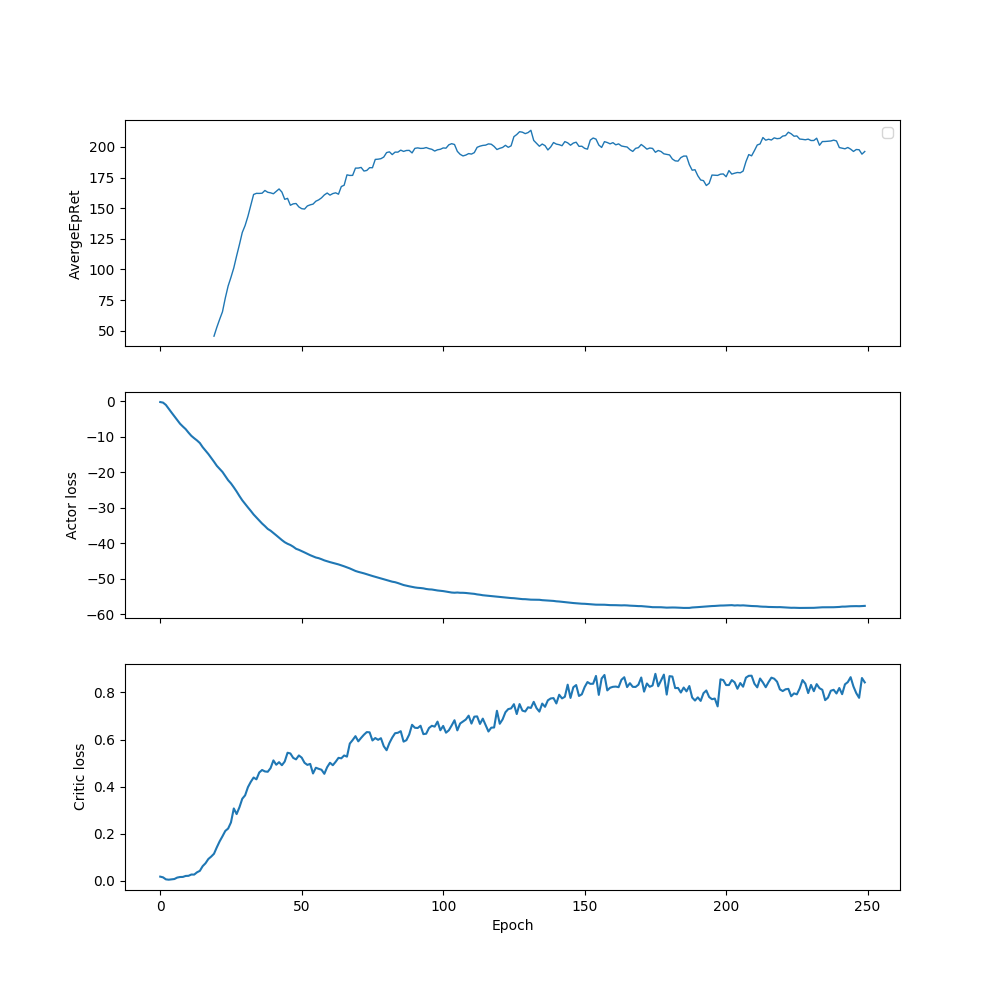

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


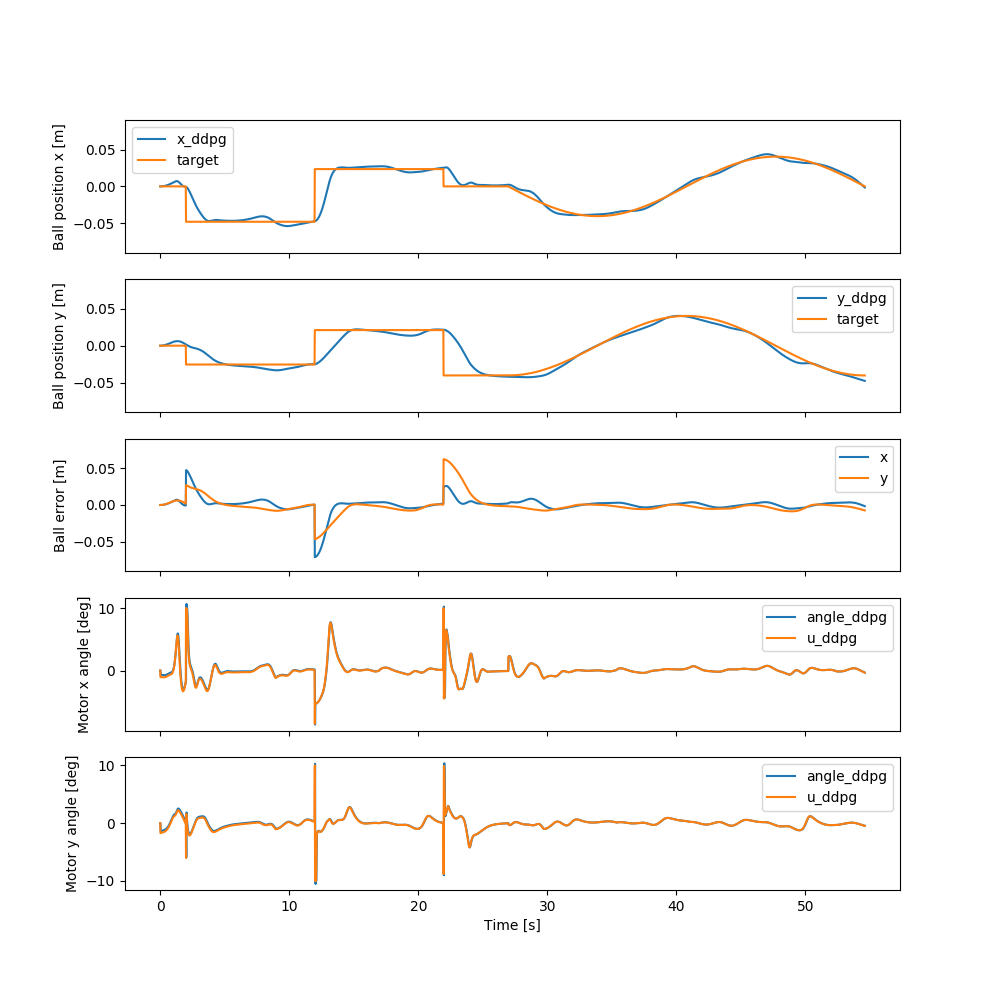

In [11]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.8
hidden_size = [100,50]
activation = torch.nn.Sigmoid
name='lep_0.8_[100,50]_sigmoid_hard'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00033188190608289113


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


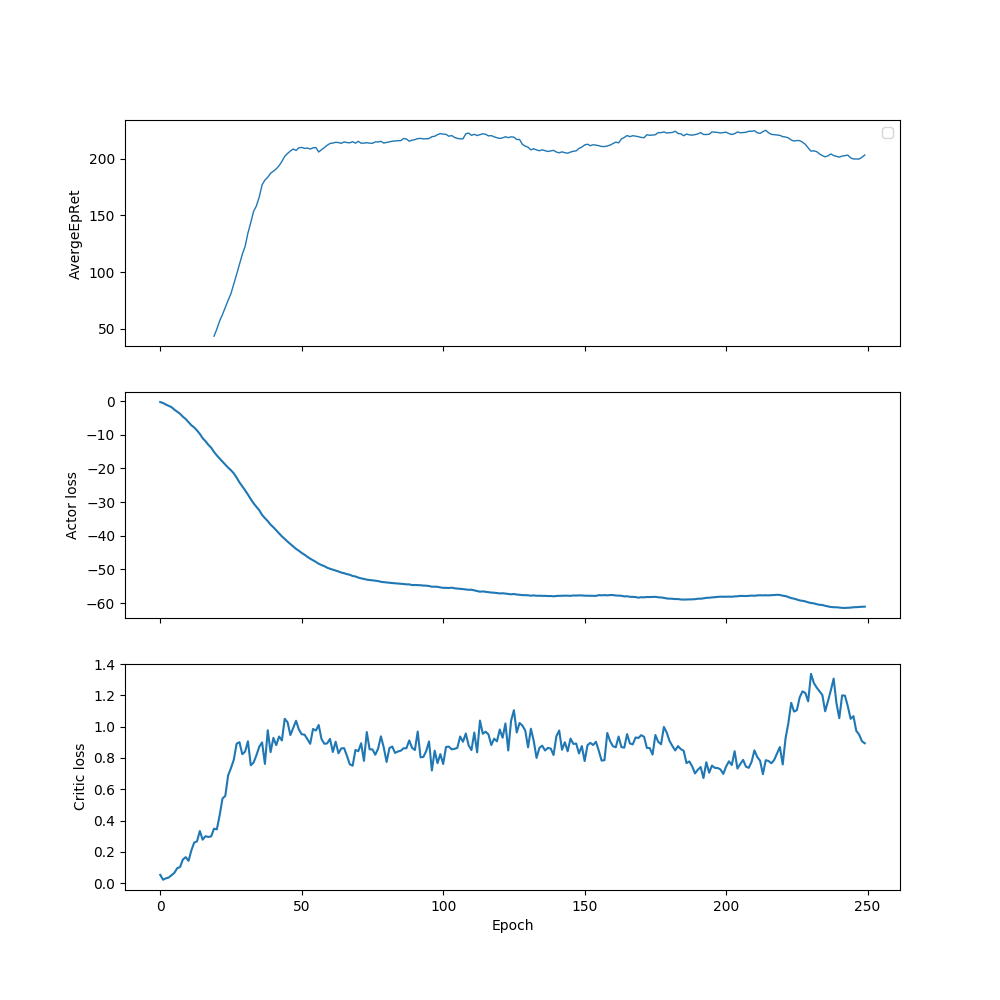

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


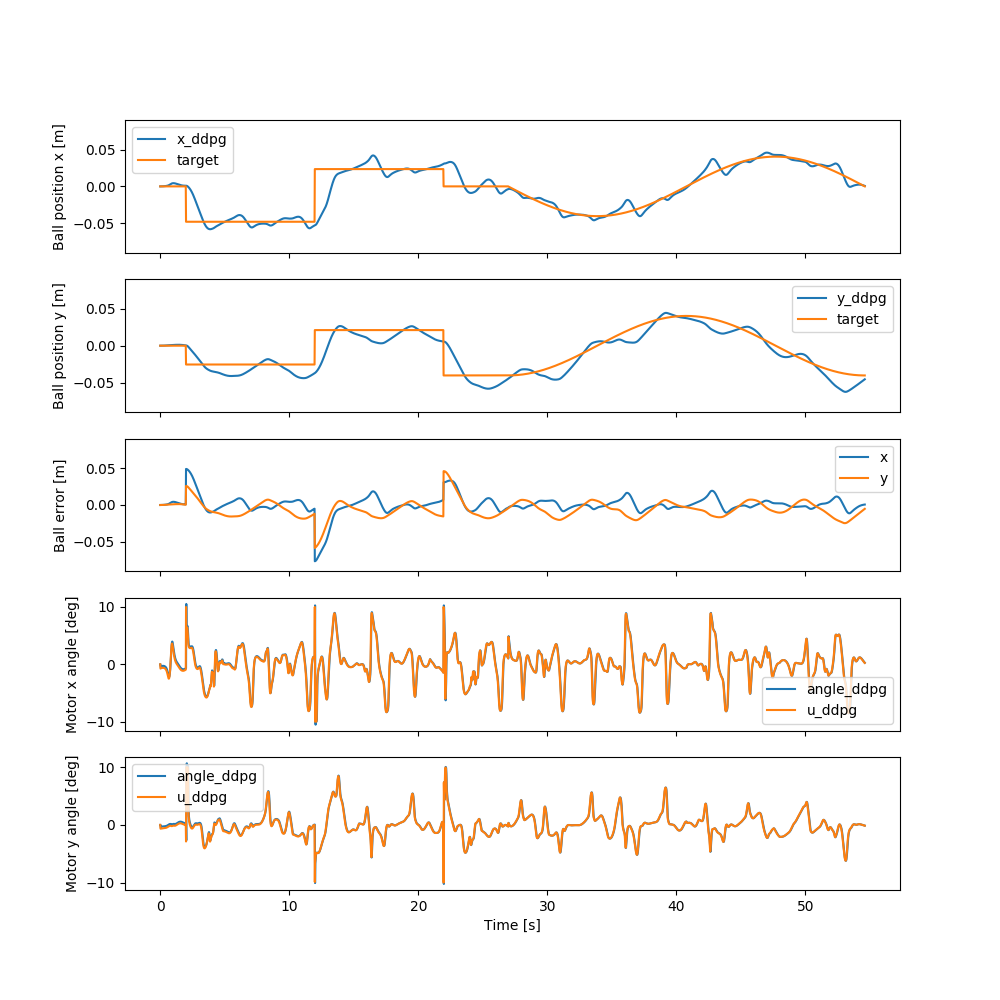

In [28]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400,200]
activation = torch.nn.Sigmoid
name='lep_0.6_[400,200]_sigmoid_hard'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.0002938316299979435


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


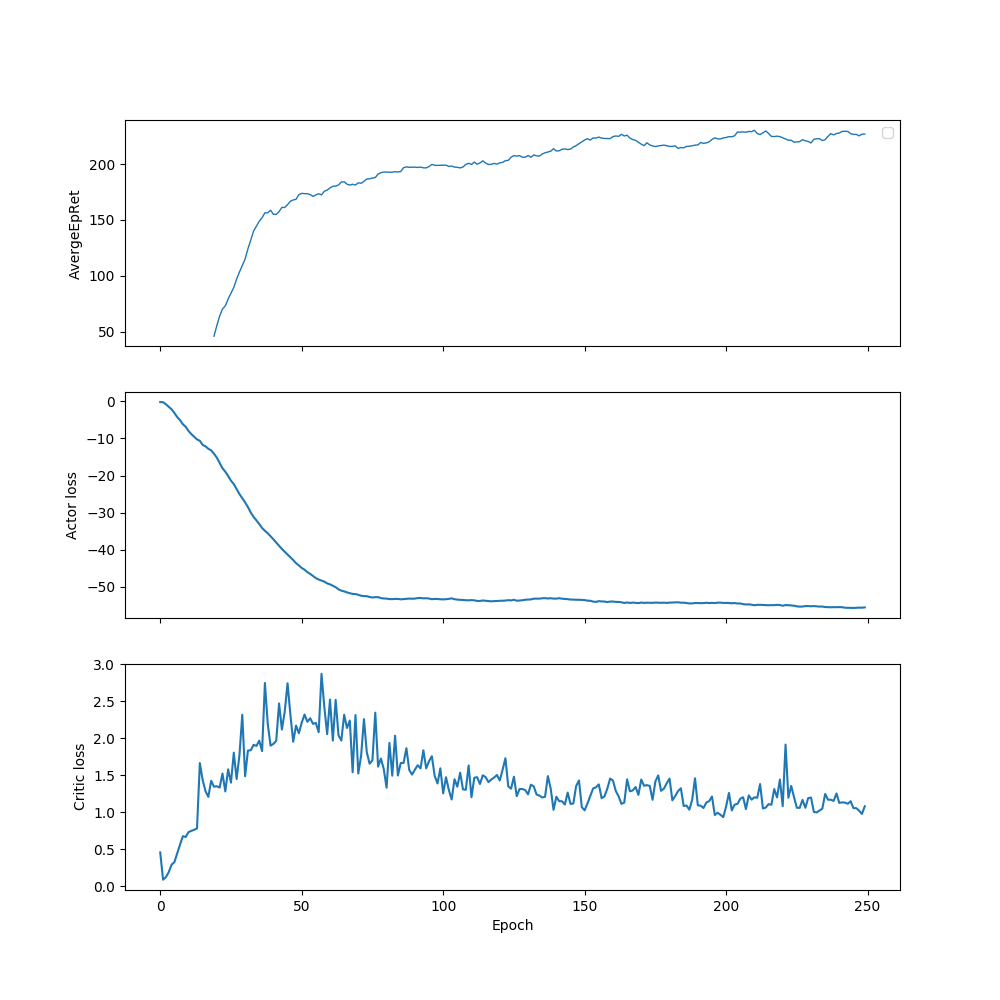

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


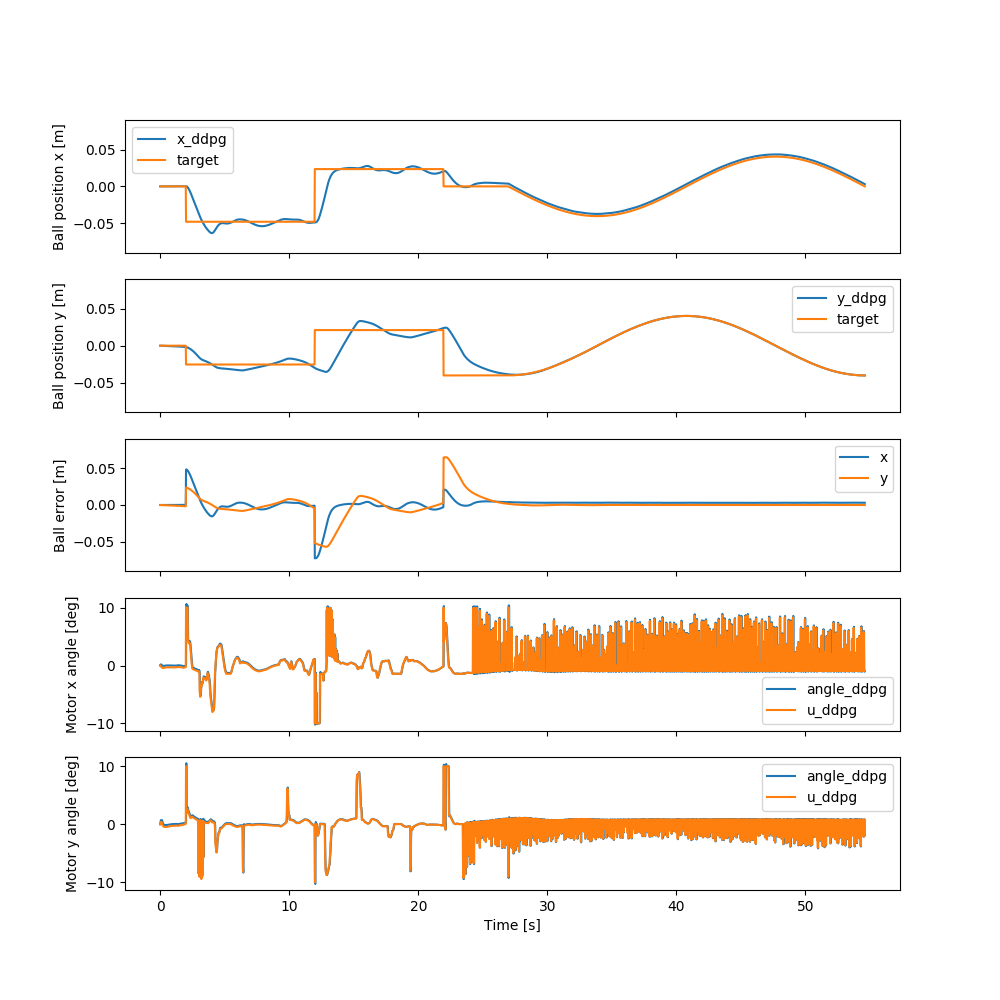

In [29]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400,200]
activation = torch.nn.ReLU
name='lep_0.6_[400,200]_relu_hard'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00032970034464724167


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


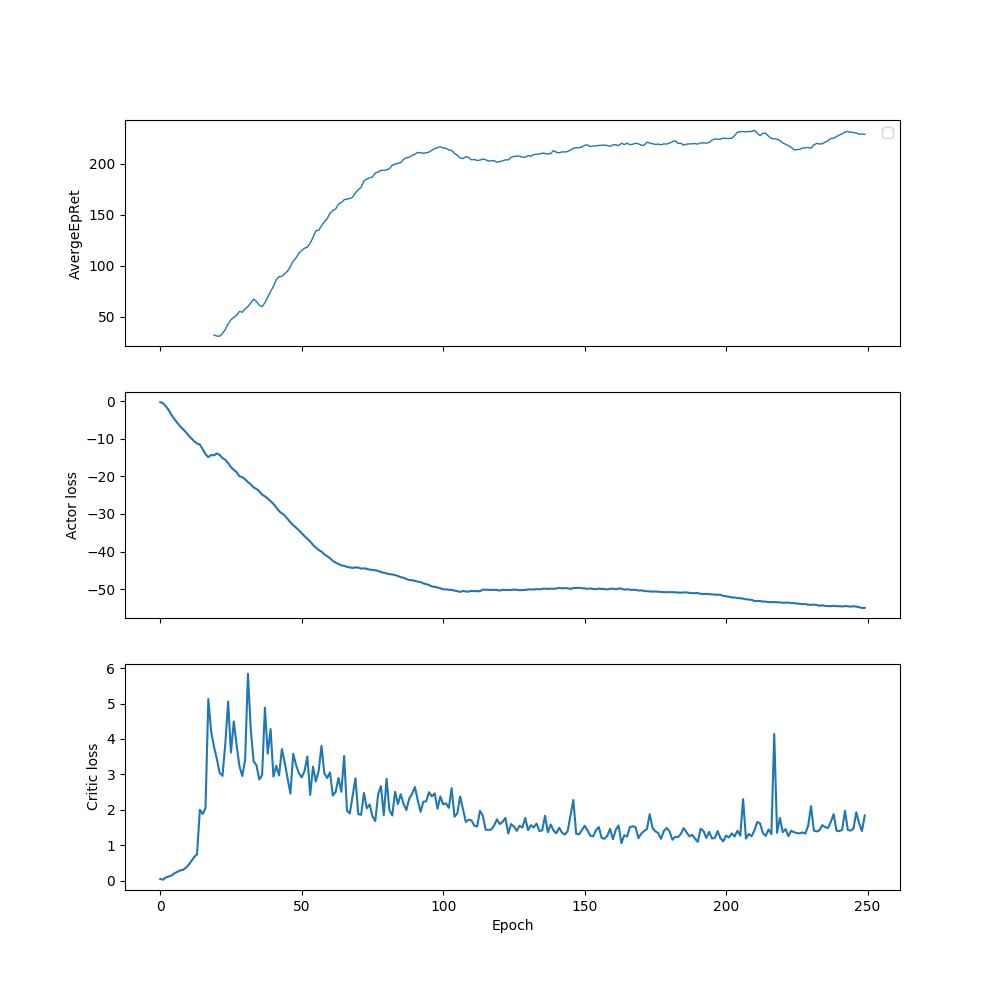

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


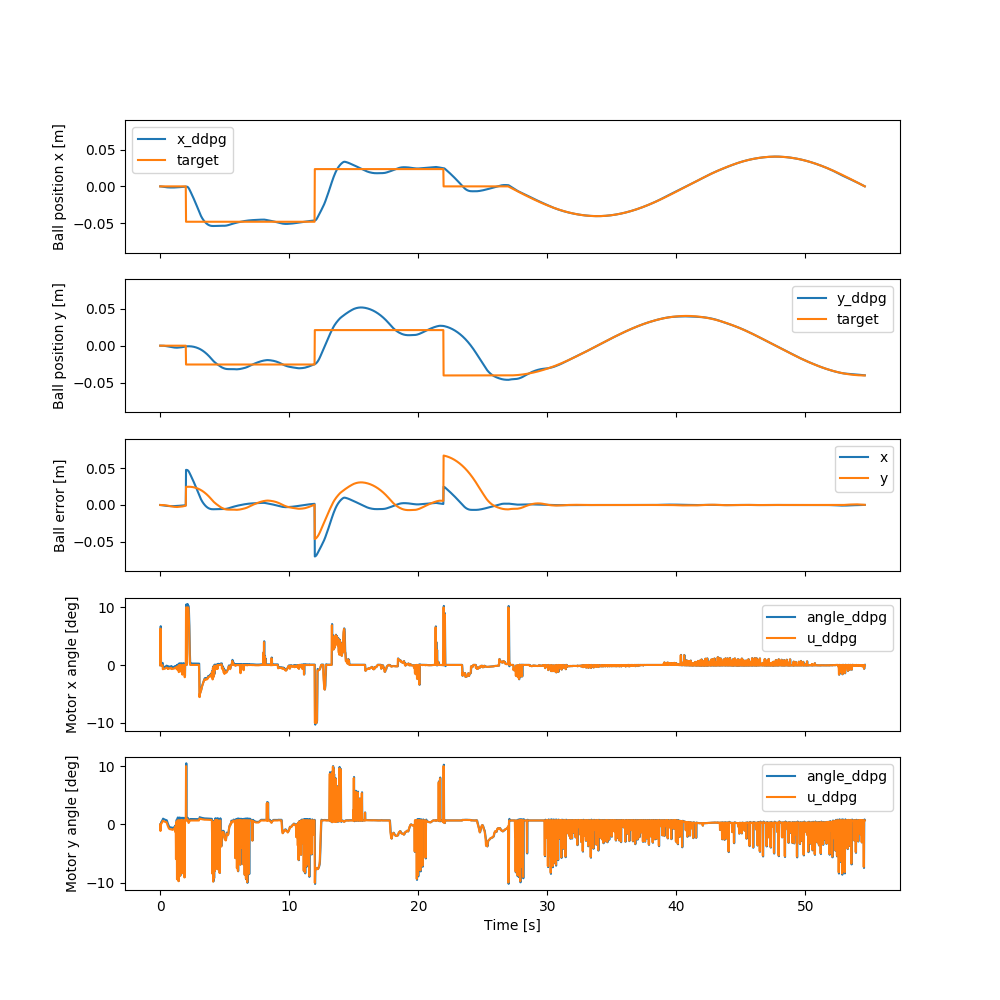

In [30]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,200,100]
activation = torch.nn.ReLU
name='lep_0.6_[200,200,100]_relu_hard'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.000353101073062777


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


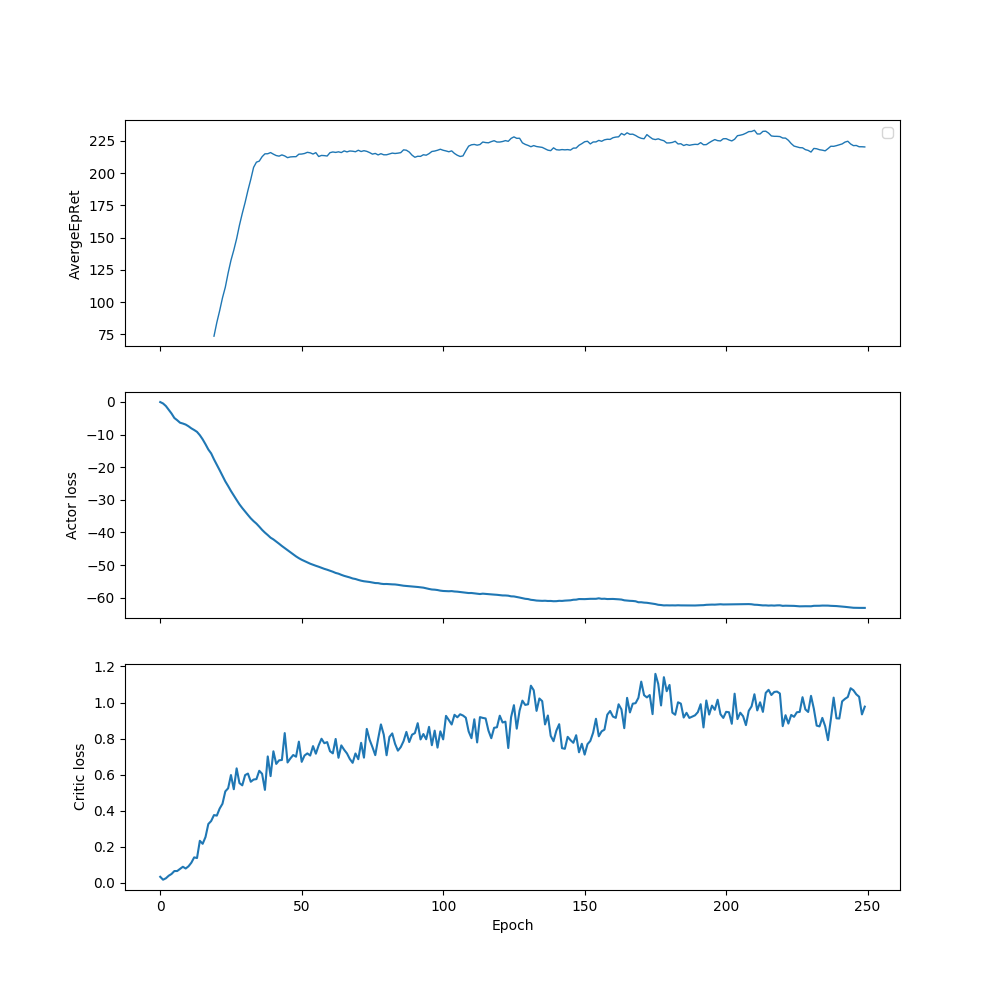

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


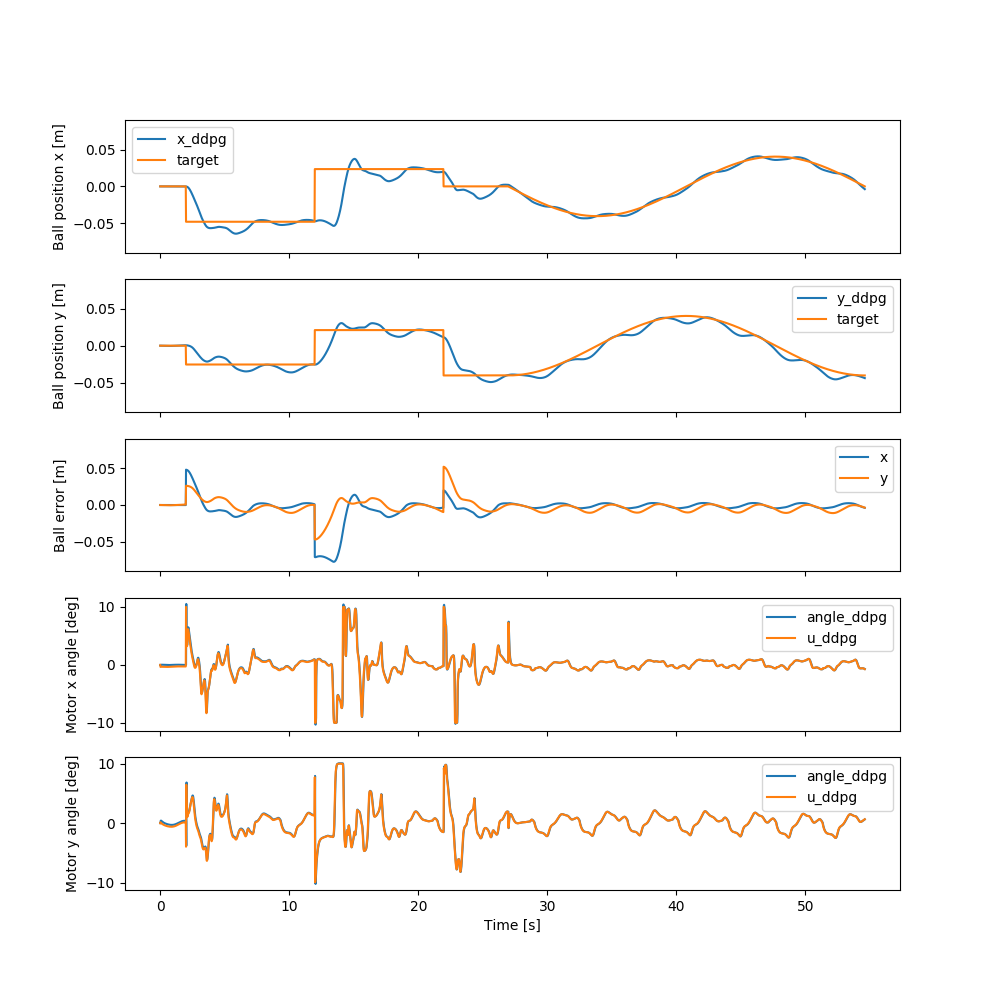

In [31]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,200,100]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,200,100]_sigmoid_hard'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.0018511138001847446


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


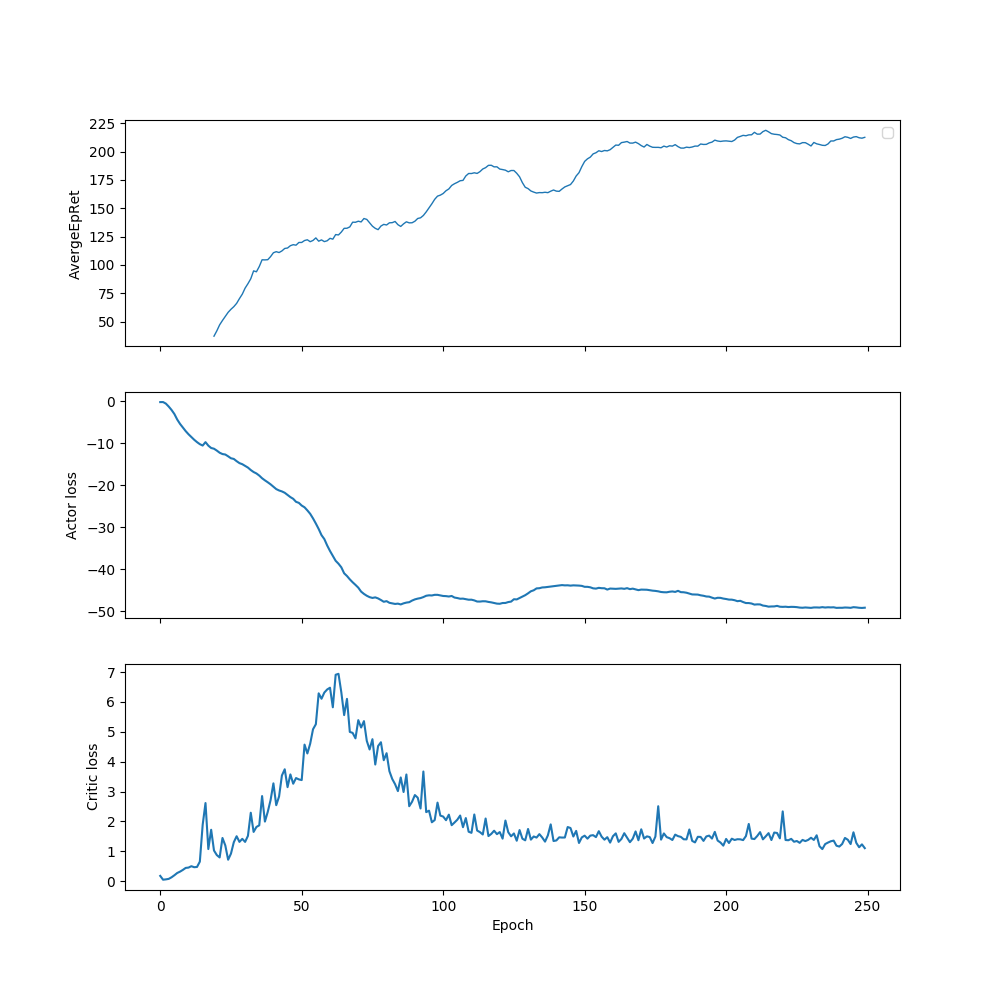

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


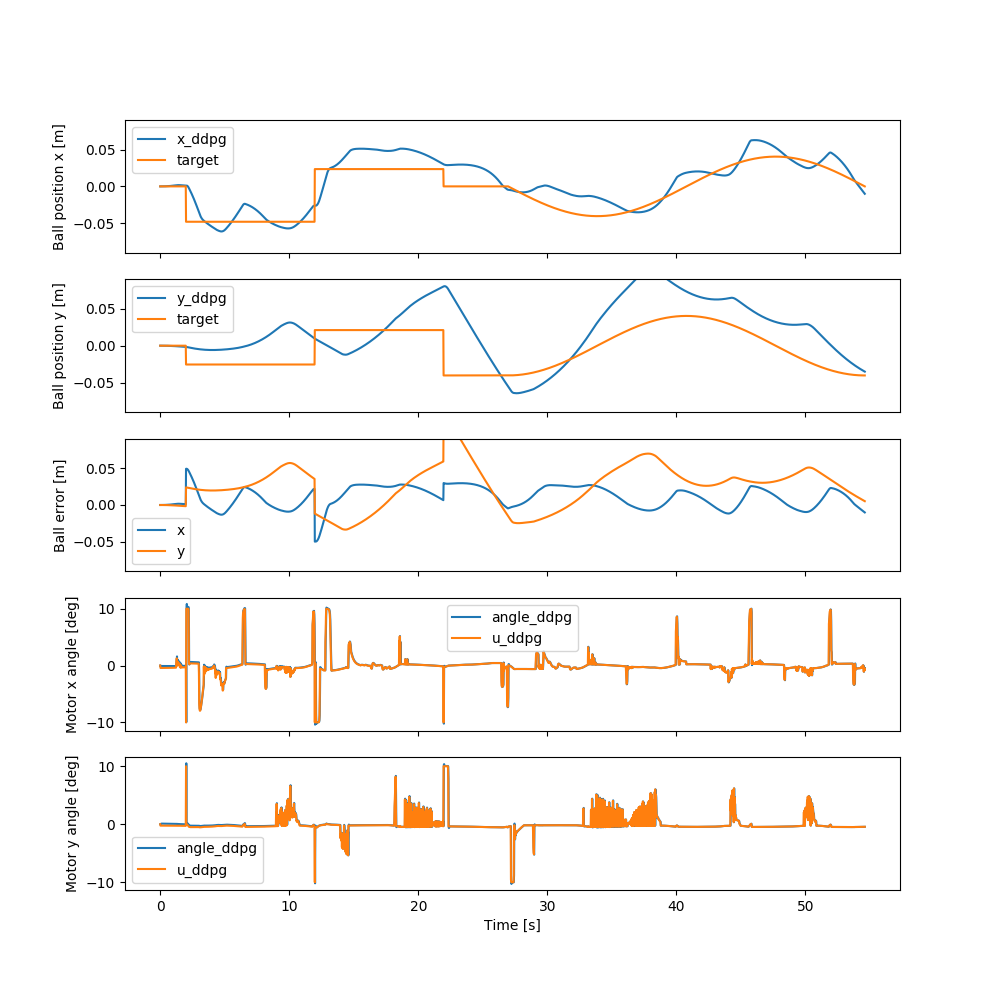

In [32]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100,50]
activation = torch.nn.ReLU
name='lep_0.6_[100,50]_relu_hard'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.000316180171608792


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


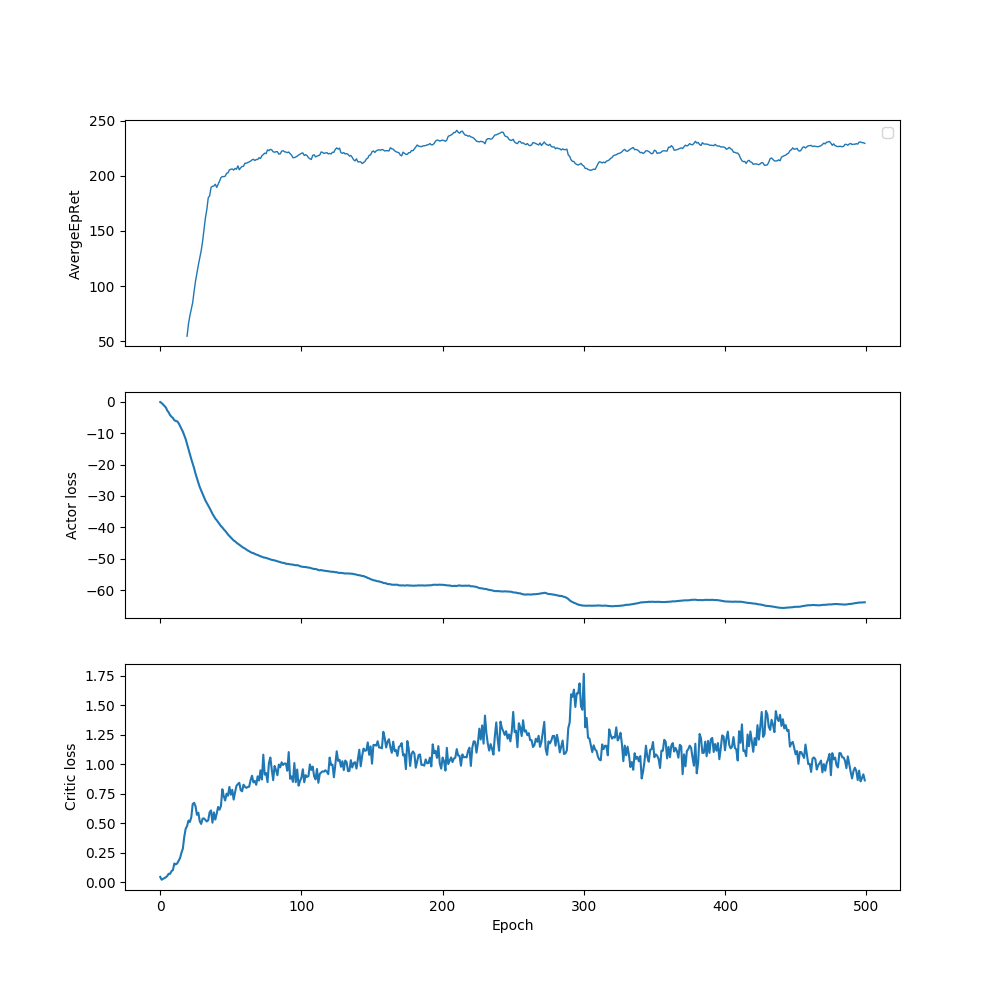

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


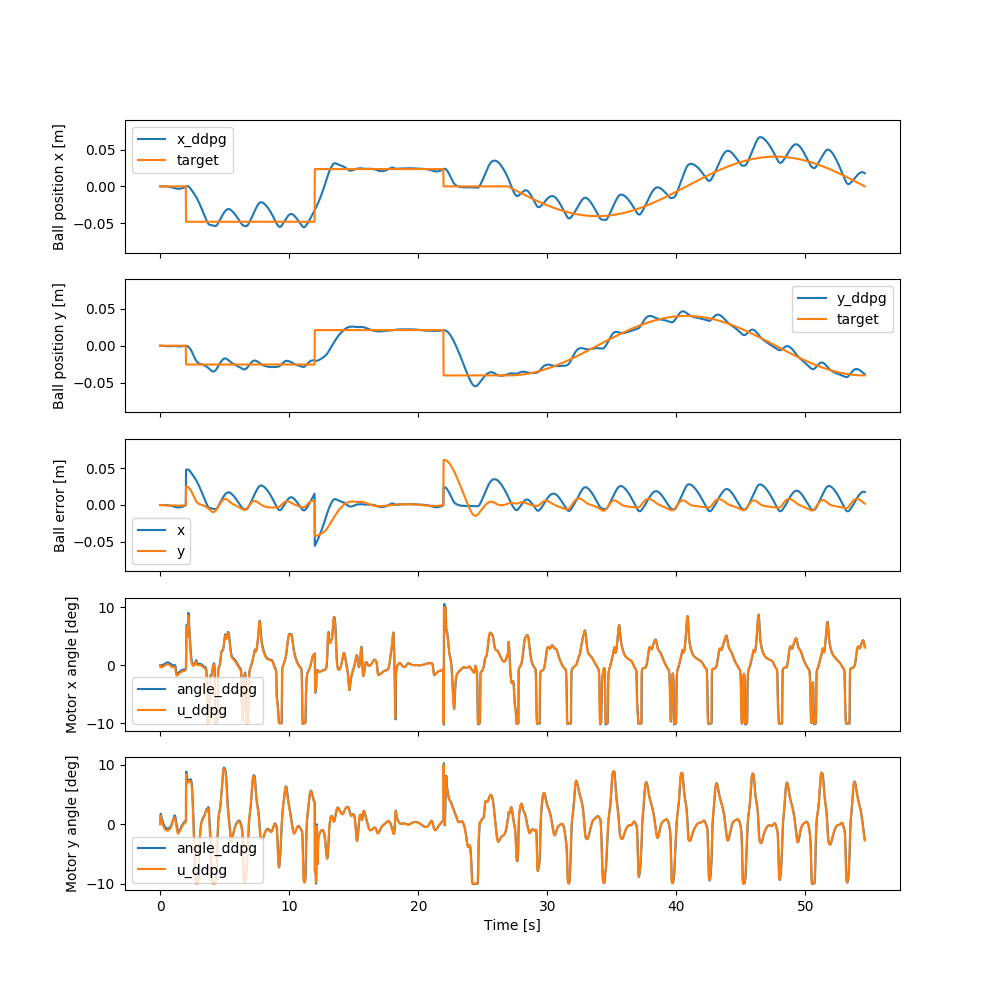

In [33]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [100,50,25]
activation = torch.nn.Sigmoid
name='lep_0.6_[100,50,25]_sigmoid_hard_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.0002967408074543564


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


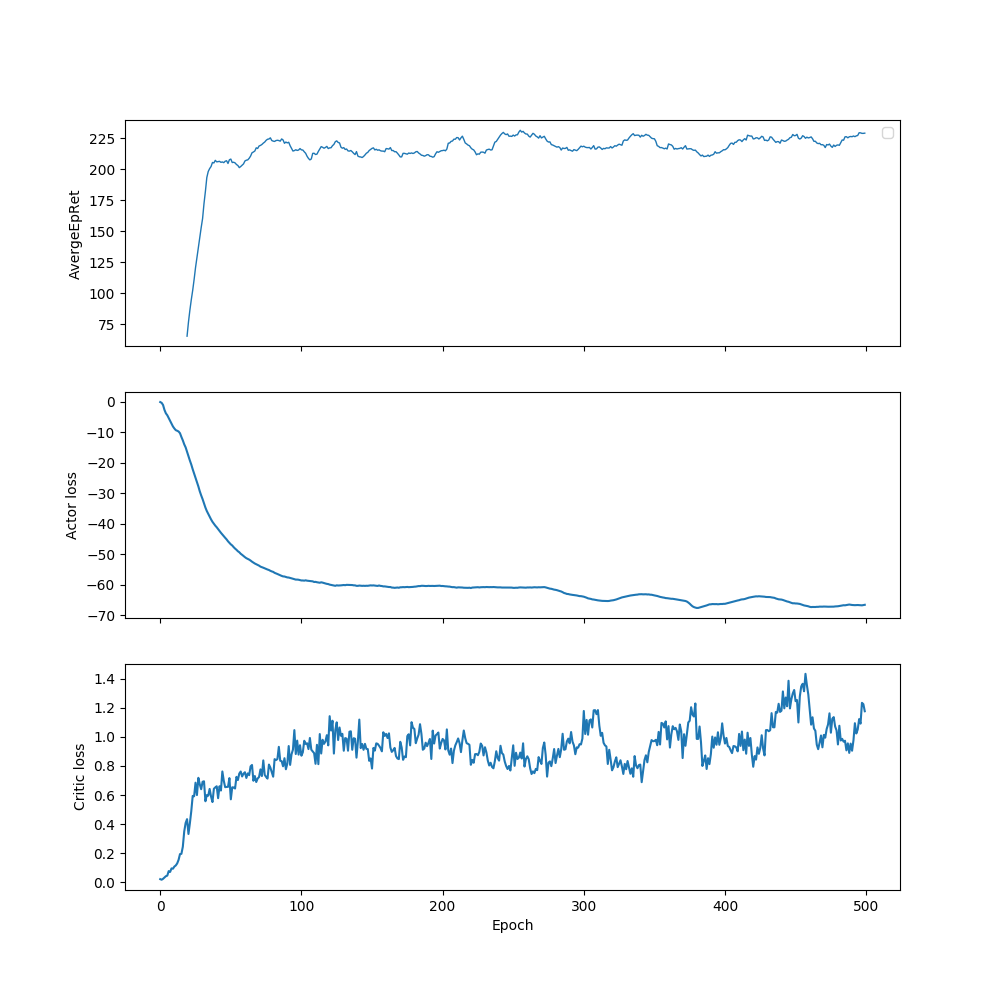

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


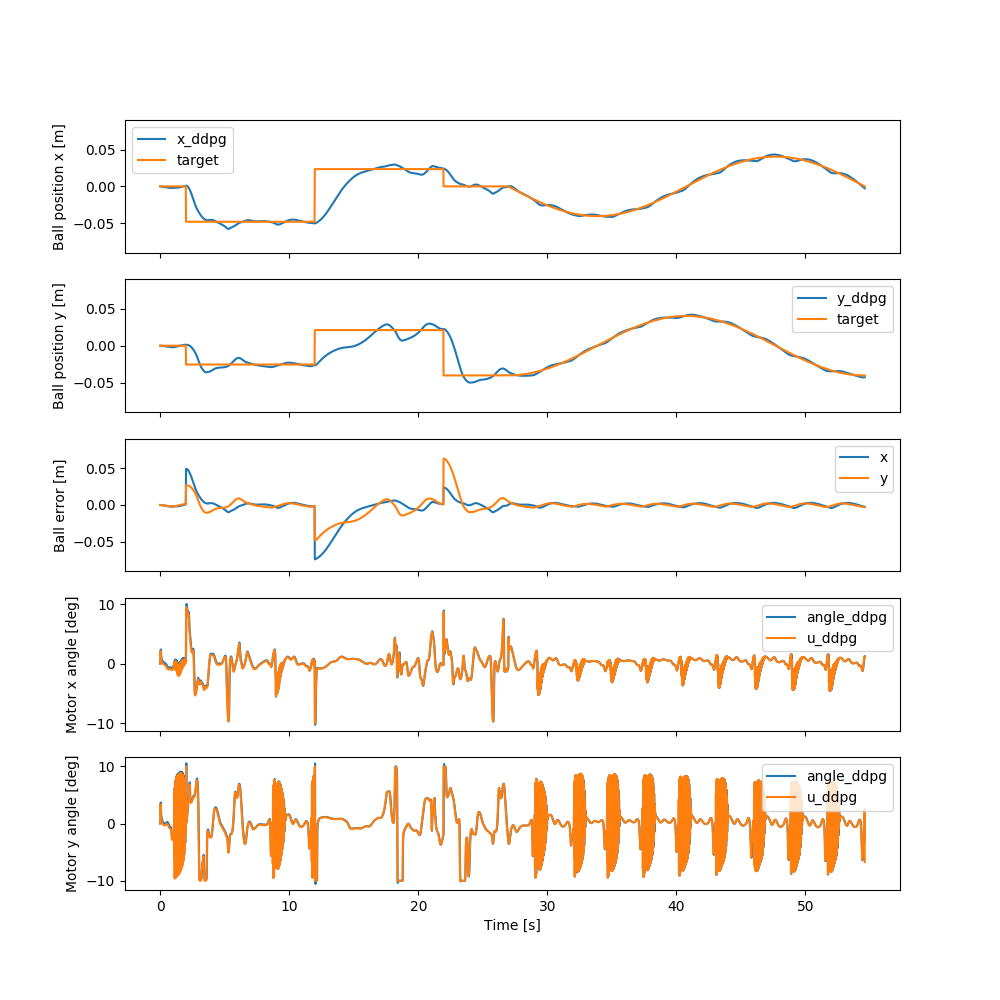

In [34]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400,200]
activation = torch.nn.Sigmoid
name='lep_0.6_[400,200]_sigmoid_hard_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.0002967408074543564


/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


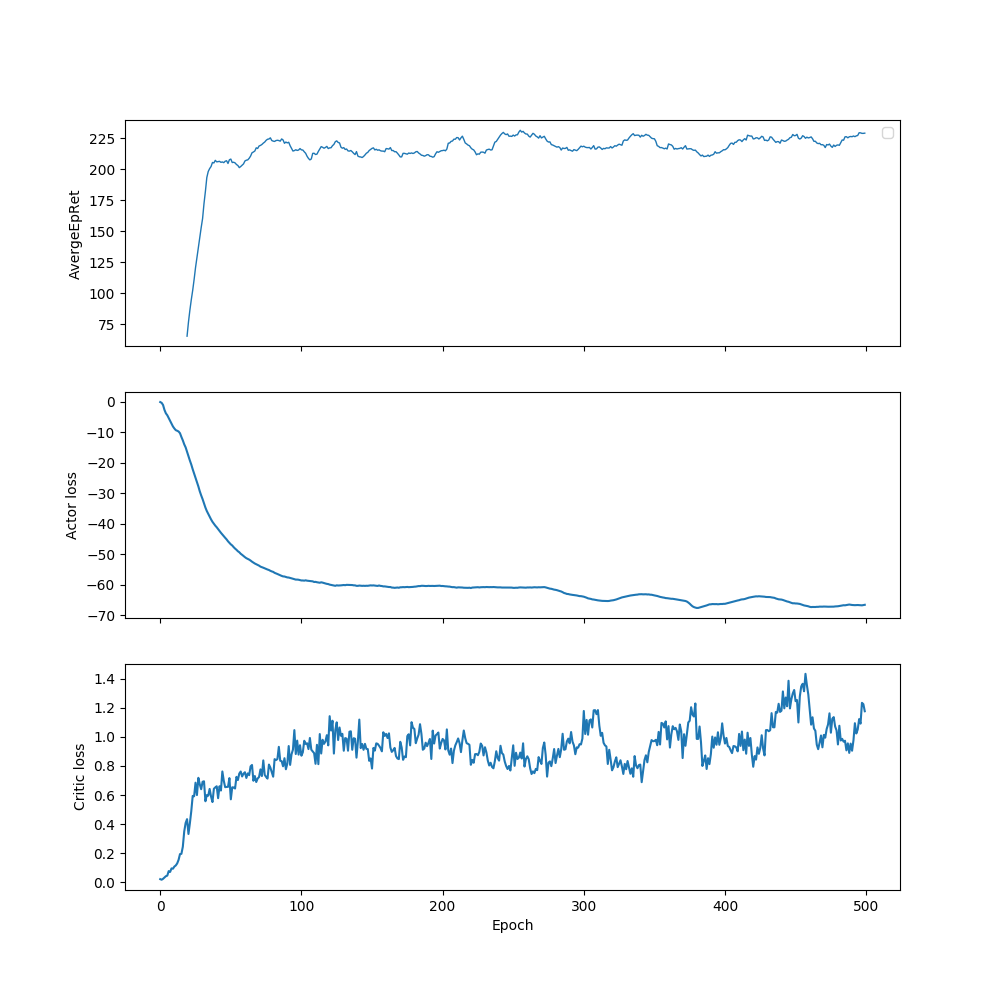

No handles with labels found to put in legend.
/home/benoit/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


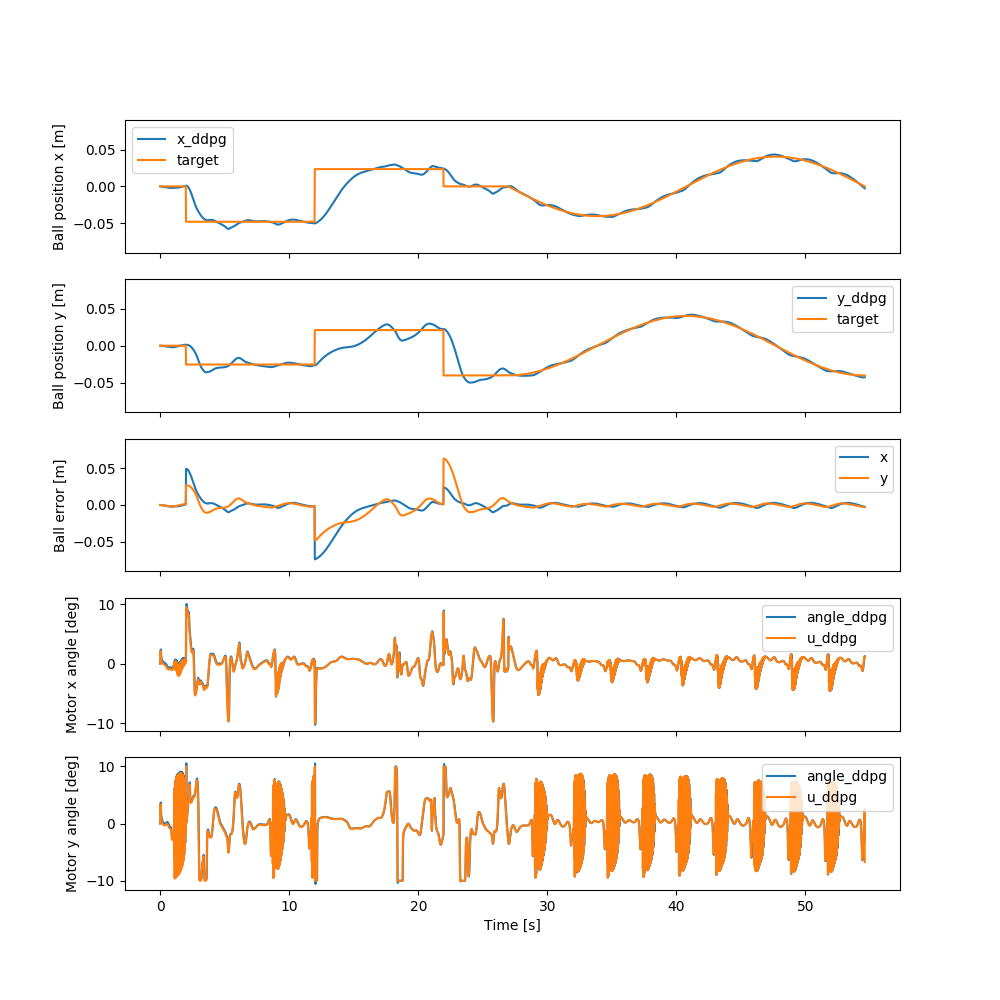

In [35]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [800,400]
activation = torch.nn.Sigmoid
name='lep_0.6_[400,200]_sigmoid_hard_long'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00023677267664441064


<IPython.core.display.Javascript object>


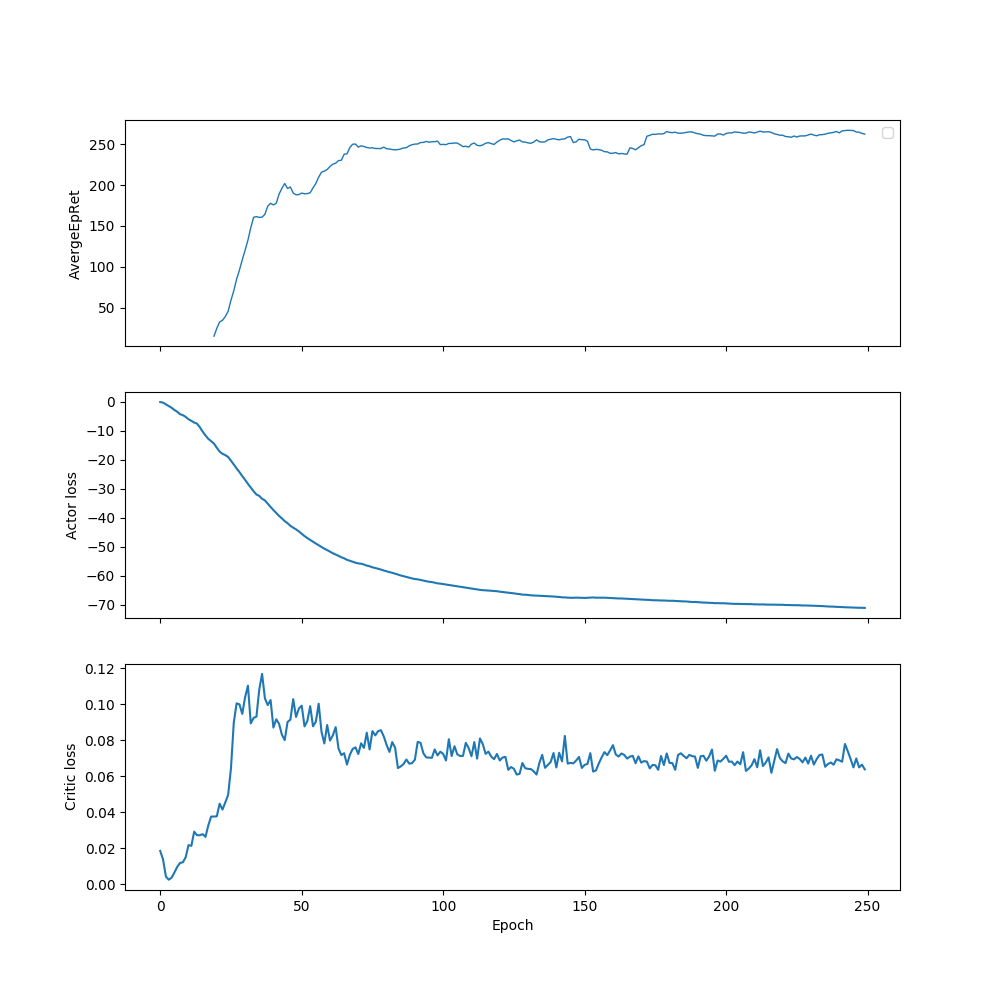

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


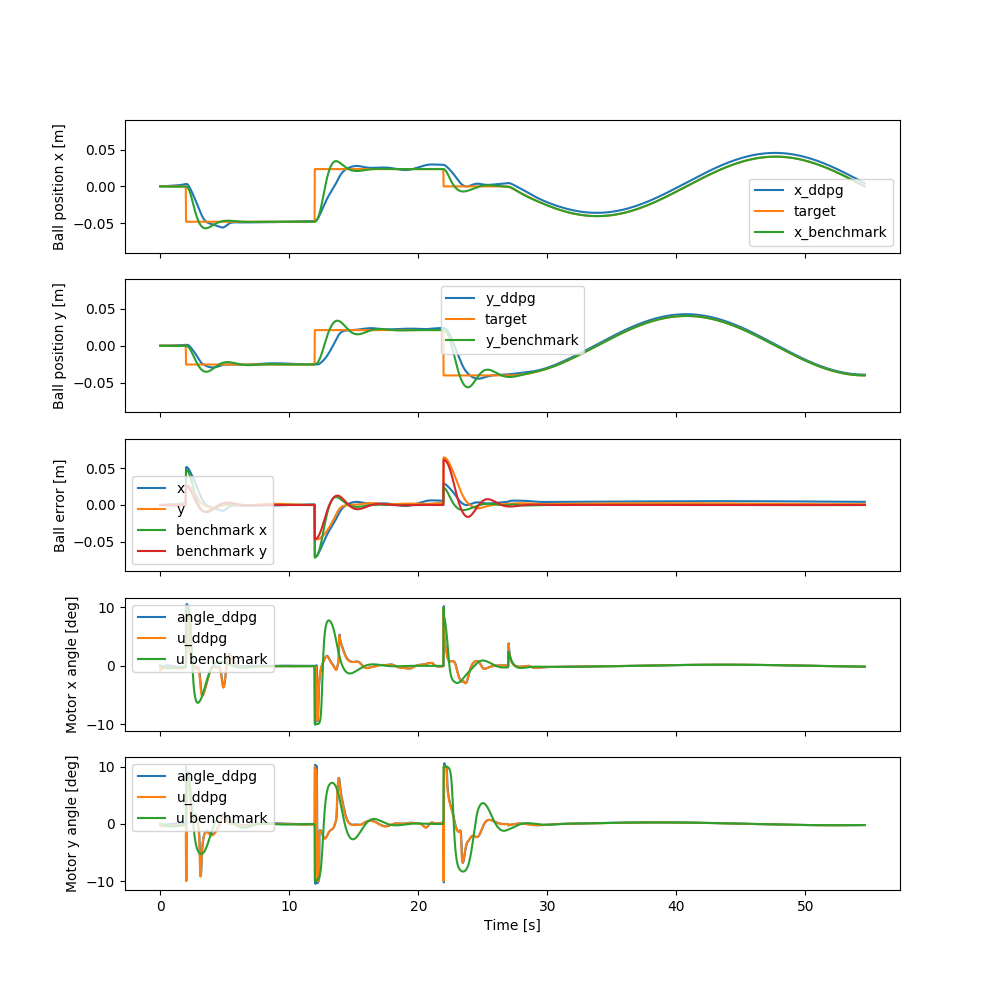

MSE ddpg -0.00023677267664441064
MSE benchmark 0.0001483028


In [10]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name, show_benchmark=True)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0.02310397, 0.02603342], dtype=float32), array([-0.03894892,  0.0504885 ], dtype=float32), array([-0.00146296, -0.00199146], dtype=float32))


/home/benoit/.local/lib/python3.6/site-packages/gym/logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


MSE : -0.00016657556771287145


<IPython.core.display.Javascript object>


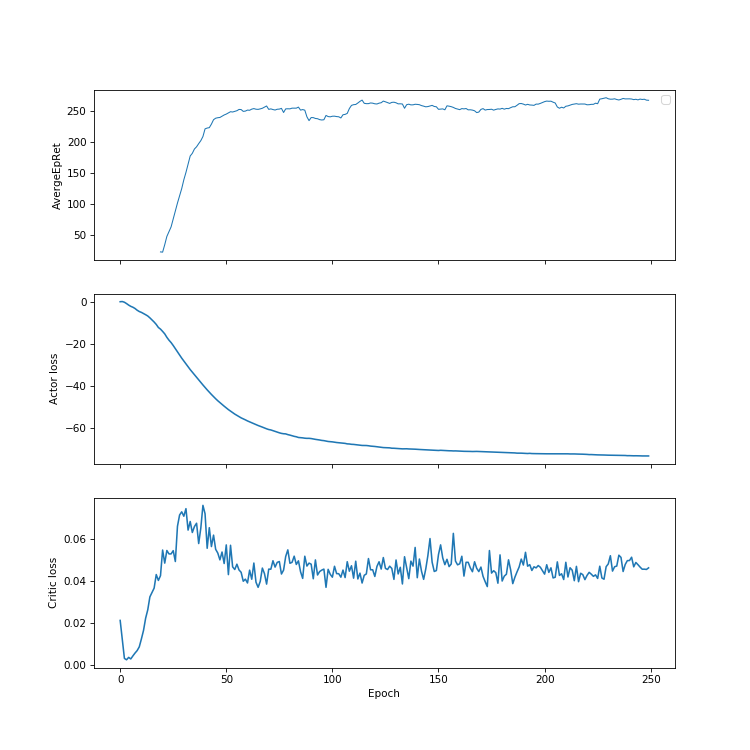

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


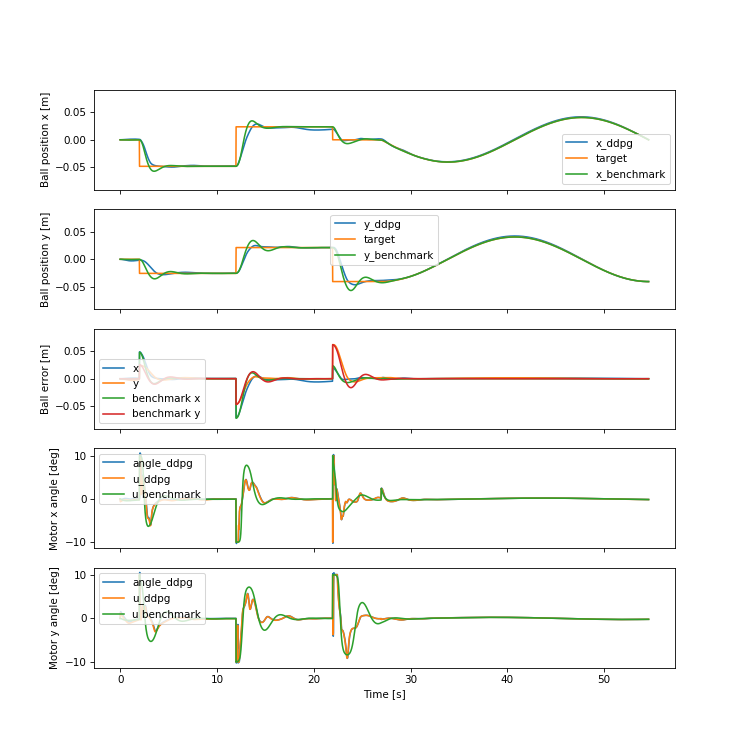

MSE ddpg -0.00016657556771287145
MSE benchmark 0.0001483028


In [16]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [400,200]
activation = torch.nn.Sigmoid
name='lep_0.6_[400,200]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name, show_benchmark=True)

{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'phy_coef': 217.59587893981333, 'phy_i_coef_u': 217.17632054282475, 'phy_i_coef_s': 7274.250340039798, 'speed_scaling': 20000}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'weights': [0.15728610754013062, 0.001560160541534424, 0.02386050671339035], 'bias': 0.05579447001218796}
{'phy_i_coef': [[0.004883899372829428, -0.0002783757757233037, -0.0028964127848784505, 0.0003109734119487393], [0.00014171512975994787, 0.002639176413894046, 6.8411362451718805e-06, -0.0016660219749745045]], 's_scaling': 1.0, 'sin_scaling': 7.0}
(array([0., 0.]), array([0., 0.]), array([0., 0.]))
MSE : -0.00019492495654978444


<IPython.core.display.Javascript object>


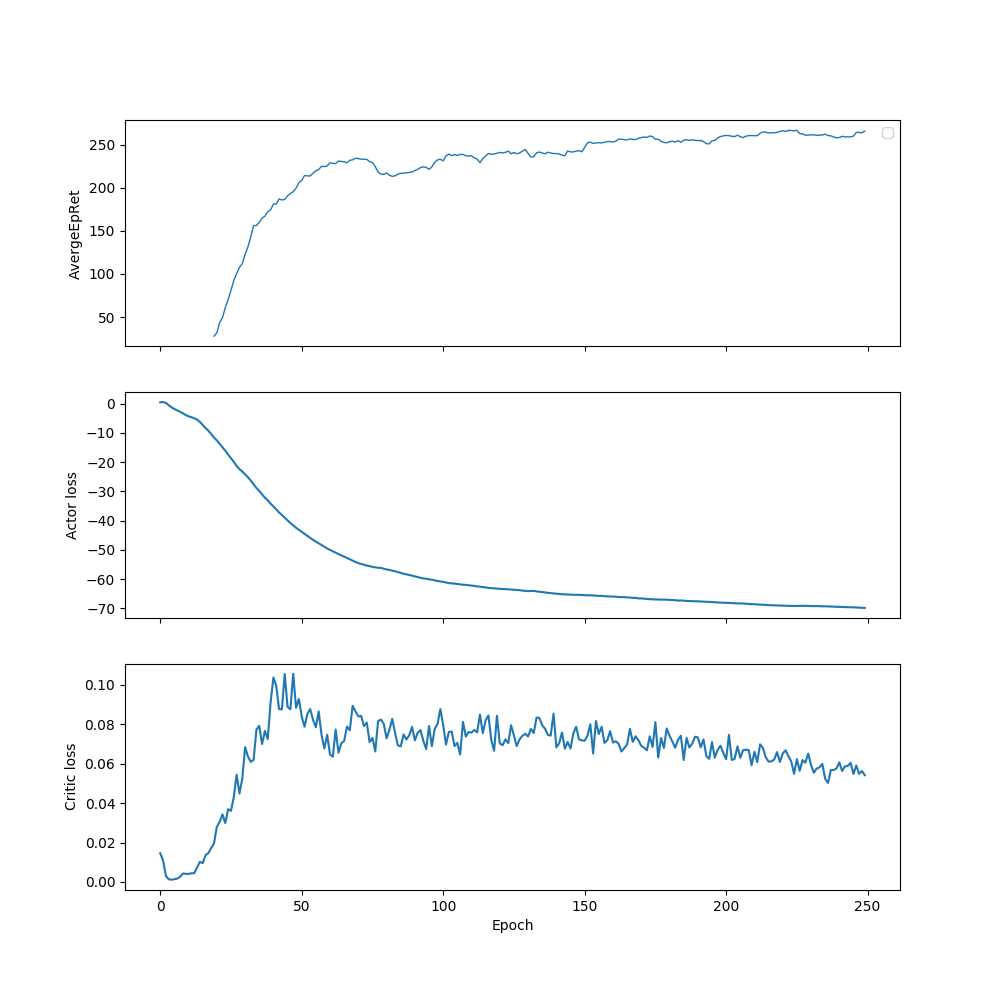

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>


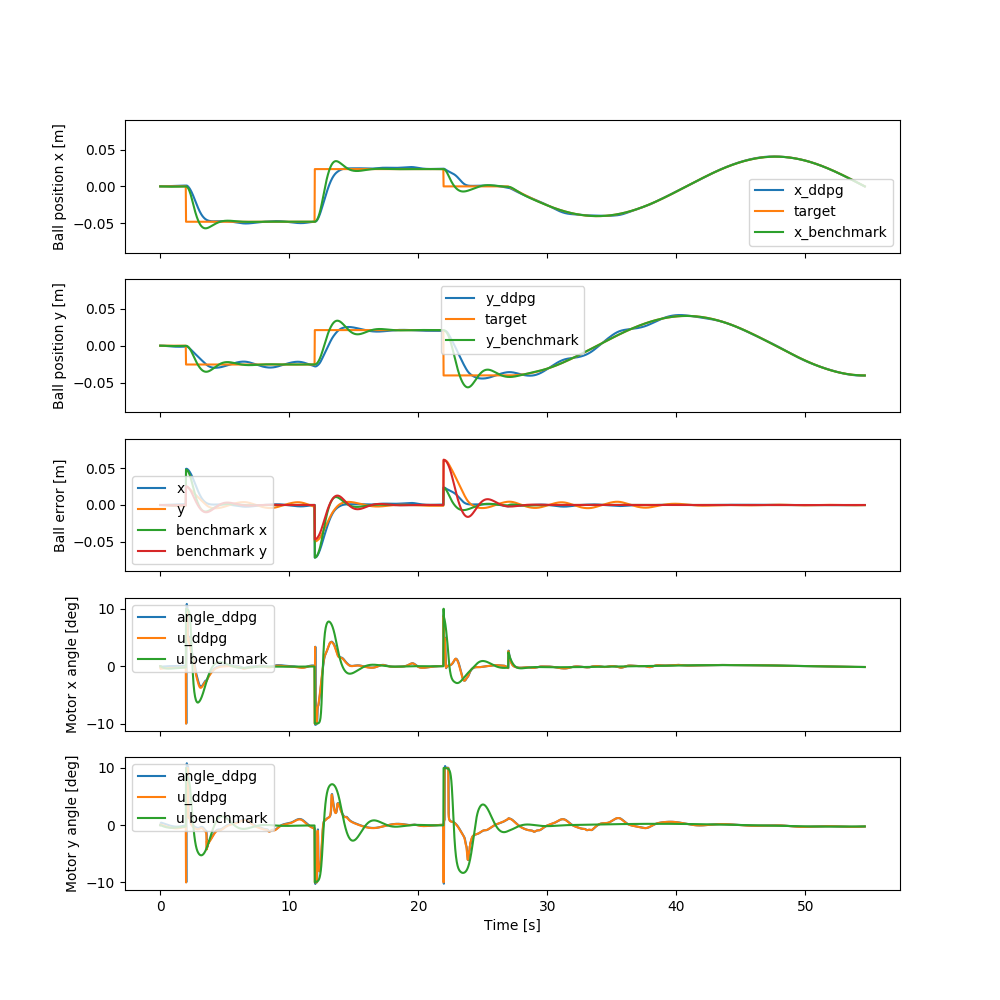

MSE ddpg -0.00019492495654978444
MSE benchmark 0.0001483028


In [12]:
env = BBEnv
ac = MLPActorCritic
reward_fn = linear_e_reward_penality
w = 0.6
hidden_size = [200,100,50]
activation = torch.nn.Sigmoid
name='lep_0.6_[200,100,50]_sigmoid'
train_ddpg(env, ac, reward_fn, w, hidden_size, activation, name, show_benchmark=True)